![STScI Logo](../../../_static/stsci_header.png)

<a id="titleFindsat"></a>
# Satellite trail detection in ACS/WFC data using acstools.findsat_mrt

This notebook provides examples of how to find and create masks for satellite trails in ACS/WFC imaging data using <a href= 'https://acstools.readthedocs.io/en/latest/findsat_mrt.html'>acstools.findsat_mrt</a>, which is based on the method described in <a href="https://www.stsci.edu/files/live/sites/www/files/home/hst/instrumentation/acs/documentation/instrument-science-reports-isrs/_documents/isr2208.pdf">ACS ISR 2022-08</a>. Many of the tools presented here should be applicable to any imaging data. 

## Table of Contents:

[Introduction](#intro_ID) <br>
[Imports, Setup, and Data](#imports) <br>

[Example 1: Step-by-step guide to find trails in an FLC image](#example1) <br>
[Example 2: Quick run on an FLC image](#example2)<br>
[Example 3: Find trails in an FLC image using the WFC wrapper](#example3) <br>
[Example 4: Step-by-step guide to find trails in a DRC image](#example4) <br>
[Example 5: Find trails in a DRC image using the WFC wrapper](#example5)<br>
[Example 6: Create a new kernel for detection](#example6)<br>
[About this Notebook](#about) <br>

<a id="intro_ID"></a>
## Introduction

Despite being in orbit, HST imaging data still suffers from contamination by artificial satellites that can compromise science data unless they are identified and masked. This notebook presents examples of how to identify satellite trails in ACS/WFC data. The routine is also effective at identifying other linear features such as <a href="https://hst-docs.stsci.edu/acsdhb/files/147982080/147982085/1/1700513637904/acs_Ch46.2.jpg">diffraction spikes</a> and <a href="https://hst-docs.stsci.edu/acsdhb/files/147982080/147982083/1/1700513637829/acs_Ch46.4.jpg">glint</a> (see <a href="https://hst-docs.stsci.edu/acsdhb/chapter-4-acs-data-processing-considerations/4-5-image-anomalies">Section 4.5 of the ACS DHB</a> for further discussion on these artifacts). 

A full description of the algorithm is provided in <a href="https://www.stsci.edu/files/live/sites/www/files/home/hst/instrumentation/acs/documentation/instrument-science-reports-isrs/_documents/isr2208.pdf">ACS ISR 2022-08</a>. To briefly summarize, the Median Radon Transform (MRT) is calculated for an input image and used to identify linear signals in the data. The MRT is similar to the standard <a href="https://en.wikipedia.org/wiki/Radon_transform">Radon Transform</a> except that it calculates the median, rather than the sum, of data along all possible paths through an image. This modification makes the algorithm more robust against false signals from localized sources (e.g., stars, galaxies) but still very sensitive to persistent linear features, even well-below the background noise level. 

Additional post-processing is done to filter out spurious detections, primarily eliminating them based on trail S/N, width, and persistence across the image. These parameters, especially the maximum allowed trail width, are tuned for ACS/WFC data binned 2x2 and may be different for images from other instruments. Once the final set of trails is identified and characterized, a mask can be created. The routine provides numerous ways of visualizing the results, as will be demonstrated below.

The following examples illustrate how to use `acstools.findsat_mrt` to identify satellite trails and then create masks for them. Examples 1 and 4 go through the analysis step by step, including how to preprocess data and run individual routines inside `findsat_mrt`. Examples 2, 3, and 5 demonstrate how to automate many of these steps. Our demonstrations stop at the creation of the masks. We leave it to the user to decide the best way to apply the masks to their own analysis.

<a id="imports"></a>
## Imports, setup, and data

It is recommended that you use the latest <a href="https://github.com/spacetelescope/stenv">stenv</a> python environment when using this notebook. In particular, you <b>must</b> use acstools v3.6.0 or greater in order to run this notebook. You can check you version with

`conda list acstools`

and update if necessary with

`conda update acstools`

Set your working directory and import the needed packages with the following

In [1]:
# Import modules and setup
import matplotlib.pyplot as plt
import numpy as np
from astroquery.mast import Observations
from astropy.io import fits
from astropy.nddata import bitmask, block_reduce, block_replicate
from acstools.findsat_mrt import TrailFinder, WfcWrapper
import os 
from acstools.utils_findsat_mrt import create_mrt_line_kernel
import shutil

In [2]:
# Check your own working directory
print('Current working directory is {}'.format(os.getcwd()))
# Define working directory if needed
# os.chdir('Insert your working directory here')

Current working directory is /home/runner/work/hst_notebooks/hst_notebooks/notebooks/ACS/acs_findsat_mrt


In [3]:
# These are optional configurations
%matplotlib inline
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams['font.serif'] = "Georgia"
plt.rcParams['font.family'] = "serif"

Download the example data needed and place it in the working directory that you defined above. Examples 1-3 use  <a href="https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/jc8m32j5q_flc.fits">jc8m32j5q_flc.fits</a>, while examples 4-5 use <a href="https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits">hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits</a>.

In [4]:
# Download data files
obs_table = Observations.query_criteria(proposal_id=13498, obs_id='JC8M32010')

dl_table = Observations.download_products(obs_table['obsid'], 
                                          dataURI=['mast:HST/product/hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits',
                                                   'mast:HST/product/jc8m32j5q_flc.fits'])
for row in dl_table:
    oldfname = row['Local Path']
    newfname = os.path.basename(oldfname)
    os.rename(oldfname, newfname)
    
shutil.rmtree('mastDownload')

 [Done]


 [Done]


<a id="example1"></a>

## Example 1: Finding trails in an FLC image

FLC images are individual exposures processed by the CALACS pipeline. The data contain two chips, but we only analyze one here. 

We start by reading in an image and doing some pre-processing to remove bad pixels, subtract a median background, and make the image a bit smaller (to speed up the calculation of the MRT).

In [5]:
# Read in the image files and header information
image_file = 'jc8m32j5q_flc.fits'
ext = 4  # ACS image data are in extensions 1 or 4, we'll just use 4 for now (chip 1)
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    dq = h[ext+2].data  # data quality bitmasks

    header = h[0].header  # primary header
    image_header = h[1].header  # image header

Below, we make a mask for bad pixels. We're ignoring cosmic rays here because routines to make them often partially (but not fully) mask trails. By default, any masked pixels are set to `NaN`. 

In [6]:
mask = bitmask.bitfield_to_boolean_mask(dq, ignore_flags=[4096, 8192, 16384])
image[mask] = np.nan

Below we subtract Subtract the background from the image. Here we just do a simple median.

In [7]:
image = image - np.nanmedian(image)

The MRT is computationally demanding and WFC images are big. To help things a bit, let's rebin the images.

In [8]:
binsize = 2  # adjust this as needed
image_rebin = block_reduce(image, binsize, func=np.nansum)

We now set up `TrailFinder`. Many of the parameters in the call below are optional (and set to their current values by default) but we show them to illustrate the setup. Of note is that I'm explicitly defining the image header keys to save. These can be useful later when analyzing trail population properties. The keywords being saved here were chosen to ensure we know the original exposure ippsoot and which chip was analyzed. Additional keywords are saved that store information about the orientation of the telescope when the image was taken. In principle, the user can save any header keywords they like. We have also set `plot=False` in this example, so we can demonstrate how to manually create plots. Setting `plot=True` will automatically generate plots after specific processes are finished. Be aware that not all possible keyword parameters are defined below. See the <a href="https://acstools.readthedocs.io/en/latest/api/acstools.findsat_mrt.TrailFinder.html#acstools.findsat_mrt.TrailFinder">documentation</a> for complete information.

In [9]:
# Now we can set up TrailFinder
s = TrailFinder(image=image_rebin,
                header=header,
                image_header=image_header,
                save_image_header_keys=['ROOTNAME', 'CCDCHIP', 'CRPIX1', 'CRPIX2', 'CRVAL1', 'CRVAL2',
                                        'ORIENTAT', 'RA_APER', 'DEC_APER', 'PA_APER'],
                processes=8,
                plot=False,
                threshold=5,
                max_width=75,  
                check_persistence=True,
                min_persistence=0.5,
                output_root='example1')

Before we actually run anything, let's plot the image we are analyzing. You should see two satellite trails in this example.

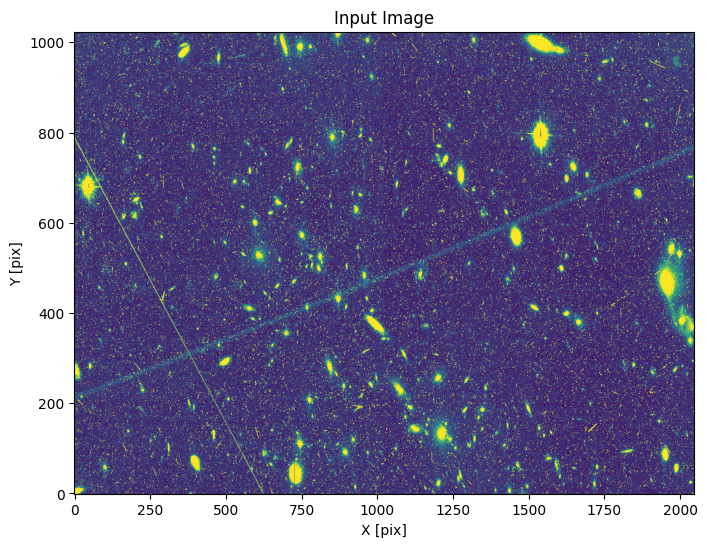

In [10]:
s.plot_image()

If you're having trouble seeing the trails, you can adjust the scale keyword (the min and max values to show given as multiples of the image standard deviation)

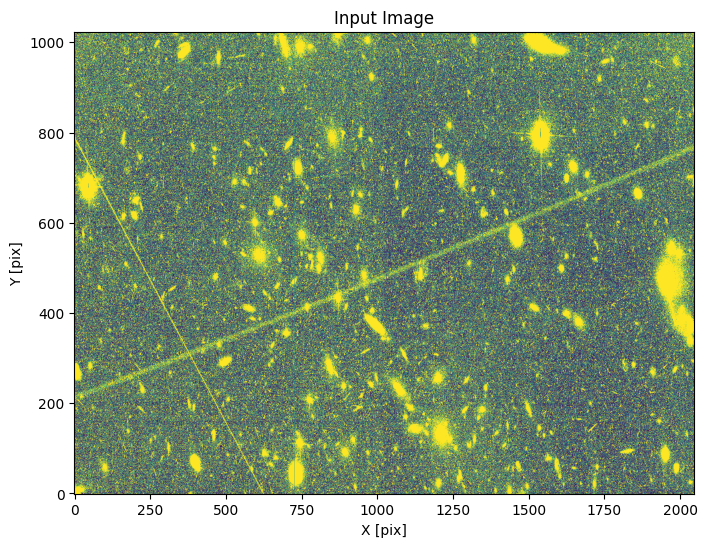

In [11]:
s.plot_image(scale=[-1, 1])

Next we run the Median Radon Transform. This step can take some time depending on the image size and number of processes being used. This tutorial assumes you can run 8 processes at the same time, but adjust as needed. If you're not sure how many processes you can run, you can see how many CPU cores are available and adjust based on that.

In [12]:
os.cpu_count()

4

In [13]:
s.processes = 8  # adjust this if necessary
s.run_mrt()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


Now we will plot the MRT. You may be able to spot the signals from the satellite trails as two somewhat wide point-like sources.

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

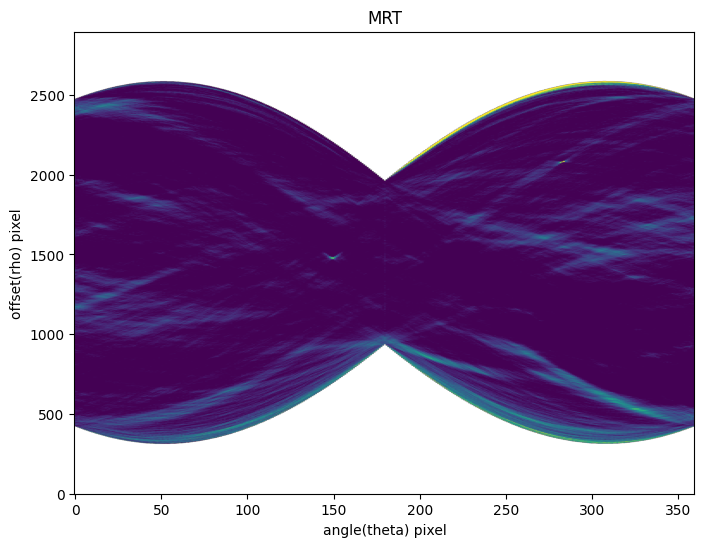

In [14]:
s.plot_mrt()

Note that the x axis in in pixels, not degrees or radians. The `theta` array ranges from 0 to 180 with a spacing of 0.5 degrees, hence 360 pixels.

We next run the source finder on the MRT. You can create your own detection kernels, or use the defaults provided (see [Example 6](#example6) for how to create detection kernels). Depending on the settings, this can pick up a lot more than the actual trails we're interested in. There are additional steps we'll take later to filter these false detections out. The ones we found and their location on the MRT are shown below.

The `threshold` in this case refers to the signal-to-noise ratio of a feature found in the MRT. The default is 5.

INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

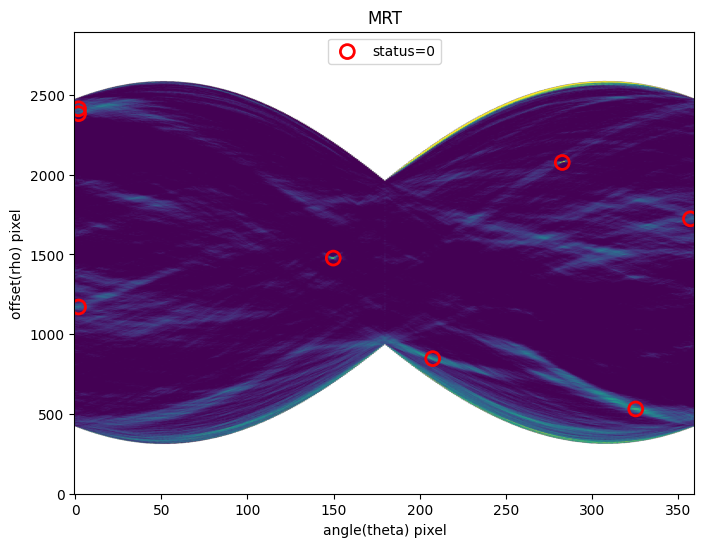

In [15]:
s.threshold = 5  # detection threshold
s.find_mrt_sources()  # finds the sources
s.plot_mrt(show_sources=True)  # overplots the sources on top of the MRT

We filter the sources further based on a reassessment of their S/N, width, and persistence. The default parameters (namely width) have been chosen for ACS data binned by 2 pixels in each direction. It's possible different defaults will be better for different imaging data.

In [16]:
# Parameters that affect how the filtering works
s.threshold = 5
s.max_width = 75
s.check_persistence = True
s.min_persistence = 0.5

# now filter
s.filter_sources()

# note: some extra columns have been added to the source list
s.source_list

INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.85134374437424
baseline noise: 1.137590873421488
snr of feature = 20.845589943623423


INFO:utils_findsat_mrt:width of feature = 28.121276073737363


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.80295752073702
baseline noise: 5.8949710877351755
snr of feature = 3.546749614515007


INFO:utils_findsat_mrt:width of feature = 26.679429594499652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.546749614515007, 26.679429594499652, 255.77779199490328


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.24848668241353
baseline noise: 4.392702667994342
snr of feature = 7.251978206156204


INFO:utils_findsat_mrt:width of feature = 26.74142532625251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.251978206156204, 26.74142532625251, 255.2847294967554


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.3721731832319
baseline noise: 4.602276841911111
snr of feature = 5.164812365231436


INFO:utils_findsat_mrt:width of feature = 24.049538003648706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.164812365231436, 24.049538003648706, 253.62853250389148


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.57327869547822
baseline noise: 5.257625496516683
snr of feature = 5.766035108253045


INFO:utils_findsat_mrt:width of feature = 24.99261428222701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.766035108253045, 24.99261428222701, 252.21577536948


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 37.76831723097134
baseline noise: 4.3892178072029395
snr of feature = 7.604794496411531


INFO:utils_findsat_mrt:width of feature = 31.586876494192126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.604794496411531, 31.586876494192126, 250.32154970750446


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.851067653707624
baseline noise: 4.085683870078729
snr of feature = 6.061502693587422


INFO:utils_findsat_mrt:width of feature = 22.69792714169992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.061502693587422, 22.69792714169992, 250.72299321670596


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.11919960860482
baseline noise: 5.3771671193623
snr of feature = 3.857427531785994


INFO:utils_findsat_mrt:width of feature = 18.584548369561674


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.857427531785994, 18.584548369561674, 249.94953486021134


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.26429439656128
baseline noise: 4.824130952470428
snr of feature = 7.553726008501059


INFO:utils_findsat_mrt:width of feature = 23.462089781879058


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.553726008501059, 23.462089781879058, 249.7241498236594


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.398923554876333
baseline noise: 8.988542228732667
snr of feature = 2.381963702379179


INFO:utils_findsat_mrt:width of feature = 20.099470600406164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.381963702379179, 20.099470600406164, 249.58779274988282


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.77916050062184
baseline noise: 4.796717507488486
snr of feature = 7.70994809166842


INFO:utils_findsat_mrt:width of feature = 43.302261450304655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.70994809166842, 43.302261450304655, 249.96273556131834


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.405266188630435
baseline noise: 5.411411251603305
snr of feature = 4.433936698105911


INFO:utils_findsat_mrt:width of feature = 28.548601115196618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.433936698105911, 28.548601115196618, 250.43347492059863


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.00939406509034
baseline noise: 4.851663972368001
snr of feature = 6.00984121299131


INFO:utils_findsat_mrt:width of feature = 27.348160537092895


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.00984121299131, 27.348160537092895, 249.11989629882186


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.79995958975927
baseline noise: 3.825031947034045
snr of feature = 6.006466863770938


INFO:utils_findsat_mrt:width of feature = 23.720752033596284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.006466863770938, 23.720752033596284, 250.02943993682337


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.741746073938135
baseline noise: 5.684005057626465
snr of feature = 4.232533358504388


INFO:utils_findsat_mrt:width of feature = 21.81865512197632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.232533358504388, 21.81865512197632, 251.07968094787933


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.270403135311795
baseline noise: 4.227307431908561
snr of feature = 7.580024925922242


INFO:utils_findsat_mrt:width of feature = 28.01967838063041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.580024925922242, 28.01967838063041, 251.12347496000612


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.00227505387567
baseline noise: 4.428151517142632
snr of feature = 5.775349700146515


INFO:utils_findsat_mrt:width of feature = 39.80983821331688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.775349700146515, 39.80983821331688, 250.41375911760622


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.998103373788382
baseline noise: 6.99001135447951
snr of feature = 2.862383335970806


INFO:utils_findsat_mrt:width of feature = 20.763285345477527


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.862383335970806, 20.763285345477527, 252.97734005655306


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.71683185528227
baseline noise: 4.87831640320331
snr of feature = 5.911571343167156


INFO:utils_findsat_mrt:width of feature = 25.221660523854837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.911571343167156, 25.221660523854837, 254.45819415567453


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.73564636435078
baseline noise: 3.9900478531624692
snr of feature = 6.201830008523636


INFO:utils_findsat_mrt:width of feature = 24.68538192372648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.201830008523636, 24.68538192372648, 255.15291896626206


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.673276208600775
baseline noise: 5.825518394230077
snr of feature = 3.9220128181211154


INFO:utils_findsat_mrt:width of feature = 27.647472754523733


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9220128181211154, 27.647472754523733, 256.05490386453874


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.810371480256073
baseline noise: 4.955440305191918
snr of feature = 5.419282550317009


INFO:utils_findsat_mrt:width of feature = 29.167154159168604


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.419282550317009, 29.167154159168604, 257.2404788549683


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 19
persistance score: 0.9047619047619048


INFO:utils_findsat_mrt:amplitude of feature: 138.77050466907062
baseline noise: 1.606968732509384
snr of feature = 85.35544790742235


INFO:utils_findsat_mrt:width of feature = 5.896104242563126


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 432.9015859502807
baseline noise: 4.921763046446005
snr of feature = 86.95660861058276


INFO:utils_findsat_mrt:width of feature = 3.9138548307723795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 86.95660861058276, 3.9138548307723795, 252.13674584848604


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 384.09221101323453
baseline noise: 6.543607050102543
snr of feature = 57.69732214546953


INFO:utils_findsat_mrt:width of feature = 3.947654848799232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.69732214546953, 3.947654848799232, 251.95524396965908


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 297.11074917894047
baseline noise: 5.696284216879781
snr of feature = 51.15869466248069


INFO:utils_findsat_mrt:width of feature = 3.9407768422871072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.15869466248069, 3.9407768422871072, 251.7759209305916


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.59389228229958
baseline noise: 4.055498965413468
snr of feature = 51.421143266307084


INFO:utils_findsat_mrt:width of feature = 4.00212886883952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.421143266307084, 4.00212886883952, 251.54435486809038


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 230.99833348320408
baseline noise: 4.325795649934228
snr of feature = 52.40019551934136


INFO:utils_findsat_mrt:width of feature = 4.087830687386088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 52.40019551934136, 4.087830687386088, 251.25231487676913


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.4037264578963
baseline noise: 4.654908157852622
snr of feature = 44.20040338560808


INFO:utils_findsat_mrt:width of feature = 3.9819703824084627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.20040338560808, 3.9819703824084627, 250.96518589178098


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.72701666938164
baseline noise: 5.798152503849695
snr of feature = 25.85804082696796


INFO:utils_findsat_mrt:width of feature = 4.125142122705597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.85804082696796, 4.125142122705597, 250.6475864735257


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 158.18090543865344
baseline noise: 4.1929329139549125
snr of feature = 36.72559892675507


INFO:utils_findsat_mrt:width of feature = 3.9570222288493824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.72559892675507, 3.9570222288493824, 250.30613300045775


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.42826557243143
baseline noise: 5.2329569663303666
snr of feature = 31.56825283849888


INFO:utils_findsat_mrt:width of feature = 4.0416888100627375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.56825283849888, 4.0416888100627375, 249.87751996123956


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 161.22026581592434
baseline noise: 7.3283704817681325
snr of feature = 20.999469898119337


INFO:utils_findsat_mrt:width of feature = 3.740208060372254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.999469898119337, 3.740208060372254, 249.4414928157351


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.44201640844748
baseline noise: 1.703324109409356
snr of feature = 4.543288183551625


INFO:utils_findsat_mrt:width of feature = 82.06123612124969


INFO:utils_findsat_mrt:amplitude of feature: 8.847591758782066
baseline noise: 1.3135020724442255
snr of feature = 5.735879557706413


INFO:utils_findsat_mrt:width of feature = 151.80072666231368


INFO:utils_findsat_mrt:amplitude of feature: 21.827496984720664
baseline noise: 2.1593238227351343
snr of feature = 9.108487089755993


INFO:utils_findsat_mrt:width of feature = 184.07399665959394


INFO:utils_findsat_mrt:amplitude of feature: 18.317704948860804
baseline noise: 2.007344851337601
snr of feature = 8.125340340328039


INFO:utils_findsat_mrt:width of feature = 80.64622454135684


INFO:utils_findsat_mrt:amplitude of feature: 6.295960794497887
baseline noise: 1.7132740836423261
snr of feature = 2.6748123692579426


INFO:utils_findsat_mrt:width of feature = 125.10368985450023


INFO:utils_findsat_mrt:amplitude of feature: 7.985938087290943
baseline noise: 1.8057651847391198
snr of feature = 3.4224676357600043


INFO:utils_findsat_mrt:width of feature = 106.97008887814349


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,149.82861105630025,1477.0451590340901,10.006171249354978,0.8268922957188881,90.34106279991074,25.149939411833273,1165.2352429959637,-7.66603402890213,74.91430552815012,29.045159034090148,0.0 .. 757.305511828876,2,21.61210315571154,28.121276073737363,20.845589943623423,0.9047619047619048
2,282.7930548471648,2076.538451998981,8.800963835960973,0.8647258022487747,75.7116922228596,144.16125171338146,986.0911168096113,-7.484792616205265,141.3965274235824,628.5384519989811,-0.0 .. 0.0,2,117.66088518106241,5.896104242563126,85.35544790742235,1.0
3,1.89809792226805,1170.3959668163084,11.951226986809722,0.9226991489096155,89.57443075089688,10.009226284894828,757.599247824086,-7.198598837024701,0.949048961134025,-277.6040331836916,737.384603915152 .. 1023.0,0,5.085377142178139,82.06123612124969,4.543288183551625,0.0
6,1.8911698330322249,2413.2033122115918,12.475743100358333,0.9262535197104634,90.33860518338149,9.658328843568405,762.3237537315119,-7.205348631098291,0.9455849165161124,965.2033122115918,1980.392429675209 .. 1023.0,0,5.992433762820587,151.80072666231368,5.735879557706413,0.0
7,325.4191609883813,531.0140194812167,12.201247168146102,0.782678441363821,94.23320001272329,14.20490443848111,1729.499125819428,-8.094800867087436,162.70958049419065,-916.9859805187833,1824.6646136781749 .. 308.7426298533246,0,13.372181269678208,184.07399665959394,9.108487089755993,0.0
8,207.53927900215038,846.645153454569,12.721015597702415,0.8326372642315713,96.55462790845331,11.393139132531816,1184.4466627326246,-7.683788771548504,103.76963950107519,-601.354846545431,1462.7723071956195 .. 879.828126312588,0,11.765573068726574,80.64622454135684,8.125340340328039,0.0
11,357.19328553056397,1723.1829480245503,12.128447023837875,0.9281173095869734,88.70264997532271,8.749244365744588,593.6695771508787,-6.933861984728694,178.59664276528198,275.18294802455034,735.7037079417825 .. 0.0,0,3.505090290066271,125.10368985450023,2.6748123692579426,0.0
13,1.9262041668737042,2382.6056474848383,11.44419953058279,0.9164749874267282,87.34159246944431,8.51827791258439,543.7745194741929,-6.838547133215959,0.9631020834368521,934.6056474848383,1949.6389326258109 .. 1023.0,0,5.660628617313041,106.97008887814349,3.4224676357600043,0.0


Several columns have been added to the source list that characterize the observed streak. Also, the `status` array has values of 0, 1, and 2 now (it just had 0 before). Those with `status=2` are sources that passed all filtering stages (checks for SNR and width, then persistence). Those with `status=1` are sources that passed the first filtering stage (checks for SNR and width), but not the second (persistence check). And `status=0` are sources that did not pass the filtering steps.

The `plot_mrt` command will overplot the different statuses

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

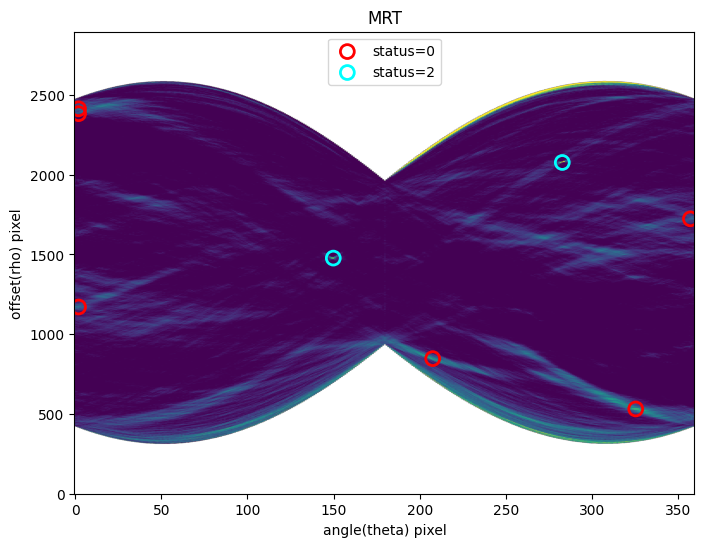

In [17]:
s.plot_mrt(show_sources=True)

Now we can make the mask itself. By default it only uses sources in the MRT with `status=2`. We make two types of masks, one a simple boolean mask, and one a segementation mask where pixels corresponding to each streak are assigned the ID number. We create these below.

In [18]:
# make the mask
s.mask_include_status = [2]
s.make_mask()

<Axes: title={'center': 'Segmentation Mask'}>

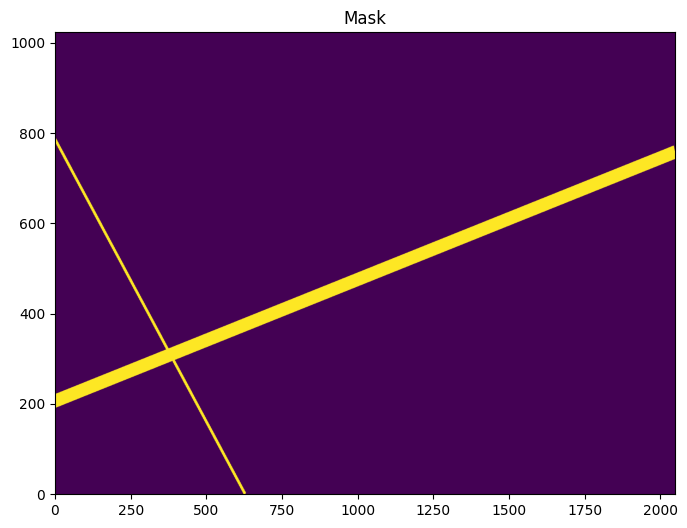

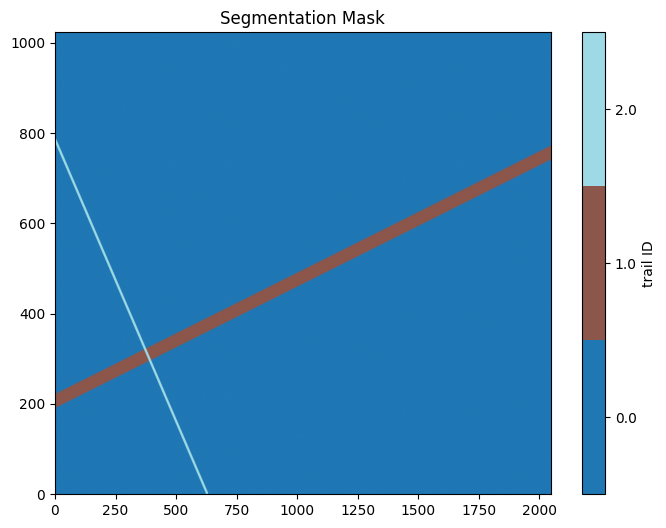

In [19]:
# plot the mask and segmentation map
s.plot_mask()
s.plot_segment()

We can also overlay the mask on top of the image to make sure it makes sense.

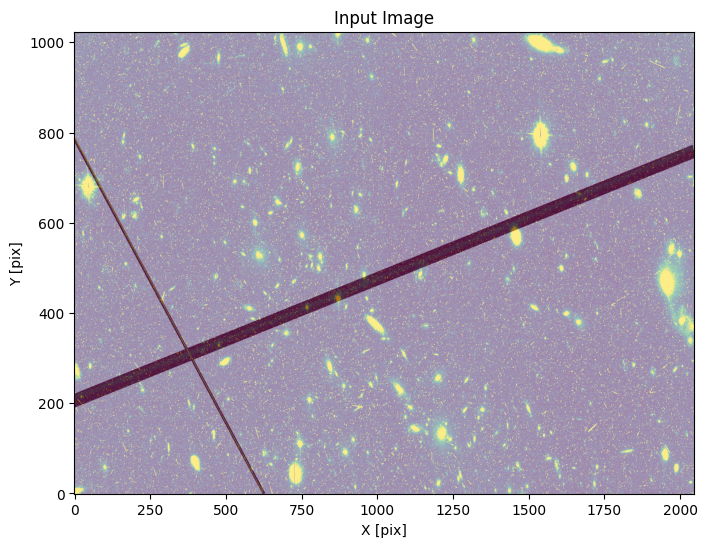

In [20]:
s.plot_image(overlay_mask=True)

We can save the results now. You have the optional of saving the catalog, mask, MRT, and a diagnostic image that shows the results. In this example we'll just save everything.

In [21]:
# define what to save
s.save_mask = True
s.save_mrt = True
s.save_catalog = True
s.save_diagnostic = True

s.save_output()

INFO:findsat_mrt:Wrote MRT to ./example1_mrt.fits


INFO:findsat_mrt:Wrote mask to ./example1_mask.fits


INFO:findsat_mrt:Wrote diagnostic plot to ./example1_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example1_catalog.fits


Keep in mind that the mask we have created is applicable to the rebinned image. To convert it into a mask that can be applied to the original unbinned image, we need to resample it using the `block_replicate` function. The rescaled mask is plotted below. Note the difference in image size, but the mask pattern remains the same.

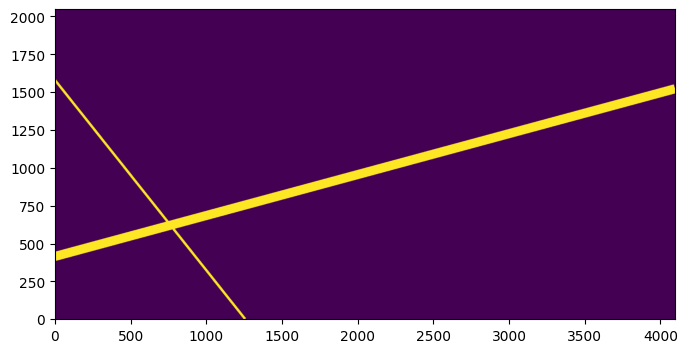

In [22]:
full_mask = block_replicate(s.mask, binsize, conserve_sum=False)
fig, ax = plt.subplots()
ax.imshow(full_mask, origin='lower')

## <a id="example2"></a>
## Example 2: Quick run of TrailFinder on an flc image

Example 1 thoroughly demonstrated the steps to read in an FLC file, pre-process it, and identify trails. This example demonstrates how one can run many of the steps simultaneously once a file is read in an all parameters set. 

First, we read in and preprocess the data file exactly as before.

In [23]:
# Read in the image files and header information
image_file = 'jc8m32j5q_flc.fits'
ext = 4  # ACS image data are in extensions 1 or 4, we'll just use 1 for now
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    dq = h[ext+2].data  # data quality bitmasks
    
    header = h[0].header  # primary header
    image_header = h[1].header  # image header

# make a mask for bad pixels.
mask = bitmask.bitfield_to_boolean_mask(dq, ignore_flags=[4096, 8192, 16384])
image[mask] = np.nan

# Subtract the background from the image.
image = image - np.nanmedian(image)

# Rebin the image to speed up calculation
image_rebin = block_reduce(image, 2, func=np.nansum)
print(image)

[[ 5.3736755e+01  7.7890381e+01  8.2120300e+01 ... -3.5018158e+00
   6.0512695e+00  2.1753464e+01]
 [ 1.1062138e+02  1.1139723e+02  8.5755035e+01 ...  1.4401169e+01
  -6.8589935e+00  2.6798096e+00]
 [ 1.2610365e+02  8.3222504e+01  1.2416469e+02 ...  5.4321777e+02
   1.4529060e+03  1.2576141e+01]
 ...
 [-7.8191071e+00  1.1923523e+01 -1.3846893e+01 ...  3.0264725e+01
   9.3594208e+00 -1.3950577e+01]
 [-8.7508545e+00 -1.7801208e+00  2.6363434e+01 ...  1.9217484e+01
  -4.5379639e-02 -6.7401886e+00]
 [           nan            nan            nan ...            nan
             nan            nan]]


And initialize trail finder as before

In [24]:
s2 = TrailFinder(image=image_rebin,
                 header=header,
                 image_header=image_header,
                 save_image_header_keys=['ROOTNAME', 'CCDCHIP', 'CRPIX1', 'CRPIX2', 'CRVAL1', 'CRVAL2',
                                         'ORIENTAT', 'RA_APER', 'DEC_APER', 'PA_APER'],
                 processes=8,
                 plot=False,
                 threshold=5,
                 max_width=75,  
                 check_persistence=True,
                 min_persistence=0.5,
                 output_root='example2')

If you're feeling ok about the setup, run all the subsequent steps together with the `run_all` command (this calculates the MRT, finds MRT sources, filters the sources, and saves the output)

In [25]:
s2.run_all()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.85134374437424
baseline noise: 1.137590873421488
snr of feature = 20.845589943623423


INFO:utils_findsat_mrt:width of feature = 28.121276073737363


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.80295752073702
baseline noise: 5.8949710877351755
snr of feature = 3.546749614515007


INFO:utils_findsat_mrt:width of feature = 26.679429594499652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.546749614515007, 26.679429594499652, 255.77779199490328


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.24848668241353
baseline noise: 4.392702667994342
snr of feature = 7.251978206156204


INFO:utils_findsat_mrt:width of feature = 26.74142532625251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.251978206156204, 26.74142532625251, 255.2847294967554


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.3721731832319
baseline noise: 4.602276841911111
snr of feature = 5.164812365231436


INFO:utils_findsat_mrt:width of feature = 24.049538003648706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.164812365231436, 24.049538003648706, 253.62853250389148


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.57327869547822
baseline noise: 5.257625496516683
snr of feature = 5.766035108253045


INFO:utils_findsat_mrt:width of feature = 24.99261428222701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.766035108253045, 24.99261428222701, 252.21577536948


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 37.76831723097134
baseline noise: 4.3892178072029395
snr of feature = 7.604794496411531


INFO:utils_findsat_mrt:width of feature = 31.586876494192126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.604794496411531, 31.586876494192126, 250.32154970750446


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.851067653707624
baseline noise: 4.085683870078729
snr of feature = 6.061502693587422


INFO:utils_findsat_mrt:width of feature = 22.69792714169992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.061502693587422, 22.69792714169992, 250.72299321670596


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.11919960860482
baseline noise: 5.3771671193623
snr of feature = 3.857427531785994


INFO:utils_findsat_mrt:width of feature = 18.584548369561674


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.857427531785994, 18.584548369561674, 249.94953486021134


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.26429439656128
baseline noise: 4.824130952470428
snr of feature = 7.553726008501059


INFO:utils_findsat_mrt:width of feature = 23.462089781879058


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.553726008501059, 23.462089781879058, 249.7241498236594


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.398923554876333
baseline noise: 8.988542228732667
snr of feature = 2.381963702379179


INFO:utils_findsat_mrt:width of feature = 20.099470600406164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.381963702379179, 20.099470600406164, 249.58779274988282


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.77916050062184
baseline noise: 4.796717507488486
snr of feature = 7.70994809166842


INFO:utils_findsat_mrt:width of feature = 43.302261450304655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.70994809166842, 43.302261450304655, 249.96273556131834


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.405266188630435
baseline noise: 5.411411251603305
snr of feature = 4.433936698105911


INFO:utils_findsat_mrt:width of feature = 28.548601115196618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.433936698105911, 28.548601115196618, 250.43347492059863


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.00939406509034
baseline noise: 4.851663972368001
snr of feature = 6.00984121299131


INFO:utils_findsat_mrt:width of feature = 27.348160537092895


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.00984121299131, 27.348160537092895, 249.11989629882186


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.79995958975927
baseline noise: 3.825031947034045
snr of feature = 6.006466863770938


INFO:utils_findsat_mrt:width of feature = 23.720752033596284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.006466863770938, 23.720752033596284, 250.02943993682337


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.741746073938135
baseline noise: 5.684005057626465
snr of feature = 4.232533358504388


INFO:utils_findsat_mrt:width of feature = 21.81865512197632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.232533358504388, 21.81865512197632, 251.07968094787933


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.270403135311795
baseline noise: 4.227307431908561
snr of feature = 7.580024925922242


INFO:utils_findsat_mrt:width of feature = 28.01967838063041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.580024925922242, 28.01967838063041, 251.12347496000612


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.00227505387567
baseline noise: 4.428151517142632
snr of feature = 5.775349700146515


INFO:utils_findsat_mrt:width of feature = 39.80983821331688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.775349700146515, 39.80983821331688, 250.41375911760622


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.998103373788382
baseline noise: 6.99001135447951
snr of feature = 2.862383335970806


INFO:utils_findsat_mrt:width of feature = 20.763285345477527


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.862383335970806, 20.763285345477527, 252.97734005655306


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.71683185528227
baseline noise: 4.87831640320331
snr of feature = 5.911571343167156


INFO:utils_findsat_mrt:width of feature = 25.221660523854837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.911571343167156, 25.221660523854837, 254.45819415567453


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.73564636435078
baseline noise: 3.9900478531624692
snr of feature = 6.201830008523636


INFO:utils_findsat_mrt:width of feature = 24.68538192372648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.201830008523636, 24.68538192372648, 255.15291896626206


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.673276208600775
baseline noise: 5.825518394230077
snr of feature = 3.9220128181211154


INFO:utils_findsat_mrt:width of feature = 27.647472754523733


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9220128181211154, 27.647472754523733, 256.05490386453874


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.810371480256073
baseline noise: 4.955440305191918
snr of feature = 5.419282550317009


INFO:utils_findsat_mrt:width of feature = 29.167154159168604


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.419282550317009, 29.167154159168604, 257.2404788549683


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 19
persistance score: 0.9047619047619048


INFO:utils_findsat_mrt:amplitude of feature: 138.77050466907062
baseline noise: 1.606968732509384
snr of feature = 85.35544790742235


INFO:utils_findsat_mrt:width of feature = 5.896104242563126


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 432.9015859502807
baseline noise: 4.921763046446005
snr of feature = 86.95660861058276


INFO:utils_findsat_mrt:width of feature = 3.9138548307723795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 86.95660861058276, 3.9138548307723795, 252.13674584848604


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 384.09221101323453
baseline noise: 6.543607050102543
snr of feature = 57.69732214546953


INFO:utils_findsat_mrt:width of feature = 3.947654848799232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.69732214546953, 3.947654848799232, 251.95524396965908


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 297.11074917894047
baseline noise: 5.696284216879781
snr of feature = 51.15869466248069


INFO:utils_findsat_mrt:width of feature = 3.9407768422871072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.15869466248069, 3.9407768422871072, 251.7759209305916


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.59389228229958
baseline noise: 4.055498965413468
snr of feature = 51.421143266307084


INFO:utils_findsat_mrt:width of feature = 4.00212886883952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.421143266307084, 4.00212886883952, 251.54435486809038


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 230.99833348320408
baseline noise: 4.325795649934228
snr of feature = 52.40019551934136


INFO:utils_findsat_mrt:width of feature = 4.087830687386088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 52.40019551934136, 4.087830687386088, 251.25231487676913


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.4037264578963
baseline noise: 4.654908157852622
snr of feature = 44.20040338560808


INFO:utils_findsat_mrt:width of feature = 3.9819703824084627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.20040338560808, 3.9819703824084627, 250.96518589178098


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.72701666938164
baseline noise: 5.798152503849695
snr of feature = 25.85804082696796


INFO:utils_findsat_mrt:width of feature = 4.125142122705597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.85804082696796, 4.125142122705597, 250.6475864735257


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 158.18090543865344
baseline noise: 4.1929329139549125
snr of feature = 36.72559892675507


INFO:utils_findsat_mrt:width of feature = 3.9570222288493824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.72559892675507, 3.9570222288493824, 250.30613300045775


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.42826557243143
baseline noise: 5.2329569663303666
snr of feature = 31.56825283849888


INFO:utils_findsat_mrt:width of feature = 4.0416888100627375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.56825283849888, 4.0416888100627375, 249.87751996123956


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 161.22026581592434
baseline noise: 7.3283704817681325
snr of feature = 20.999469898119337


INFO:utils_findsat_mrt:width of feature = 3.740208060372254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.999469898119337, 3.740208060372254, 249.4414928157351


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.44201640844748
baseline noise: 1.703324109409356
snr of feature = 4.543288183551625


INFO:utils_findsat_mrt:width of feature = 82.06123612124969


INFO:utils_findsat_mrt:amplitude of feature: 8.847591758782066
baseline noise: 1.3135020724442255
snr of feature = 5.735879557706413


INFO:utils_findsat_mrt:width of feature = 151.80072666231368


INFO:utils_findsat_mrt:amplitude of feature: 21.827496984720664
baseline noise: 2.1593238227351343
snr of feature = 9.108487089755993


INFO:utils_findsat_mrt:width of feature = 184.07399665959394


INFO:utils_findsat_mrt:amplitude of feature: 18.317704948860804
baseline noise: 2.007344851337601
snr of feature = 8.125340340328039


INFO:utils_findsat_mrt:width of feature = 80.64622454135684


INFO:utils_findsat_mrt:amplitude of feature: 6.295960794497887
baseline noise: 1.7132740836423261
snr of feature = 2.6748123692579426


INFO:utils_findsat_mrt:width of feature = 125.10368985450023


INFO:utils_findsat_mrt:amplitude of feature: 7.985938087290943
baseline noise: 1.8057651847391198
snr of feature = 3.4224676357600043


INFO:utils_findsat_mrt:width of feature = 106.97008887814349


INFO:findsat_mrt:Wrote diagnostic plot to ./example2_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example2_catalog.fits


If we plot the mask, it should look identical to the one in the previous example.

<Axes: title={'center': 'Mask'}>

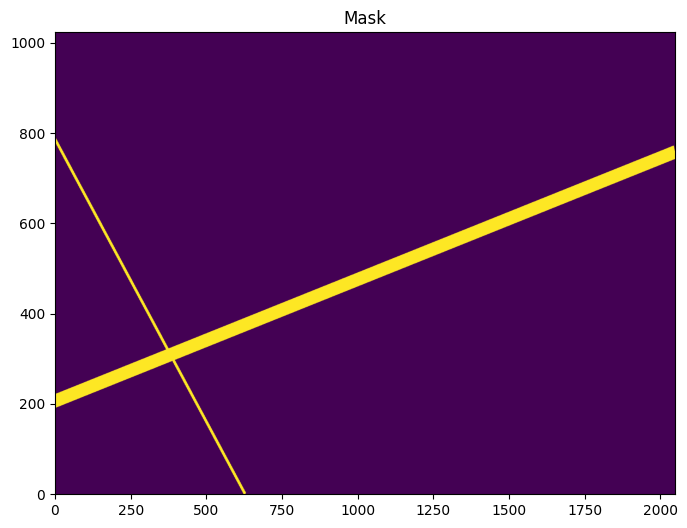

In [26]:
s2.plot_mask()

## <a id="example3"></a>
## Example 3: find trails in an FLC image using the WFC wrapper

The approaches shown in examples 1 and 2 can be useful for imaging data from any telescope, not just ACS/WFC data. However, for ACS/WFC data, we provide a convenience wrapper that performs even more of the steps all together, including reading the image and pre-processing it.

The `WfcWrapper` class has the same properties as the TrailFinder class, but with a few additional keywords. It also contains the additional routines that read the image, rebin, mask, and subtract the background. By default, these will be run automatically when WfcWrapper is initialized, although this can be turned off. In most cases, you probably will only need to adjust the `binsize` keyword. The specific value of `binsize` is up to the user. Larger values speed up the MRT calculation, but keep in mind that the parameters to filter out spurious trails (e.g., `max_width`) are tuned to WFC data binned 2x2. A user may want to start with a larger value for `binsize` and reduce it once they get a sense for the computation time.

In [27]:
w = WfcWrapper('jc8m32j5q_flc.fits', binsize=2, extension=4, processes=8, output_root='example3')

INFO:findsat_mrt:image type is flc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


We can plot the image to see that it looks like the one from the last example after preprocessing.

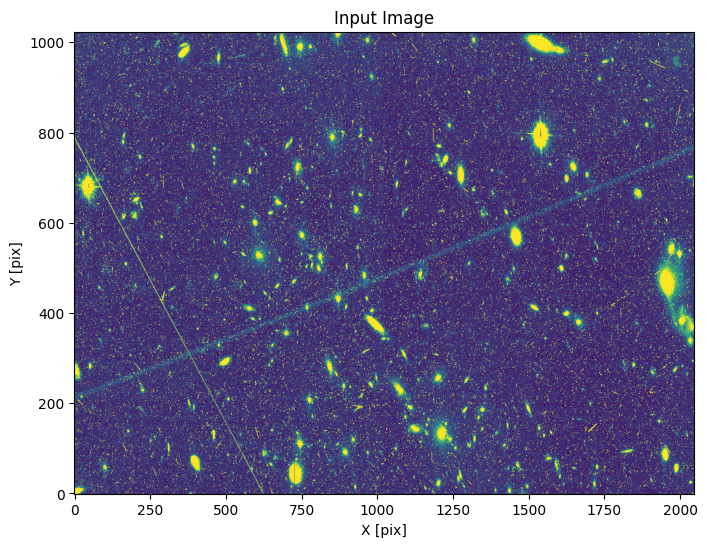

In [28]:
w.plot_image()

From here, everything is the same as the last example:

In [29]:
w.run_mrt()
w.find_mrt_sources()
w.filter_sources()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.85134374437424
baseline noise: 1.137590873421488
snr of feature = 20.845589943623423


INFO:utils_findsat_mrt:width of feature = 28.121276073737363


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.80295752073702
baseline noise: 5.8949710877351755
snr of feature = 3.546749614515007


INFO:utils_findsat_mrt:width of feature = 26.679429594499652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.546749614515007, 26.679429594499652, 255.77779199490328


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.24848668241353
baseline noise: 4.392702667994342
snr of feature = 7.251978206156204


INFO:utils_findsat_mrt:width of feature = 26.74142532625251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.251978206156204, 26.74142532625251, 255.2847294967554


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.3721731832319
baseline noise: 4.602276841911111
snr of feature = 5.164812365231436


INFO:utils_findsat_mrt:width of feature = 24.049538003648706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.164812365231436, 24.049538003648706, 253.62853250389148


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.57327869547822
baseline noise: 5.257625496516683
snr of feature = 5.766035108253045


INFO:utils_findsat_mrt:width of feature = 24.99261428222701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.766035108253045, 24.99261428222701, 252.21577536948


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 37.76831723097134
baseline noise: 4.3892178072029395
snr of feature = 7.604794496411531


INFO:utils_findsat_mrt:width of feature = 31.586876494192126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.604794496411531, 31.586876494192126, 250.32154970750446


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.851067653707624
baseline noise: 4.085683870078729
snr of feature = 6.061502693587422


INFO:utils_findsat_mrt:width of feature = 22.69792714169992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.061502693587422, 22.69792714169992, 250.72299321670596


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.11919960860482
baseline noise: 5.3771671193623
snr of feature = 3.857427531785994


INFO:utils_findsat_mrt:width of feature = 18.584548369561674


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.857427531785994, 18.584548369561674, 249.94953486021134


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.26429439656128
baseline noise: 4.824130952470428
snr of feature = 7.553726008501059


INFO:utils_findsat_mrt:width of feature = 23.462089781879058


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.553726008501059, 23.462089781879058, 249.7241498236594


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.398923554876333
baseline noise: 8.988542228732667
snr of feature = 2.381963702379179


INFO:utils_findsat_mrt:width of feature = 20.099470600406164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.381963702379179, 20.099470600406164, 249.58779274988282


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.77916050062184
baseline noise: 4.796717507488486
snr of feature = 7.70994809166842


INFO:utils_findsat_mrt:width of feature = 43.302261450304655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.70994809166842, 43.302261450304655, 249.96273556131834


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.405266188630435
baseline noise: 5.411411251603305
snr of feature = 4.433936698105911


INFO:utils_findsat_mrt:width of feature = 28.548601115196618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.433936698105911, 28.548601115196618, 250.43347492059863


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.00939406509034
baseline noise: 4.851663972368001
snr of feature = 6.00984121299131


INFO:utils_findsat_mrt:width of feature = 27.348160537092895


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.00984121299131, 27.348160537092895, 249.11989629882186


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.79995958975927
baseline noise: 3.825031947034045
snr of feature = 6.006466863770938


INFO:utils_findsat_mrt:width of feature = 23.720752033596284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.006466863770938, 23.720752033596284, 250.02943993682337


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.741746073938135
baseline noise: 5.684005057626465
snr of feature = 4.232533358504388


INFO:utils_findsat_mrt:width of feature = 21.81865512197632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.232533358504388, 21.81865512197632, 251.07968094787933


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.270403135311795
baseline noise: 4.227307431908561
snr of feature = 7.580024925922242


INFO:utils_findsat_mrt:width of feature = 28.01967838063041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.580024925922242, 28.01967838063041, 251.12347496000612


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.00227505387567
baseline noise: 4.428151517142632
snr of feature = 5.775349700146515


INFO:utils_findsat_mrt:width of feature = 39.80983821331688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.775349700146515, 39.80983821331688, 250.41375911760622


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.998103373788382
baseline noise: 6.99001135447951
snr of feature = 2.862383335970806


INFO:utils_findsat_mrt:width of feature = 20.763285345477527


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.862383335970806, 20.763285345477527, 252.97734005655306


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.71683185528227
baseline noise: 4.87831640320331
snr of feature = 5.911571343167156


INFO:utils_findsat_mrt:width of feature = 25.221660523854837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.911571343167156, 25.221660523854837, 254.45819415567453


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.73564636435078
baseline noise: 3.9900478531624692
snr of feature = 6.201830008523636


INFO:utils_findsat_mrt:width of feature = 24.68538192372648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.201830008523636, 24.68538192372648, 255.15291896626206


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.673276208600775
baseline noise: 5.825518394230077
snr of feature = 3.9220128181211154


INFO:utils_findsat_mrt:width of feature = 27.647472754523733


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9220128181211154, 27.647472754523733, 256.05490386453874


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.810371480256073
baseline noise: 4.955440305191918
snr of feature = 5.419282550317009


INFO:utils_findsat_mrt:width of feature = 29.167154159168604


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.419282550317009, 29.167154159168604, 257.2404788549683


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 19
persistance score: 0.9047619047619048


INFO:utils_findsat_mrt:amplitude of feature: 138.77050466907062
baseline noise: 1.606968732509384
snr of feature = 85.35544790742235


INFO:utils_findsat_mrt:width of feature = 5.896104242563126


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 432.9015859502807
baseline noise: 4.921763046446005
snr of feature = 86.95660861058276


INFO:utils_findsat_mrt:width of feature = 3.9138548307723795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 86.95660861058276, 3.9138548307723795, 252.13674584848604


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 384.09221101323453
baseline noise: 6.543607050102543
snr of feature = 57.69732214546953


INFO:utils_findsat_mrt:width of feature = 3.947654848799232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.69732214546953, 3.947654848799232, 251.95524396965908


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 297.11074917894047
baseline noise: 5.696284216879781
snr of feature = 51.15869466248069


INFO:utils_findsat_mrt:width of feature = 3.9407768422871072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.15869466248069, 3.9407768422871072, 251.7759209305916


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.59389228229958
baseline noise: 4.055498965413468
snr of feature = 51.421143266307084


INFO:utils_findsat_mrt:width of feature = 4.00212886883952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.421143266307084, 4.00212886883952, 251.54435486809038


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 230.99833348320408
baseline noise: 4.325795649934228
snr of feature = 52.40019551934136


INFO:utils_findsat_mrt:width of feature = 4.087830687386088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 52.40019551934136, 4.087830687386088, 251.25231487676913


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.4037264578963
baseline noise: 4.654908157852622
snr of feature = 44.20040338560808


INFO:utils_findsat_mrt:width of feature = 3.9819703824084627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.20040338560808, 3.9819703824084627, 250.96518589178098


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.72701666938164
baseline noise: 5.798152503849695
snr of feature = 25.85804082696796


INFO:utils_findsat_mrt:width of feature = 4.125142122705597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.85804082696796, 4.125142122705597, 250.6475864735257


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 158.18090543865344
baseline noise: 4.1929329139549125
snr of feature = 36.72559892675507


INFO:utils_findsat_mrt:width of feature = 3.9570222288493824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.72559892675507, 3.9570222288493824, 250.30613300045775


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.42826557243143
baseline noise: 5.2329569663303666
snr of feature = 31.56825283849888


INFO:utils_findsat_mrt:width of feature = 4.0416888100627375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.56825283849888, 4.0416888100627375, 249.87751996123956


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 161.22026581592434
baseline noise: 7.3283704817681325
snr of feature = 20.999469898119337


INFO:utils_findsat_mrt:width of feature = 3.740208060372254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.999469898119337, 3.740208060372254, 249.4414928157351


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.44201640844748
baseline noise: 1.703324109409356
snr of feature = 4.543288183551625


INFO:utils_findsat_mrt:width of feature = 82.06123612124969


INFO:utils_findsat_mrt:amplitude of feature: 8.847591758782066
baseline noise: 1.3135020724442255
snr of feature = 5.735879557706413


INFO:utils_findsat_mrt:width of feature = 151.80072666231368


INFO:utils_findsat_mrt:amplitude of feature: 21.827496984720664
baseline noise: 2.1593238227351343
snr of feature = 9.108487089755993


INFO:utils_findsat_mrt:width of feature = 184.07399665959394


INFO:utils_findsat_mrt:amplitude of feature: 18.317704948860804
baseline noise: 2.007344851337601
snr of feature = 8.125340340328039


INFO:utils_findsat_mrt:width of feature = 80.64622454135684


INFO:utils_findsat_mrt:amplitude of feature: 6.295960794497887
baseline noise: 1.7132740836423261
snr of feature = 2.6748123692579426


INFO:utils_findsat_mrt:width of feature = 125.10368985450023


INFO:utils_findsat_mrt:amplitude of feature: 7.985938087290943
baseline noise: 1.8057651847391198
snr of feature = 3.4224676357600043


INFO:utils_findsat_mrt:width of feature = 106.97008887814349


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,149.82861105630025,1477.0451590340901,10.006171249354978,0.8268922957188881,90.34106279991074,25.149939411833273,1165.2352429959637,-7.66603402890213,74.91430552815012,29.045159034090148,0.0 .. 757.305511828876,2,21.61210315571154,28.121276073737363,20.845589943623423,0.9047619047619048
2,282.7930548471648,2076.538451998981,8.800963835960973,0.8647258022487747,75.7116922228596,144.16125171338146,986.0911168096113,-7.484792616205265,141.3965274235824,628.5384519989811,-0.0 .. 0.0,2,117.66088518106241,5.896104242563126,85.35544790742235,1.0
3,1.89809792226805,1170.3959668163084,11.951226986809722,0.9226991489096155,89.57443075089688,10.009226284894828,757.599247824086,-7.198598837024701,0.949048961134025,-277.6040331836916,737.384603915152 .. 1023.0,0,5.085377142178139,82.06123612124969,4.543288183551625,0.0
6,1.8911698330322249,2413.2033122115918,12.475743100358333,0.9262535197104634,90.33860518338149,9.658328843568405,762.3237537315119,-7.205348631098291,0.9455849165161124,965.2033122115918,1980.392429675209 .. 1023.0,0,5.992433762820587,151.80072666231368,5.735879557706413,0.0
7,325.4191609883813,531.0140194812167,12.201247168146102,0.782678441363821,94.23320001272329,14.20490443848111,1729.499125819428,-8.094800867087436,162.70958049419065,-916.9859805187833,1824.6646136781749 .. 308.7426298533246,0,13.372181269678208,184.07399665959394,9.108487089755993,0.0
8,207.53927900215038,846.645153454569,12.721015597702415,0.8326372642315713,96.55462790845331,11.393139132531816,1184.4466627326246,-7.683788771548504,103.76963950107519,-601.354846545431,1462.7723071956195 .. 879.828126312588,0,11.765573068726574,80.64622454135684,8.125340340328039,0.0
11,357.19328553056397,1723.1829480245503,12.128447023837875,0.9281173095869734,88.70264997532271,8.749244365744588,593.6695771508787,-6.933861984728694,178.59664276528198,275.18294802455034,735.7037079417825 .. 0.0,0,3.505090290066271,125.10368985450023,2.6748123692579426,0.0
13,1.9262041668737042,2382.6056474848383,11.44419953058279,0.9164749874267282,87.34159246944431,8.51827791258439,543.7745194741929,-6.838547133215959,0.9631020834368521,934.6056474848383,1949.6389326258109 .. 1023.0,0,5.660628617313041,106.97008887814349,3.4224676357600043,0.0


Below is the resulting MRT and sources

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

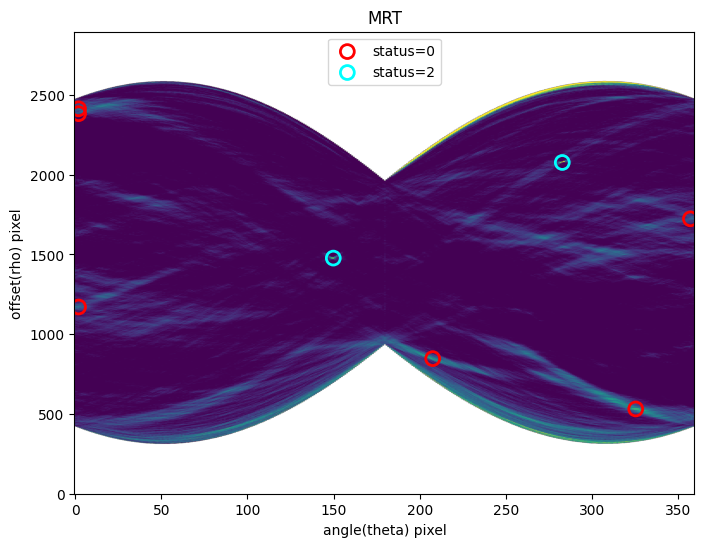

In [30]:
w.plot_mrt(show_sources=True)

Lastly, we generate the mask

<Axes: title={'center': 'Mask'}>

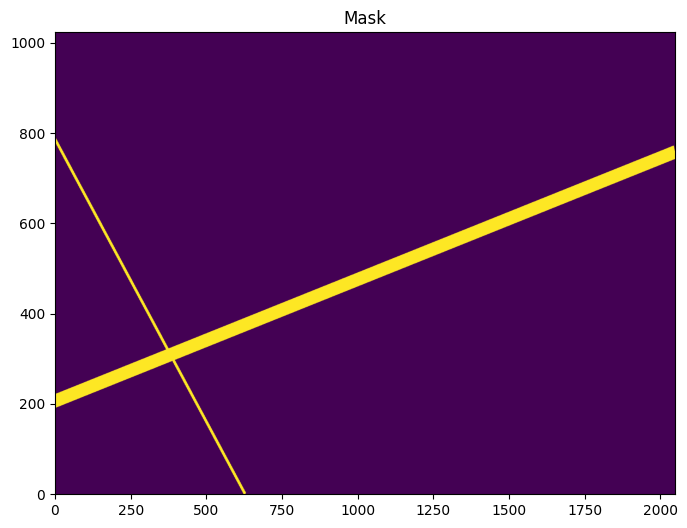

In [31]:
w.make_mask()
w.plot_mask()

If you're really feeling very confident, you can run everything in a single line by setting `execute=True`.

In [32]:
w = WfcWrapper('jc8m32j5q_flc.fits', binsize=2, extension=4, output_root='example3', processes=8,
               execute=True)

INFO:findsat_mrt:image type is flc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


INFO:findsat_mrt:Running the trailfinding pipeline


INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.85134374437424
baseline noise: 1.137590873421488
snr of feature = 20.845589943623423


INFO:utils_findsat_mrt:width of feature = 28.121276073737363


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.80295752073702
baseline noise: 5.8949710877351755
snr of feature = 3.546749614515007


INFO:utils_findsat_mrt:width of feature = 26.679429594499652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.546749614515007, 26.679429594499652, 255.77779199490328


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.24848668241353
baseline noise: 4.392702667994342
snr of feature = 7.251978206156204


INFO:utils_findsat_mrt:width of feature = 26.74142532625251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.251978206156204, 26.74142532625251, 255.2847294967554


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.3721731832319
baseline noise: 4.602276841911111
snr of feature = 5.164812365231436


INFO:utils_findsat_mrt:width of feature = 24.049538003648706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.164812365231436, 24.049538003648706, 253.62853250389148


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.57327869547822
baseline noise: 5.257625496516683
snr of feature = 5.766035108253045


INFO:utils_findsat_mrt:width of feature = 24.99261428222701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.766035108253045, 24.99261428222701, 252.21577536948


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 37.76831723097134
baseline noise: 4.3892178072029395
snr of feature = 7.604794496411531


INFO:utils_findsat_mrt:width of feature = 31.586876494192126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.604794496411531, 31.586876494192126, 250.32154970750446


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.851067653707624
baseline noise: 4.085683870078729
snr of feature = 6.061502693587422


INFO:utils_findsat_mrt:width of feature = 22.69792714169992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.061502693587422, 22.69792714169992, 250.72299321670596


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.11919960860482
baseline noise: 5.3771671193623
snr of feature = 3.857427531785994


INFO:utils_findsat_mrt:width of feature = 18.584548369561674


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.857427531785994, 18.584548369561674, 249.94953486021134


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.26429439656128
baseline noise: 4.824130952470428
snr of feature = 7.553726008501059


INFO:utils_findsat_mrt:width of feature = 23.462089781879058


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.553726008501059, 23.462089781879058, 249.7241498236594


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.398923554876333
baseline noise: 8.988542228732667
snr of feature = 2.381963702379179


INFO:utils_findsat_mrt:width of feature = 20.099470600406164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.381963702379179, 20.099470600406164, 249.58779274988282


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 41.77916050062184
baseline noise: 4.796717507488486
snr of feature = 7.70994809166842


INFO:utils_findsat_mrt:width of feature = 43.302261450304655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.70994809166842, 43.302261450304655, 249.96273556131834


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.405266188630435
baseline noise: 5.411411251603305
snr of feature = 4.433936698105911


INFO:utils_findsat_mrt:width of feature = 28.548601115196618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.433936698105911, 28.548601115196618, 250.43347492059863


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.00939406509034
baseline noise: 4.851663972368001
snr of feature = 6.00984121299131


INFO:utils_findsat_mrt:width of feature = 27.348160537092895


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.00984121299131, 27.348160537092895, 249.11989629882186


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.79995958975927
baseline noise: 3.825031947034045
snr of feature = 6.006466863770938


INFO:utils_findsat_mrt:width of feature = 23.720752033596284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.006466863770938, 23.720752033596284, 250.02943993682337


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.741746073938135
baseline noise: 5.684005057626465
snr of feature = 4.232533358504388


INFO:utils_findsat_mrt:width of feature = 21.81865512197632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.232533358504388, 21.81865512197632, 251.07968094787933


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.270403135311795
baseline noise: 4.227307431908561
snr of feature = 7.580024925922242


INFO:utils_findsat_mrt:width of feature = 28.01967838063041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.580024925922242, 28.01967838063041, 251.12347496000612


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.00227505387567
baseline noise: 4.428151517142632
snr of feature = 5.775349700146515


INFO:utils_findsat_mrt:width of feature = 39.80983821331688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.775349700146515, 39.80983821331688, 250.41375911760622


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 26.998103373788382
baseline noise: 6.99001135447951
snr of feature = 2.862383335970806


INFO:utils_findsat_mrt:width of feature = 20.763285345477527


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.862383335970806, 20.763285345477527, 252.97734005655306


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.71683185528227
baseline noise: 4.87831640320331
snr of feature = 5.911571343167156


INFO:utils_findsat_mrt:width of feature = 25.221660523854837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.911571343167156, 25.221660523854837, 254.45819415567453


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.73564636435078
baseline noise: 3.9900478531624692
snr of feature = 6.201830008523636


INFO:utils_findsat_mrt:width of feature = 24.68538192372648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.201830008523636, 24.68538192372648, 255.15291896626206


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.673276208600775
baseline noise: 5.825518394230077
snr of feature = 3.9220128181211154


INFO:utils_findsat_mrt:width of feature = 27.647472754523733


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9220128181211154, 27.647472754523733, 256.05490386453874


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.810371480256073
baseline noise: 4.955440305191918
snr of feature = 5.419282550317009


INFO:utils_findsat_mrt:width of feature = 29.167154159168604


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.419282550317009, 29.167154159168604, 257.2404788549683


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 19
persistance score: 0.9047619047619048


INFO:utils_findsat_mrt:amplitude of feature: 138.77050466907062
baseline noise: 1.606968732509384
snr of feature = 85.35544790742235


INFO:utils_findsat_mrt:width of feature = 5.896104242563126


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 432.9015859502807
baseline noise: 4.921763046446005
snr of feature = 86.95660861058276


INFO:utils_findsat_mrt:width of feature = 3.9138548307723795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 86.95660861058276, 3.9138548307723795, 252.13674584848604


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 384.09221101323453
baseline noise: 6.543607050102543
snr of feature = 57.69732214546953


INFO:utils_findsat_mrt:width of feature = 3.947654848799232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.69732214546953, 3.947654848799232, 251.95524396965908


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 297.11074917894047
baseline noise: 5.696284216879781
snr of feature = 51.15869466248069


INFO:utils_findsat_mrt:width of feature = 3.9407768422871072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.15869466248069, 3.9407768422871072, 251.7759209305916


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.59389228229958
baseline noise: 4.055498965413468
snr of feature = 51.421143266307084


INFO:utils_findsat_mrt:width of feature = 4.00212886883952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.421143266307084, 4.00212886883952, 251.54435486809038


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 230.99833348320408
baseline noise: 4.325795649934228
snr of feature = 52.40019551934136


INFO:utils_findsat_mrt:width of feature = 4.087830687386088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 52.40019551934136, 4.087830687386088, 251.25231487676913


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.4037264578963
baseline noise: 4.654908157852622
snr of feature = 44.20040338560808


INFO:utils_findsat_mrt:width of feature = 3.9819703824084627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.20040338560808, 3.9819703824084627, 250.96518589178098


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.72701666938164
baseline noise: 5.798152503849695
snr of feature = 25.85804082696796


INFO:utils_findsat_mrt:width of feature = 4.125142122705597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.85804082696796, 4.125142122705597, 250.6475864735257


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 158.18090543865344
baseline noise: 4.1929329139549125
snr of feature = 36.72559892675507


INFO:utils_findsat_mrt:width of feature = 3.9570222288493824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.72559892675507, 3.9570222288493824, 250.30613300045775


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.42826557243143
baseline noise: 5.2329569663303666
snr of feature = 31.56825283849888


INFO:utils_findsat_mrt:width of feature = 4.0416888100627375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.56825283849888, 4.0416888100627375, 249.87751996123956


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 161.22026581592434
baseline noise: 7.3283704817681325
snr of feature = 20.999469898119337


INFO:utils_findsat_mrt:width of feature = 3.740208060372254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.999469898119337, 3.740208060372254, 249.4414928157351


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.44201640844748
baseline noise: 1.703324109409356
snr of feature = 4.543288183551625


INFO:utils_findsat_mrt:width of feature = 82.06123612124969


INFO:utils_findsat_mrt:amplitude of feature: 8.847591758782066
baseline noise: 1.3135020724442255
snr of feature = 5.735879557706413


INFO:utils_findsat_mrt:width of feature = 151.80072666231368


INFO:utils_findsat_mrt:amplitude of feature: 21.827496984720664
baseline noise: 2.1593238227351343
snr of feature = 9.108487089755993


INFO:utils_findsat_mrt:width of feature = 184.07399665959394


INFO:utils_findsat_mrt:amplitude of feature: 18.317704948860804
baseline noise: 2.007344851337601
snr of feature = 8.125340340328039


INFO:utils_findsat_mrt:width of feature = 80.64622454135684


INFO:utils_findsat_mrt:amplitude of feature: 6.295960794497887
baseline noise: 1.7132740836423261
snr of feature = 2.6748123692579426


INFO:utils_findsat_mrt:width of feature = 125.10368985450023


INFO:utils_findsat_mrt:amplitude of feature: 7.985938087290943
baseline noise: 1.8057651847391198
snr of feature = 3.4224676357600043


INFO:utils_findsat_mrt:width of feature = 106.97008887814349


INFO:findsat_mrt:Wrote diagnostic plot to ./example3_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example3_catalog.fits


We'll plot the image and mask together to check that everything looks ok

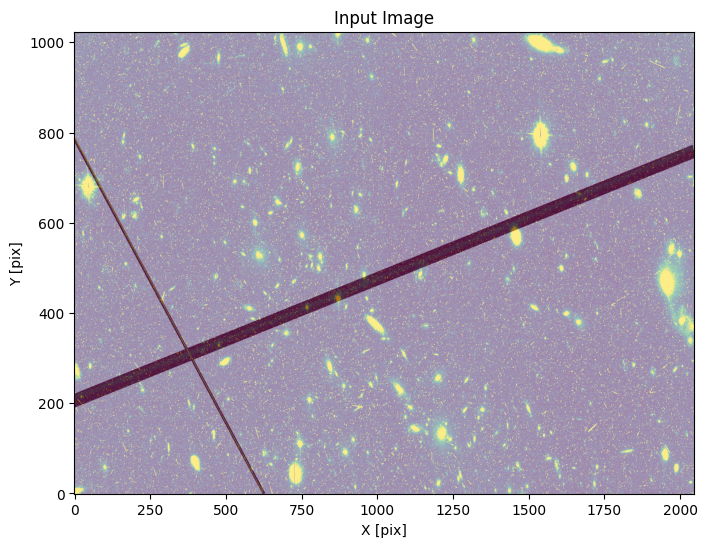

In [33]:
w.plot_image(overlay_mask=True)

<a id="example4"></a>
## Example 4: Finding trails in a DRC image

Applying `TrailFinder` to a DRC image (that shows both chips together) can boost sensitivity by increasing the number of pixels over which we search for trails. The DRC files also remove the distortion in the original FLC files (though this does not appear to create signficant curvature to most trails). 

Here, we demonstrate the steps that go into preparing a DRC image to be analyzed. The subsequent example will illustrate how to do all of this in a single line.

There are no DQ arrays for the DRC files, so we ignore the pre-processing steps that incorporated those.

In [34]:
# Read in the image files and header information
image_file = 'hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits'
ext = 1
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    wht = h[ext+1].data
    image = image*wht  # wht is effective exposure time, so this turns it into counts
    
    header = h[0].header  # primary header
    image_header = h[1].header  # image header

In [35]:
# Flag anything with wht == 0 as bad
image[wht == 0] = np.nan

# Subtract the background from the image. 
median = np.nanmedian(image)
image = image - np.nanmedian(image)

In [36]:
# Let's rebin the images
binsize = 2
image_rebin = block_reduce(image, binsize, func=np.nansum)

Setting up `TrailFinder` is essentially the same as earlier examples at this point. We'll use the default settings. In fact, about all the steps from here on out are the same.

In [37]:
s4 = TrailFinder(image=image_rebin, processes=8, output_root='example4')

We can do a quick plot of our image to make sure things look ok

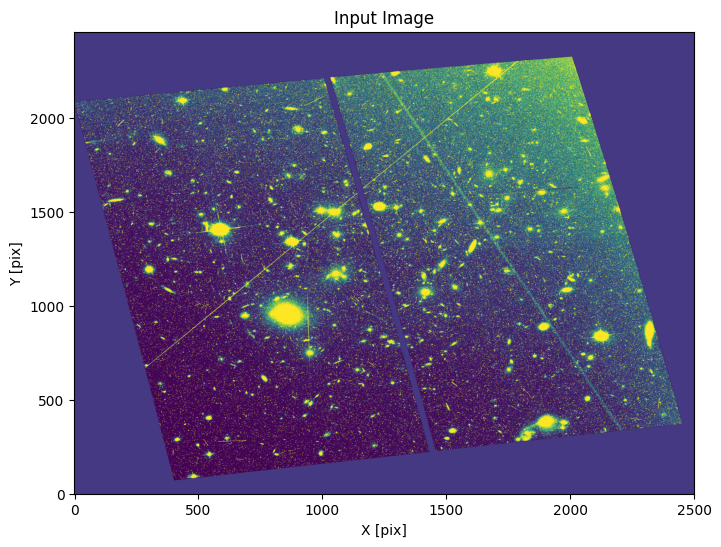

In [38]:
s4.plot_image()

Now run the MRT calculation and plot the results

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

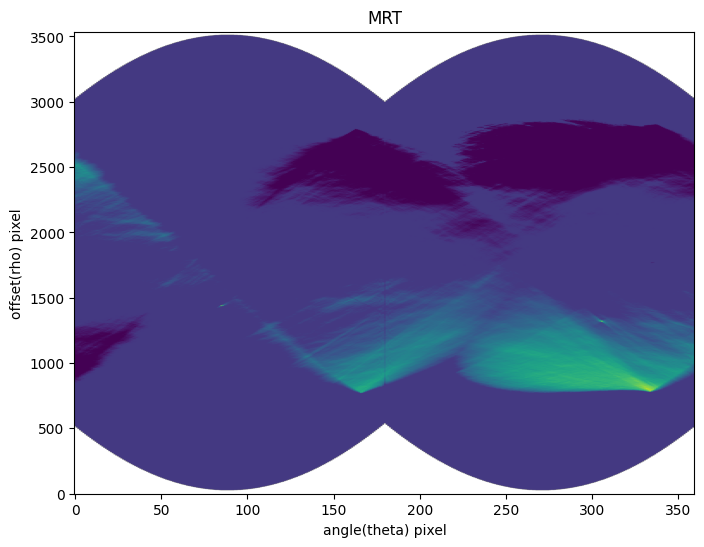

In [39]:
s4.run_mrt()
s4.plot_mrt(scale=[-1, 5])  # adjusted scale manually due to varying background in image

This example has a clear gradient in the background due to the cluster. This causes some large scale variation in the RT, but you can see the "point source" signals from the satellite trails around `x,y = (90,700)` and `x,y = (300,700)`. This is a case where we may have wanted to explore some different background subtraction methods, but we'll proceed with the simpler approach here. Now we'll try to pull the sources out.

In [40]:
s4.find_mrt_sources()

INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 54


INFO:findsat_mrt:54 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 72


INFO:findsat_mrt:72 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 122


INFO:findsat_mrt:122 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:137 final sources found


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64
1,166.32632848500526,784.1620364707945,8.97661040342012,0.7918843725916062,90.0847777688511,47.2651673120286,3758.814804907941,-8.937627321874395,83.16316424250263,-983.8379635292055,0.0 .. 2368.752557372936,0
2,333.65283300609065,793.2866460873829,9.552213613018603,0.7253414216374694,89.18291507304015,76.06033722011864,7786.093785809208,-9.728299076548767,166.82641650304532,-974.7133539126171,1963.6295486121046 .. 164.42101660703884,0
3,175.61848329407772,867.7225847081041,13.047895247861987,0.8081598296018906,88.85898079783824,45.61269174869205,8373.176923406401,-9.807225669632862,87.80924164703886,-900.2774152918959,0.0 .. 2176.7541520883756,0
4,154.4259626223427,879.0782237751876,12.9130759462165,0.8055881272760537,90.44213112671672,40.5418159745289,6350.558219771947,-9.50702975461236,77.21298131117135,-888.9217762248124,0.0 .. 2423.223327297132,0
5,346.41381947238943,887.0373840263525,13.09671934290727,0.8146095234741726,88.08454433561258,40.382052292873986,7074.403342370524,-9.62422454298442,173.20690973619472,-880.9626159736475,1990.9109538990167 .. 0.0,0
6,350.5955759587645,926.9579263214856,13.08381928630943,0.8051560025999439,89.20505206782518,44.15401974648382,7855.019817697577,-9.737868212684361,175.29778797938226,-841.0420736785144,1992.8746859023004 .. 0.0,0
7,147.42310819209794,935.7704219142504,12.866464303413249,0.7956939650709209,90.67534946166674,30.553460172206773,4733.7546802080415,-9.18801436877746,73.71155409604897,-832.2295780857496,0.0 .. 2456.0,0
8,226.4824099119488,937.1790154787546,12.532995534496479,0.8683209397253615,87.93772752622348,22.897929216505652,2193.9384707523295,-8.353061108931458,113.2412049559744,-830.8209845212454,496.0038130494842 .. 1595.379666835168,0
9,144.33522137431683,962.7820874713151,12.902167029136885,0.7960370624647414,91.52361474018888,28.95931925702962,4189.886079981094,-9.055505537422793,72.16761068715842,-805.2179125286849,0.0 .. 2456.0,0


And below we plot the MRT with the sources overlaid

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

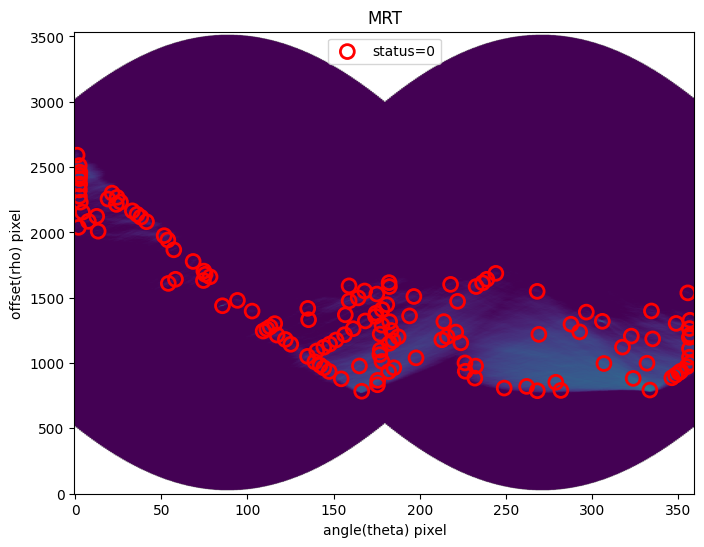

In [41]:
s4.plot_mrt(show_sources=True)

It's clearly shredding those large-scale features quite a bit, but we'll try to filter these out.

In [42]:
s4.filter_sources()

INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 16.071776147236324
baseline noise: 1.6153482506475376
snr of feature = 8.949418734191653


INFO:utils_findsat_mrt:width of feature = 144.11032104424442


INFO:utils_findsat_mrt:amplitude of feature: 25.784285120376975
baseline noise: 2.2189461551877
snr of feature = 10.620058945592527


INFO:utils_findsat_mrt:width of feature = 141.79074445464272


INFO:utils_findsat_mrt:amplitude of feature: 12.096358827473509
baseline noise: 1.2348060993308339
snr of feature = 8.796160574545889


INFO:utils_findsat_mrt:width of feature = 186.7613835985092


INFO:utils_findsat_mrt:amplitude of feature: 11.993381732356317
baseline noise: 1.2240187571413148
snr of feature = 8.798364332558723


INFO:utils_findsat_mrt:width of feature = 129.5313978165438


INFO:utils_findsat_mrt:amplitude of feature: 9.939114252040628
baseline noise: 1.9093472458760006
snr of feature = 4.205503751875476


INFO:utils_findsat_mrt:width of feature = 180.16640524329543


INFO:utils_findsat_mrt:amplitude of feature: 13.207624124886916
baseline noise: 1.2076997102968745
snr of feature = 9.936182241560894


INFO:utils_findsat_mrt:width of feature = 177.40030219652334


INFO:utils_findsat_mrt:amplitude of feature: 7.076868886124151
baseline noise: 0.5532182430590452
snr of feature = 11.792182786656285


INFO:utils_findsat_mrt:width of feature = 204.63543426595828


INFO:utils_findsat_mrt:amplitude of feature: -1.8759762981468224
baseline noise: 1.2309033694325755
snr of feature = -2.524064637999662


INFO:utils_findsat_mrt:width of feature = 21.59764219846437


INFO:utils_findsat_mrt:amplitude of feature: 6.107644864405275
baseline noise: 0.4028881686315221
snr of feature = 14.159653074824524


INFO:utils_findsat_mrt:width of feature = 204.7245925029212


INFO:utils_findsat_mrt:amplitude of feature: 6.0922388287783065
baseline noise: 0.5642856442732136
snr of feature = 9.79637394749775


INFO:utils_findsat_mrt:width of feature = 191.62083122074094


INFO:utils_findsat_mrt:amplitude of feature: 7.762638897810725
baseline noise: 0.33952174750197983
snr of feature = 21.863451177793728


INFO:utils_findsat_mrt:width of feature = 232.03070225807025


INFO:utils_findsat_mrt:amplitude of feature: 6.115366657811604
baseline noise: 2.366783515454795
snr of feature = 1.583830171994624


INFO:utils_findsat_mrt:width of feature = 153.5771404385432


INFO:utils_findsat_mrt:amplitude of feature: 9.590048544019865
baseline noise: 0.4476078866637344
snr of feature = 20.425110749275944


INFO:utils_findsat_mrt:width of feature = 163.45206271385268


INFO:utils_findsat_mrt:amplitude of feature: 2.7041129571657256
baseline noise: 1.0101753082181189
snr of feature = 1.6768749296947265


INFO:utils_findsat_mrt:width of feature = 14.439828281443852


INFO:utils_findsat_mrt:amplitude of feature: 5.406395748952924
baseline noise: 1.4025606107686348
snr of feature = 2.8546610445520053


INFO:utils_findsat_mrt:width of feature = 162.74995406332903


INFO:utils_findsat_mrt:amplitude of feature: 5.339772405063215
baseline noise: 1.4905821813612714
snr of feature = 2.5823401566404596


INFO:utils_findsat_mrt:width of feature = 40.3463194108964


INFO:utils_findsat_mrt:amplitude of feature: 2.627508489581323
baseline noise: 1.2259875752229632
snr of feature = 1.1431770946809747


INFO:utils_findsat_mrt:width of feature = 18.218479073385083


INFO:utils_findsat_mrt:amplitude of feature: 4.750616703382348
baseline noise: 0.8774302035130275
snr of feature = 4.41423885838666


INFO:utils_findsat_mrt:width of feature = 125.11008443528908


INFO:utils_findsat_mrt:amplitude of feature: 3.565623601509883
baseline noise: 0.6749659387901265
snr of feature = 4.282671904750109


INFO:utils_findsat_mrt:width of feature = 37.92729423721778


INFO:utils_findsat_mrt:amplitude of feature: 6.771549068658859
baseline noise: 0.5079881856284564
snr of feature = 12.330131015313778


INFO:utils_findsat_mrt:width of feature = 81.4559076053875


INFO:utils_findsat_mrt:amplitude of feature: -0.14673067280374497
baseline noise: 1.0390381077896882
snr of feature = -1.1412177972142719


INFO:utils_findsat_mrt:width of feature = 12.06495030151882


INFO:utils_findsat_mrt:amplitude of feature: 4.5119828908044575
baseline noise: 0.9399257310538328
snr of feature = 3.800361072938901


INFO:utils_findsat_mrt:width of feature = 24.387427713346142


INFO:utils_findsat_mrt:amplitude of feature: 5.781579037212122
baseline noise: 0.16312161843975176
snr of feature = 34.443364849567885


INFO:utils_findsat_mrt:width of feature = 248.7220845391016


INFO:utils_findsat_mrt:amplitude of feature: 4.049555338296625
baseline noise: 0.8426434738151507
snr of feature = 3.805775472231296


INFO:utils_findsat_mrt:width of feature = 26.655676995241777


INFO:utils_findsat_mrt:amplitude of feature: 4.023701420371656
baseline noise: 0.5162999999023422
snr of feature = 6.793339959583064


INFO:utils_findsat_mrt:width of feature = 47.04437847507188


INFO:utils_findsat_mrt:breaking into 5.0 sections for persistence check
Section size for persistence check: 508.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 5


INFO:utils_findsat_mrt:amplitude of feature: 8.676958004641842
baseline noise: 0.8375573820380435
snr of feature = 9.35983705800317


INFO:utils_findsat_mrt:width of feature = 254.50891297415455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.35983705800317, 254.50891297415455, 240.78612721935747


INFO:utils_findsat_mrt:Checking persistence, step 2 of 5


INFO:utils_findsat_mrt:amplitude of feature: 11.695670974807948
baseline noise: 2.224040628945867
snr of feature = 4.258748793789513


INFO:utils_findsat_mrt:width of feature = 203.48188321200016


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.258748793789513, 203.48188321200016, 251.27439253014745


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 5


INFO:utils_findsat_mrt:amplitude of feature: 8.176993312033062
baseline noise: 3.0314686058623135
snr of feature = 1.6973702766442087


INFO:utils_findsat_mrt:width of feature = 254.24596425626586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6973702766442087, 254.24596425626586, 240.8276962907458


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 5


INFO:utils_findsat_mrt:amplitude of feature: 5.336260832779658
baseline noise: 2.43373185623477
snr of feature = 1.1926248033895543


INFO:utils_findsat_mrt:width of feature = 254.0622840952311


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1926248033895543, 254.0622840952311, 240.74028191771373


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 5


INFO:utils_findsat_mrt:amplitude of feature: 13.503344809090173
baseline noise: 5.482218268327459
snr of feature = 1.4631169625447686


INFO:utils_findsat_mrt:width of feature = 254.33992053189093


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4631169625447686, 254.33992053189093, 240.69383767429468


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 5
Number of sections that passed: 1
persistance score: 0.2


INFO:utils_findsat_mrt:amplitude of feature: 4.215547564618532
baseline noise: 0.7481369425227311
snr of feature = 4.634727180298878


INFO:utils_findsat_mrt:width of feature = 26.324605193464606


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 6.851761817932129
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 108.27701278985336


INFO:utils_findsat_mrt:amplitude of feature: 7.327553054721492
baseline noise: 0.7620173509568443
snr of feature = 8.615992399018847


INFO:utils_findsat_mrt:width of feature = 66.84949446051857


INFO:utils_findsat_mrt:breaking into 8.0 sections for persistence check
Section size for persistence check: 308.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 8


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 66.84949446051857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 66.84949446051857, 255.26736540213818


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 8


INFO:utils_findsat_mrt:amplitude of feature: 7.325351616426246
baseline noise: 2.98671482613155
snr of feature = 1.4526451445363406


INFO:utils_findsat_mrt:width of feature = 105.01462690647952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4526451445363406, 105.01462690647952, 275.53494206628557


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 8


INFO:utils_findsat_mrt:amplitude of feature: 17.921538027821406
baseline noise: 2.9159878554314336
snr of feature = 5.14595770501583


INFO:utils_findsat_mrt:width of feature = 76.21650999790248


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.14595770501583, 76.21650999790248, 255.8002455990488


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 8


INFO:utils_findsat_mrt:amplitude of feature: 16.823824058804156
baseline noise: 3.9165383501336333
snr of feature = 3.2955851710810196


INFO:utils_findsat_mrt:width of feature = 94.9302185683654


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2955851710810196, 94.9302185683654, 256.15967886782715


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 8


INFO:utils_findsat_mrt:amplitude of feature: 7.906228674193784
baseline noise: 2.6923682491756047
snr of feature = 1.936533171721457


INFO:utils_findsat_mrt:width of feature = 97.32598083953539


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.936533171721457, 97.32598083953539, 280.2673654021382


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 8


INFO:utils_findsat_mrt:amplitude of feature: 21.836141473344895
baseline noise: 2.8818677095037395
snr of feature = 6.577079753291347


INFO:utils_findsat_mrt:width of feature = 123.75875550893579


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.577079753291347, 123.75875550893579, 255.26736540213818


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 8


INFO:utils_findsat_mrt:amplitude of feature: 3.8586197828621867
baseline noise: 3.4095603802953702
snr of feature = 0.1317059539880958


INFO:utils_findsat_mrt:width of feature = 22.2329951264976


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1317059539880958, 22.2329951264976, 258.6023154246331


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 8


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 66.84949446051857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 66.84949446051857, 255.26736540213818


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 8
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 27.16047542465911
baseline noise: 0.6691626502455829
snr of feature = 39.58874985728987


INFO:utils_findsat_mrt:width of feature = 21.26779924756235


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 21.26779924756235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 21.26779924756235, 250.59913458586234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 21.26779924756235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 21.26779924756235, 250.59913458586234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 5.9849813118667115
baseline noise: 7.090113604534003
snr of feature = -0.15586947604909726


INFO:utils_findsat_mrt:width of feature = 1.980703980991109


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.15586947604909726, 1.980703980991109, 250.59913458586234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 31.12712089184342
baseline noise: 5.568525705547332
snr of feature = 4.589831588787454


INFO:utils_findsat_mrt:width of feature = 18.619423448339887


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.589831588787454, 18.619423448339887, 250.59913458586234


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 36.55373723865298
baseline noise: 4.643829895229148
snr of feature = 6.8714634393061145


INFO:utils_findsat_mrt:width of feature = 24.282196714393393


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.8714634393061145, 24.282196714393393, 249.21281594978234


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 35.56854347373261
baseline noise: 5.14746919259106
snr of feature = 5.909908955827791


INFO:utils_findsat_mrt:width of feature = 26.592582320346224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.909908955827791, 26.592582320346224, 249.09664819153943


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 38.819805305548336
baseline noise: 4.175511974112339
snr of feature = 8.297016879900323


INFO:utils_findsat_mrt:width of feature = 25.075377980354745


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.297016879900323, 25.075377980354745, 249.19653719145404


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 37.70226893104247
baseline noise: 4.672082099791326
snr of feature = 7.069693153021948


INFO:utils_findsat_mrt:width of feature = 28.491489114691774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.069693153021948, 28.491489114691774, 248.56757482918786


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.429780414410025
baseline noise: 4.6122721050491915
snr of feature = 5.597568339712143


INFO:utils_findsat_mrt:width of feature = 17.64479332274084


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.597568339712143, 17.64479332274084, 250.09300624203598


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.283609582768086
baseline noise: 7.345793510896527
snr of feature = 3.12257838963841


INFO:utils_findsat_mrt:width of feature = 17.566219543543383


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.12257838963841, 17.566219543543383, 248.988039408396


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 41.434180097705465
baseline noise: 8.087390858082953
snr of feature = 4.123306246079849


INFO:utils_findsat_mrt:width of feature = 18.400281905108898


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.123306246079849, 18.400281905108898, 250.57772712690715


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 55.451765167195866
baseline noise: 6.020869862598498
snr of feature = 8.209925879923254


INFO:utils_findsat_mrt:width of feature = 33.18746410515149


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.209925879923254, 33.18746410515149, 248.9586492243936


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 40.60149730346828
baseline noise: 7.7427207164839595
snr of feature = 4.243828208478349


INFO:utils_findsat_mrt:width of feature = 34.809482206952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.243828208478349, 34.809482206952, 252.41030139978943


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 33.658112919303875
baseline noise: 4.298309972172099
snr of feature = 6.830545758033163


INFO:utils_findsat_mrt:width of feature = 23.453369067022493


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.830545758033163, 23.453369067022493, 250.07390860660738


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 35.19100464519054
baseline noise: 4.47705005038609
snr of feature = 6.86031075130727


INFO:utils_findsat_mrt:width of feature = 25.895697585719972


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.86031075130727, 25.895697585719972, 249.3043404173152


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 29.59439294555592
baseline noise: 4.232295922035335
snr of feature = 5.992515053466255


INFO:utils_findsat_mrt:width of feature = 22.124950143352123


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.992515053466255, 22.124950143352123, 251.33316938370453


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 37.04954937312472
baseline noise: 4.472299734474652
snr of feature = 7.284227706727447


INFO:utils_findsat_mrt:width of feature = 21.12982035842583


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.284227706727447, 21.12982035842583, 251.12283362569292


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 53.384874870676306
baseline noise: 4.528687674942636
snr of feature = 10.788155576737255


INFO:utils_findsat_mrt:width of feature = 118.98455348302684


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.788155576737255, 118.98455348302684, 229.9930132672671


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.258388343023043
baseline noise: 6.875725532315805
snr of feature = 2.964438111281353


INFO:utils_findsat_mrt:width of feature = 19.31282698990347


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.964438111281353, 19.31282698990347, 251.2123539957794


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 26.683168656476397
baseline noise: 5.860096539496794
snr of feature = 3.55336673664555


INFO:utils_findsat_mrt:width of feature = 19.148917781712953


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.55336673664555, 19.148917781712953, 251.66507290715873


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 33.10351104781863
baseline noise: 4.169704239614074
snr of feature = 6.939054941432134


INFO:utils_findsat_mrt:width of feature = 27.301033647426692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.939054941432134, 27.301033647426692, 251.59018451221957


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 31.76952274168809
baseline noise: 5.469920876168722
snr of feature = 4.808040639143634


INFO:utils_findsat_mrt:width of feature = 23.199375928306182


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.808040639143634, 23.199375928306182, 251.7308328051704


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.89813305456009
baseline noise: 6.733733335374534
snr of feature = 3.8855711113083866


INFO:utils_findsat_mrt:width of feature = 31.11014256857581


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.8855711113083866, 31.11014256857581, 250.91984691472527


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.880085981853634
baseline noise: 1.3468306488797002
snr of feature = 10.790707313545887


INFO:utils_findsat_mrt:width of feature = 17.94488974552587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.790707313545887, 17.94488974552587, 252.18941621039625


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 17.94488974552587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 17.94488974552587, 252.18941621039625


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 17.94488974552587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 17.94488974552587, 252.18941621039625


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 17.94488974552587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 17.94488974552587, 252.18941621039625


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 19
persistance score: 0.7037037037037037


INFO:utils_findsat_mrt:amplitude of feature: 3.4033435341032434
baseline noise: 0.4211069056943925
snr of feature = 7.081899128420213


INFO:utils_findsat_mrt:width of feature = 24.49280434382058


INFO:utils_findsat_mrt:breaking into 5.0 sections for persistence check
Section size for persistence check: 502.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 5


INFO:utils_findsat_mrt:amplitude of feature: 7.484379096628498
baseline noise: 2.5493091861500163
snr of feature = 1.9358459685039056


INFO:utils_findsat_mrt:width of feature = 91.7653387663639


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9358459685039056, 91.7653387663639, 247.09062606725166


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 5


INFO:utils_findsat_mrt:amplitude of feature: 3.257959717464643
baseline noise: 3.013024622767984
snr of feature = 0.08129209859282319


INFO:utils_findsat_mrt:width of feature = 26.825898593183496


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.08129209859282319, 26.825898593183496, 247.09062606725166


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 5


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.0937588927827804
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.65954210333086


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 5


INFO:utils_findsat_mrt:amplitude of feature: 12.496706935160354
baseline noise: 2.302984068363018
snr of feature = 4.426310631859094


INFO:utils_findsat_mrt:width of feature = 118.08383546068535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.426310631859094, 118.08383546068535, 247.09062606725166


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 5


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.49280434382058


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.49280434382058, 247.09062606725166


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 5
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.6345243534036384
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 194.0333066837563
baseline noise: 0.2840290674457839
snr of feature = 682.1459485068156


INFO:utils_findsat_mrt:width of feature = 4.295089755904712


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.295089755904712


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.295089755904712, 250.56036717687365


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.295089755904712


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.295089755904712, 250.56036717687365


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.295089755904712


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.295089755904712, 250.56036717687365


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 17.532701238076505
baseline noise: 1.689736841048812
snr of feature = 9.375995132587649


INFO:utils_findsat_mrt:width of feature = 382.82414251646196


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.375995132587649, 382.82414251646196, 250.56036717687365


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 221.93733495066624
baseline noise: 5.3910854666389
snr of feature = 40.1674673540344


INFO:utils_findsat_mrt:width of feature = 5.814433931763688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.1674673540344, 5.814433931763688, 250.56036717687365


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 299.20769925505994
baseline noise: 5.213058458141695
snr of feature = 56.39580740510607


INFO:utils_findsat_mrt:width of feature = 4.121942659677359


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.39580740510607, 4.121942659677359, 249.95625114416598


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 380.6601407239521
baseline noise: 3.9298377591862708
snr of feature = 95.8640855043271


INFO:utils_findsat_mrt:width of feature = 4.053396109648588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 95.8640855043271, 4.053396109648588, 250.05519695116556


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 487.7319447245902
baseline noise: 3.6058188432078233
snr of feature = 134.26246490261616


INFO:utils_findsat_mrt:width of feature = 4.071379931889453


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 134.26246490261616, 4.071379931889453, 250.0991791034337


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 554.839493772164
baseline noise: 4.295520444572068
snr of feature = 128.1670010494942


INFO:utils_findsat_mrt:width of feature = 4.083352871452405


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 128.1670010494942, 4.083352871452405, 250.152460824111


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 548.543896529851
baseline noise: 6.107696907287292
snr of feature = 88.81190534772043


INFO:utils_findsat_mrt:width of feature = 4.230089405872093


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 88.81190534772043, 4.230089405872093, 250.20576666180534


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 482.3051003372187
baseline noise: 22.335258509652846
snr of feature = 20.59388932654512


INFO:utils_findsat_mrt:width of feature = 4.787122989251088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.59388932654512, 4.787122989251088, 250.25445397241478


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 332.78148208209217
baseline noise: 5.149039710821022
snr of feature = 63.62981463955921


INFO:utils_findsat_mrt:width of feature = 4.264847758989447


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 63.62981463955921, 4.264847758989447, 250.32021476259348


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 257.82537232618427
baseline noise: 6.824261902566907
snr of feature = 36.780697166561666


INFO:utils_findsat_mrt:width of feature = 4.250668907762986


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.780697166561666, 4.250668907762986, 250.37016769759074


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 239.93578403599594
baseline noise: 11.7021741360653
snr of feature = 19.503521930726553


INFO:utils_findsat_mrt:width of feature = 7.27208710987685


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.503521930726553, 7.27208710987685, 250.5273638779672


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 164.33745277873385
baseline noise: 5.714615544452304
snr of feature = 27.757394351448742


INFO:utils_findsat_mrt:width of feature = 4.177553037069799


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 27.757394351448742, 4.177553037069799, 250.49253440088734


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 298.28730531743946
baseline noise: 5.183334945326628
snr of feature = 56.54737219642341


INFO:utils_findsat_mrt:width of feature = 161.5880578998466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.54737219642341, 161.5880578998466, 254.67008743795714


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 199.835684569486
baseline noise: 6.298069708737772
snr of feature = 30.72967175835468


INFO:utils_findsat_mrt:width of feature = 4.239195044305177


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.72967175835468, 4.239195044305177, 250.6180849229065


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 188.1317220124177
baseline noise: 5.594704201222682
snr of feature = 32.626750449345096


INFO:utils_findsat_mrt:width of feature = 4.001501119016098


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.626750449345096, 4.001501119016098, 250.6636915453766


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 184.54424967185767
baseline noise: 4.450832723740947
snr of feature = 40.462859003325406


INFO:utils_findsat_mrt:width of feature = 4.20814895002934


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.462859003325406, 4.20814895002934, 250.72392080605323


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 172.4391326882657
baseline noise: 4.536387612696633
snr of feature = 37.01243355079177


INFO:utils_findsat_mrt:width of feature = 4.149801809697408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 37.01243355079177, 4.149801809697408, 250.74542398208126


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 185.89139249533866
baseline noise: 5.5170967151088455
snr of feature = 32.69369835157426


INFO:utils_findsat_mrt:width of feature = 4.333340503587976


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.69369835157426, 4.333340503587976, 250.82148860384828


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 224.89371565540165
baseline noise: 5.001490720279384
snr of feature = 43.96533698313831


INFO:utils_findsat_mrt:width of feature = 4.112745998464391


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 43.96533698313831, 4.112745998464391, 250.90992368253498


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 272.1595903629749
baseline noise: 4.303286960459537
snr of feature = 62.24458323688264


INFO:utils_findsat_mrt:width of feature = 4.244097121447453


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 62.24458323688264, 4.244097121447453, 250.95248432425524


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 308.80374990078553
baseline noise: 4.5869197290168
snr of feature = 66.32268453430669


INFO:utils_findsat_mrt:width of feature = 4.053158784583957


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 66.32268453430669, 4.053158784583957, 251.00238407758877


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 358.11190564200353
baseline noise: 7.57962688440839
snr of feature = 46.24664038260969


INFO:utils_findsat_mrt:width of feature = 3.984804478893466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.24664038260969, 3.984804478893466, 251.11036455566258


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 470.4063038581571
baseline noise: 8.02670534760147
snr of feature = 57.60515410581546


INFO:utils_findsat_mrt:width of feature = 4.721989293798174


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.60515410581546, 4.721989293798174, 251.19170509157073


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: -29.357283537266404
baseline noise: 8.311099208952408
snr of feature = -4.5322985322619935


INFO:utils_findsat_mrt:width of feature = 4.180800184144971


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -4.5322985322619935, 4.180800184144971, 251.19874929841265


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.0680760228601951
baseline noise: 16.170860824503457
snr of feature = -1.0042097958543457


INFO:utils_findsat_mrt:width of feature = 4.708783702961114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0042097958543457, 4.708783702961114, 251.19318658300276


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 21
persistance score: 0.75


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.0303595066070557
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.93714935935634


INFO:utils_findsat_mrt:breaking into 29.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.93714935935634


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.93714935935634, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.93714935935634


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.93714935935634, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 1.0392073229698506
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 242.5192445204238


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 29


INFO:utils_findsat_mrt:amplitude of feature: 27.245231276555344
baseline noise: 3.6222099106398957
snr of feature = 6.521715181807957


INFO:utils_findsat_mrt:width of feature = 215.14630871821294


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.521715181807957, 215.14630871821294, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.219172156418886
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 242.5207837094041


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 29


INFO:utils_findsat_mrt:amplitude of feature: 55.00527306583758
baseline noise: 3.7839709467062286
snr of feature = 13.536388846673656


INFO:utils_findsat_mrt:width of feature = 166.2210080623125


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.536388846673656, 166.2210080623125, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.9115489945319815
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.29111984821020087


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.29111984821020087, 242.47398285060515


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 29


INFO:utils_findsat_mrt:amplitude of feature: 32.544940943063665
baseline noise: 4.475979431173653
snr of feature = 6.271021112474149


INFO:utils_findsat_mrt:width of feature = 1.6633389245966441


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.271021112474149, 1.6633389245966441, 242.4620483156712


INFO:utils_findsat_mrt:Checking persistence, step 9 of 29


INFO:utils_findsat_mrt:amplitude of feature: 114.73055388787289
baseline noise: 5.524151709263636
snr of feature = 19.768899901043152


INFO:utils_findsat_mrt:width of feature = 32.733753560303484


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.768899901043152, 32.733753560303484, 244.12538724026786


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 29


INFO:utils_findsat_mrt:amplitude of feature: 100.7538777319516
baseline noise: 16.805433621556727
snr of feature = 4.995315562861301


INFO:utils_findsat_mrt:width of feature = 220.84685419763224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.995315562861301, 220.84685419763224, 243.6274829434727


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 29


INFO:utils_findsat_mrt:amplitude of feature: 16.824275354048694
baseline noise: 5.925792167357953
snr of feature = 1.8391605508415747


INFO:utils_findsat_mrt:width of feature = 1.3252022399726116


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8391605508415747, 1.3252022399726116, 242.36002472825234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.574417963231646
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.2033658852718645


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.2033658852718645, 242.5257546192728


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 174.13859595690707
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 764.1065751668157


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 764.1065751668157, 244.12538724026786


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.4045407882791627
baseline noise: 5.367083316006322
snr of feature = -0.7383046422830101


INFO:utils_findsat_mrt:width of feature = 1.6090986795115896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7383046422830101, 1.6090986795115896, 242.46525346452106


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 12.14749146480767
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 242.51495186171783


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 29


INFO:utils_findsat_mrt:amplitude of feature: 34.749464648030575
baseline noise: 3.6921084297774645
snr of feature = 8.411821269324163


INFO:utils_findsat_mrt:width of feature = 50.59918566281601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.411821269324163, 50.59918566281601, 240.79870939107457


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.739724959429228
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.1743636939861517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.1743636939861517, 242.524897638329


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 29


INFO:utils_findsat_mrt:amplitude of feature: 9.744438021961745
baseline noise: 4.5924769838357955
snr of feature = 1.1218262075693308


INFO:utils_findsat_mrt:width of feature = 3.6194603625333457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1218262075693308, 3.6194603625333457, 241.66113859161774


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.533589704713607
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.1869228957432938


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.1869228957432938, 242.53300909375088


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 29


INFO:utils_findsat_mrt:amplitude of feature: 29.779186100665143
baseline noise: 4.476079884038874
snr of feature = 5.65296126792864


INFO:utils_findsat_mrt:width of feature = 63.006435004689024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.65296126792864, 63.006435004689024, 244.12538724026786


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 29


INFO:utils_findsat_mrt:amplitude of feature: -1.3877590730731058
baseline noise: 5.265035701910333
snr of feature = -1.263580182859839


INFO:utils_findsat_mrt:width of feature = 1.5784111722541638


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.263580182859839, 1.5784111722541638, 242.46381837361113


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 29


INFO:utils_findsat_mrt:amplitude of feature: 4.770895824189083
baseline noise: 4.611913897945125
snr of feature = 0.0344720065816479


INFO:utils_findsat_mrt:width of feature = 6.153526682311394


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0344720065816479, 6.153526682311394, 242.21930650096897


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 29


INFO:utils_findsat_mrt:amplitude of feature: 9.866336141347887
baseline noise: 4.541368908989053
snr of feature = 1.172546723041757


INFO:utils_findsat_mrt:width of feature = 3.4503306927693984


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.172546723041757, 3.4503306927693984, 240.96672973222354


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.2640680818079195
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.12866468768589812


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.12866468768589812, 242.52602819335507


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.072892796986494
baseline noise: 6.518822199235134
snr of feature = -0.8354161589017755


INFO:utils_findsat_mrt:width of feature = 1.6571298710406381


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8354161589017755, 1.6571298710406381, 242.45997063990202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 8.26710383574568
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.1729110557132003


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.1729110557132003, 242.52958950598878


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 29


INFO:utils_findsat_mrt:amplitude of feature: 42.30434373364625
baseline noise: 6.515059804288334
snr of feature = 5.493316255639088


INFO:utils_findsat_mrt:width of feature = 230.71173479667175


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.493316255639088, 230.71173479667175, 244.12538724026786


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6633389245966441


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6633389245966441, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6633389245966441


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6633389245966441, 242.4620483156712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 29
Number of sections that passed: 1
persistance score: 0.034482758620689655


INFO:utils_findsat_mrt:amplitude of feature: 6.405829474148354
baseline noise: 0.036716218200788735
snr of feature = 173.46866229841572


INFO:utils_findsat_mrt:width of feature = 100.61001390555145


INFO:utils_findsat_mrt:amplitude of feature: 2.677922193227287
baseline noise: 0.0001387930696308923
snr of feature = 19293.350938047417


INFO:utils_findsat_mrt:width of feature = 35.690077958422364


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 35.690077958422364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 35.690077958422364, 250.9577995407441


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.688095380782525
baseline noise: 2.066846027017734
snr of feature = 0.7844074171814835


INFO:utils_findsat_mrt:width of feature = 34.16225185018692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7844074171814835, 34.16225185018692, 250.9577995407441


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.856607502348552
baseline noise: 3.476909096849549
snr of feature = 1.25965283632738


INFO:utils_findsat_mrt:width of feature = 25.319722298935773


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.25965283632738, 25.319722298935773, 252.20488903539882


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 25.87101175483387
baseline noise: 3.9929483240185073
snr of feature = 5.4791751997424445


INFO:utils_findsat_mrt:width of feature = 57.57315029363531


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.4791751997424445, 57.57315029363531, 251.64531557155902


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.30516428323736
baseline noise: 4.638882539985706
snr of feature = 1.0059064231589776


INFO:utils_findsat_mrt:width of feature = 29.332316717190423


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0059064231589776, 29.332316717190423, 260.3328680535981


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1817.5441627292723
baseline noise: 7.585308828021673
snr of feature = 238.61373280081816


INFO:utils_findsat_mrt:width of feature = 3.3962388481805306


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 238.61373280081816, 3.3962388481805306, 223.79648280379345


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 186.75840917594522
baseline noise: 6.268515709141579
snr of feature = 28.79308305849651


INFO:utils_findsat_mrt:width of feature = 7.379315354928451


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 28.79308305849651, 7.379315354928451, 238.83022771562213


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 19.08525309223775
baseline noise: 4.073673891632435
snr of feature = 3.685022316450018


INFO:utils_findsat_mrt:width of feature = 36.3865827938987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.685022316450018, 36.3865827938987, 254.2538667789994


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.758861300069818
baseline noise: 7.779738527937579
snr of feature = -0.00268353850104205


INFO:utils_findsat_mrt:width of feature = 39.90378818751671


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.00268353850104205, 39.90378818751671, 248.20864476123478


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.667291918239048
baseline noise: 6.488767909638383
snr of feature = -0.7430495370681295


INFO:utils_findsat_mrt:width of feature = 22.795447193607686


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7430495370681295, 22.795447193607686, 251.35452857212462


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 16.96819126903779
baseline noise: 16.72248268752825
snr of feature = 0.014693307572851665


INFO:utils_findsat_mrt:width of feature = 43.55322185702056


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.014693307572851665, 43.55322185702056, 248.83761874645248


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 28.53274436090036
baseline noise: 2.876492762776227
snr of feature = 8.919282513112316


INFO:utils_findsat_mrt:width of feature = 313.7460245652293


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.919282513112316, 313.7460245652293, 271.28012639649216


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.985963205890422
baseline noise: 3.080131758139546
snr of feature = 0.6187499748069323


INFO:utils_findsat_mrt:width of feature = 40.636037821045164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6187499748069323, 40.636037821045164, 251.4253711594824


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.497179709465403
baseline noise: 5.155778060903833
snr of feature = 0.8420458749926294


INFO:utils_findsat_mrt:width of feature = 51.383869926418896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8420458749926294, 51.383869926418896, 249.14910783867288


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 31.22097987530517
baseline noise: 7.469094120470949
snr of feature = 3.180022285398191


INFO:utils_findsat_mrt:width of feature = 77.18597186128932


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.180022285398191, 77.18597186128932, 288.1632755225049


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.9424172496809025
baseline noise: 4.912826093529199
snr of feature = -0.40107441345085865


INFO:utils_findsat_mrt:width of feature = 38.94642430871082


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.40107441345085865, 38.94642430871082, 252.32987723826778


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 24.39317523974365
baseline noise: 8.185482921503201
snr of feature = 1.9800532813602192


INFO:utils_findsat_mrt:width of feature = 4.982849022656637


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9800532813602192, 4.982849022656637, 259.1956474166741


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.877226528611308
baseline noise: 6.98317239006612
snr of feature = 0.27123118730959106


INFO:utils_findsat_mrt:width of feature = 25.35039632151154


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.27123118730959106, 25.35039632151154, 240.07714498449255


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 37.682193870584584
baseline noise: 4.380138563909763
snr of feature = 7.602968449689642


INFO:utils_findsat_mrt:width of feature = 78.58152333058638


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.602968449689642, 78.58152333058638, 255.63968776388367


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.31742217533252
baseline noise: 5.661502305899251
snr of feature = 0.8223824027381971


INFO:utils_findsat_mrt:width of feature = 18.216299943647925


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8223824027381971, 18.216299943647925, 246.38919827383566


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 16.836480510327426
baseline noise: 3.6464256762629557
snr of feature = 3.6172559117075758


INFO:utils_findsat_mrt:width of feature = 167.77038867781548


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6172559117075758, 167.77038867781548, 256.73561103726837


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 21.870354618027093
baseline noise: 4.721867208179231
snr of feature = 3.6317174231717506


INFO:utils_findsat_mrt:width of feature = 133.43791227075803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6317174231717506, 133.43791227075803, 258.8718028330859


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.993248126871741
baseline noise: 1.7848892016115816
snr of feature = -0.44352393079921465


INFO:utils_findsat_mrt:width of feature = 220.93086171912296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.44352393079921465, 220.93086171912296, 278.2433974276017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 57.57315029363531


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 57.57315029363531, 251.64531557155902


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 57.57315029363531


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 57.57315029363531, 251.64531557155902


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 4.098998069763184
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 24.480812900811912


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.480812900811912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.480812900811912, 250.41685255688907


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: -2.3725043992178243
baseline noise: 12.78264219963515
snr of feature = -1.1856035991749454


INFO:utils_findsat_mrt:width of feature = 12.201962009122013


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1856035991749454, 12.201962009122013, 250.70654512842538


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 35.365294802057335
baseline noise: 9.118682194077062
snr of feature = 2.8783339576225684


INFO:utils_findsat_mrt:width of feature = 153.69392204453712


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8783339576225684, 153.69392204453712, 257.54633663560304


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 23.97353723091176
baseline noise: 4.378221013180957
snr of feature = 4.475634317851397


INFO:utils_findsat_mrt:width of feature = 31.864081934167416


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.475634317851397, 31.864081934167416, 250.41685255688907


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 6.491945776407164
baseline noise: 3.857215229363336
snr of feature = 0.6830654735019054


INFO:utils_findsat_mrt:width of feature = 27.439243859037617


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6830654735019054, 27.439243859037617, 249.53586188061283


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 19.920538578509692
baseline noise: 4.167743276824519
snr of feature = 3.7796942506707185


INFO:utils_findsat_mrt:width of feature = 101.96016488365026


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.7796942506707185, 101.96016488365026, 256.80548024159935


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 28.057330214027004
baseline noise: 4.656139933176203
snr of feature = 5.025877790766395


INFO:utils_findsat_mrt:width of feature = 86.63548041146072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.025877790766395, 86.63548041146072, 238.7823627568931


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 18.41458194417453
baseline noise: 4.272873735533487
snr of feature = 3.3096480457724984


INFO:utils_findsat_mrt:width of feature = 58.259929795841146


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.3096480457724984, 58.259929795841146, 255.13733052945472


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.5726458337667735
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 252.5504425457793


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 1.283522676981299
baseline noise: 9.749704045105512
snr of feature = -0.8683526524453176


INFO:utils_findsat_mrt:width of feature = 8.194042828981111


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8683526524453176, 8.194042828981111, 258.0832829433083


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 544.513878435662
baseline noise: 11.197955672737988
snr of feature = 47.6261862744563


INFO:utils_findsat_mrt:width of feature = 144.63693070990155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 47.6261862744563, 144.63693070990155, 313.39726032529586


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.4784842473463815
baseline noise: 5.5788221531556665
snr of feature = -0.19723480612961963


INFO:utils_findsat_mrt:width of feature = 28.853440949090924


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.19723480612961963, 28.853440949090924, 255.51898371015668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 25.326954915713507
baseline noise: 5.924543839970239
snr of feature = 3.2749206689709855


INFO:utils_findsat_mrt:width of feature = 167.8400275408095


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2749206689709855, 167.8400275408095, 248.03149955283317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 103.2014476930175
baseline noise: 6.671137478542976
snr of feature = 14.469842740455325


INFO:utils_findsat_mrt:width of feature = 151.8745991454693


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.469842740455325, 151.8745991454693, 229.73529062163604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 3.2509004043283216
baseline noise: 5.762039950914256
snr of feature = -0.4358073821038841


INFO:utils_findsat_mrt:width of feature = 32.10369583685582


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4358073821038841, 32.10369583685582, 255.89244410024267


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.022081384928913
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.7301413878476


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.631514379285559
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.81064527826632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 253.30373552418052
baseline noise: 6.743036307222736
snr of feature = 36.565233818014114


INFO:utils_findsat_mrt:width of feature = 73.81613551546107


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.565233818014114, 73.81613551546107, 244.77841496498343


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.877926605448568
baseline noise: 4.471885162569532
snr of feature = 5.904901508630468


INFO:utils_findsat_mrt:width of feature = 42.99626303504647


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.904901508630468, 42.99626303504647, 271.04668832922346


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 12.482147968283176
baseline noise: 5.1812794151601675
snr of feature = 1.4090860515572712


INFO:utils_findsat_mrt:width of feature = 40.71676463988467


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4090860515572712, 40.71676463988467, 272.489963450608


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 12.938297488385622
baseline noise: 5.357826780942927
snr of feature = 1.4148405720030768


INFO:utils_findsat_mrt:width of feature = 28.379439396126372


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4148405720030768, 28.379439396126372, 262.1028799121432


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.64681121983715
baseline noise: 4.555275046645934
snr of feature = 2.4348773805344543


INFO:utils_findsat_mrt:width of feature = 244.40944961291302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4348773805344543, 244.40944961291302, 272.066939620881


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 2.252721081327614
baseline noise: 4.847128389679217
snr of feature = -0.5352462529929605


INFO:utils_findsat_mrt:width of feature = 21.6139327367041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5352462529929605, 21.6139327367041, 272.02326109855704


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 9.510485464757451
baseline noise: 4.22426415618301
snr of feature = 1.25139458924155


INFO:utils_findsat_mrt:width of feature = 37.74881678984812


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.25139458924155, 37.74881678984812, 270.8739986618759


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 23.30964721530873
baseline noise: 7.139168754075675
snr of feature = 2.2650365915501713


INFO:utils_findsat_mrt:width of feature = 194.33502860223268


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2650365915501713, 194.33502860223268, 314.0429513642699


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.411833444587206
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 271.2095843123501


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.188510283298399
baseline noise: 9.561482603388203
snr of feature = -0.5619392455084152


INFO:utils_findsat_mrt:width of feature = 245.36859287869774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5619392455084152, 245.36859287869774, 280.1053555185204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


INFO:utils_findsat_mrt:amplitude of feature: 5.253392101359247
baseline noise: 0.817346807612769
snr of feature = 5.427372141701842


INFO:utils_findsat_mrt:width of feature = 75.12367692686587


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.0855026245117188
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 24.574990787812368


INFO:utils_findsat_mrt:breaking into 31.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.574990787812368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.574990787812368, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.574990787812368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.574990787812368, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.574990787812368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.574990787812368, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 31


INFO:utils_findsat_mrt:amplitude of feature: 39.087251394612494
baseline noise: 5.328528911444741
snr of feature = 6.335467639231527


INFO:utils_findsat_mrt:width of feature = 261.2934106625696


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.335467639231527, 261.2934106625696, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.187649890243271
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.82839802608456


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 31


INFO:utils_findsat_mrt:amplitude of feature: 11.963773641646917
baseline noise: 7.908358148394382
snr of feature = 0.5128011930107007


INFO:utils_findsat_mrt:width of feature = 53.030073042310846


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5128011930107007, 53.030073042310846, 267.4560726198913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.611621037738699
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.04847258437843


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 31


INFO:utils_findsat_mrt:amplitude of feature: 11.065991071365751
baseline noise: 4.019585757368319
snr of feature = 1.7530177832580476


INFO:utils_findsat_mrt:width of feature = 20.640530453759624


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7530177832580476, 20.640530453759624, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 31


INFO:utils_findsat_mrt:amplitude of feature: 14.649429289940223
baseline noise: 4.68864156867087
snr of feature = 2.1244506698542587


INFO:utils_findsat_mrt:width of feature = 38.02300339976344


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1244506698542587, 38.02300339976344, 265.5663647814979


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.444739853896234
baseline noise: 3.9256842906962963
snr of feature = 0.8964183827874158


INFO:utils_findsat_mrt:width of feature = 34.704450370263885


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8964183827874158, 34.704450370263885, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 31


INFO:utils_findsat_mrt:amplitude of feature: 9.22013608118035
baseline noise: 6.112986219489019
snr of feature = 0.5082867440115144


INFO:utils_findsat_mrt:width of feature = 29.827904003638793


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5082867440115144, 29.827904003638793, 258.29945510260876


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 31


INFO:utils_findsat_mrt:amplitude of feature: 84.82635236372859
baseline noise: 9.13859130274927
snr of feature = 8.282213150095604


INFO:utils_findsat_mrt:width of feature = 217.230793837273


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.282213150095604, 217.230793837273, 279.7834481168055


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 31


INFO:utils_findsat_mrt:amplitude of feature: 337.81876545257603
baseline noise: 12.10372815345529
snr of feature = 26.910306739344428


INFO:utils_findsat_mrt:width of feature = 180.399753126159


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.910306739344428, 180.399753126159, 273.8925346104819


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 31


INFO:utils_findsat_mrt:amplitude of feature: 11.832692814002883
baseline noise: 5.166157366649182
snr of feature = 1.2904243859063236


INFO:utils_findsat_mrt:width of feature = 151.62805843096024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2904243859063236, 151.62805843096024, 279.7834481168055


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 31


INFO:utils_findsat_mrt:amplitude of feature: 74.454608226293
baseline noise: 6.342206494442027
snr of feature = 10.739543373673039


INFO:utils_findsat_mrt:width of feature = 153.0406194839842


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.739543373673039, 153.0406194839842, 259.55989626435235


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 31


INFO:utils_findsat_mrt:amplitude of feature: 93.00452393416629
baseline noise: 7.5169213661841825
snr of feature = 11.3726881529663


INFO:utils_findsat_mrt:width of feature = 152.06051832514288


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.3726881529663, 152.06051832514288, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 31


INFO:utils_findsat_mrt:amplitude of feature: -1.56723237313925
baseline noise: 5.9001232086021
snr of feature = -1.265627058576387


INFO:utils_findsat_mrt:width of feature = 16.899219969006367


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.265627058576387, 16.899219969006367, 254.92465000894202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 31


INFO:utils_findsat_mrt:amplitude of feature: 16.54263098024169
baseline noise: 6.6191164385552606
snr of feature = 1.499220422212789


INFO:utils_findsat_mrt:width of feature = 296.86014325756935


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.499220422212789, 296.86014325756935, 268.3923152925826


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.245072590631521
baseline noise: 6.606140273392561
snr of feature = 0.0967179458499204


INFO:utils_findsat_mrt:width of feature = 20.38966836406337


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0967179458499204, 20.38966836406337, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 31


INFO:utils_findsat_mrt:amplitude of feature: -4.5915295737444985
baseline noise: 6.30631135127092
snr of feature = -1.7280848213780569


INFO:utils_findsat_mrt:width of feature = 18.855170165733284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.7280848213780569, 18.855170165733284, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.372917764895449
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.9859571760018


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 31


INFO:utils_findsat_mrt:amplitude of feature: 5.13090424672529
baseline noise: 5.054705327308655
snr of feature = 0.015074848973878098


INFO:utils_findsat_mrt:width of feature = 21.7038559635495


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.015074848973878098, 21.7038559635495, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 31


INFO:utils_findsat_mrt:amplitude of feature: -2.2129906478473664
baseline noise: 7.298842437887188
snr of feature = -1.3031974818856298


INFO:utils_findsat_mrt:width of feature = 16.679357179752486


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3031974818856298, 16.679357179752486, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 31


INFO:utils_findsat_mrt:amplitude of feature: 10.437604988267719
baseline noise: 5.629592844691636
snr of feature = 0.8540603692342947


INFO:utils_findsat_mrt:width of feature = 16.26060174713578


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8540603692342947, 16.26060174713578, 257.8412858819736


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.00447438819036
baseline noise: 4.224628632102029
snr of feature = 0.658009495785


INFO:utils_findsat_mrt:width of feature = 4.859701312016455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.658009495785, 4.859701312016455, 259.25554597639336


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 31


INFO:utils_findsat_mrt:amplitude of feature: 8.393457906735271
baseline noise: 4.634950267496408
snr of feature = 0.8109057103797234


INFO:utils_findsat_mrt:width of feature = 33.47043230024326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8109057103797234, 33.47043230024326, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 31


INFO:utils_findsat_mrt:amplitude of feature: 10.080277310372288
baseline noise: 4.7136124297579265
snr of feature = 1.1385460643165297


INFO:utils_findsat_mrt:width of feature = 24.775045820651854


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1385460643165297, 24.775045820651854, 255.42138267171023


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 31


INFO:utils_findsat_mrt:amplitude of feature: 5.418702860495642
baseline noise: 6.941044727013783
snr of feature = -0.21932460117903485


INFO:utils_findsat_mrt:width of feature = 24.09657175811077


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.21932460117903485, 24.09657175811077, 254.98624468831426


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 31


INFO:utils_findsat_mrt:amplitude of feature: 2.945113349064883
baseline noise: 11.49188068938028
snr of feature = -0.7437222480227731


INFO:utils_findsat_mrt:width of feature = 1.2112112249602092


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7437222480227731, 1.2112112249602092, 254.98568600232818


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 81.75603485107422
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 219.73829100515692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 219.73829100515692, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 31 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 24.574990787812368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 24.574990787812368, 254.78344811680552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 31
Number of sections that passed: 0
persistance score: 0.0


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.9238338470458984
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.985445677707503


INFO:utils_findsat_mrt:breaking into 30.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 30


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.985445677707503


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.985445677707503, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 30


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.985445677707503


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.985445677707503, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 30


INFO:utils_findsat_mrt:amplitude of feature: 31.2532519819521
baseline noise: 9.701498532593181
snr of feature = 2.221487059648939


INFO:utils_findsat_mrt:width of feature = 117.7746680527803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.221487059648939, 117.7746680527803, 275.31442579483246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.413539133432382
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.54279436666087


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 30


INFO:utils_findsat_mrt:amplitude of feature: 13.683388907810176
baseline noise: 6.10084161084204
snr of feature = 1.2428690630966226


INFO:utils_findsat_mrt:width of feature = 233.73541183637624


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2428690630966226, 233.73541183637624, 275.31442579483246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 30


INFO:utils_findsat_mrt:amplitude of feature: 21.948966164456117
baseline noise: 3.291882467791135
snr of feature = 5.66760322678955


INFO:utils_findsat_mrt:width of feature = 89.01062697341149


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.66760322678955, 89.01062697341149, 252.076808555004


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.555192051552385
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.70152882148952


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.45053502856622
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.54924876494582


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 30


INFO:utils_findsat_mrt:amplitude of feature: -10.4594868521699
baseline noise: 4.503429096060385
snr of feature = -3.322560570859191


INFO:utils_findsat_mrt:width of feature = 0.9837887666155325


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -3.322560570859191, 0.9837887666155325, 250.35598705144477


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.266589364966526
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.56992869933183


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 11.844207532963296
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.52829025471655


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 42.85274805864221
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.59337941195471


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 30


INFO:utils_findsat_mrt:amplitude of feature: 18.57775235908611
baseline noise: 5.38023980741809
snr of feature = 2.452959909606955


INFO:utils_findsat_mrt:width of feature = 2.027046954102218


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.452959909606955, 2.027046954102218, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 30


INFO:utils_findsat_mrt:amplitude of feature: 5.036007024025022
baseline noise: 6.93513803512197
snr of feature = -0.27384184734018024


INFO:utils_findsat_mrt:width of feature = 1.1874440926889065


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.27384184734018024, 1.1874440926889065, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 30


INFO:utils_findsat_mrt:amplitude of feature: 115.28806012328636
baseline noise: 5.339878734710004
snr of feature = 20.590014652186177


INFO:utils_findsat_mrt:width of feature = 231.3202302554503


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.590014652186177, 231.3202302554503, 275.31442579483246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.162286040705002
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.70045370668396


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 30


INFO:utils_findsat_mrt:amplitude of feature: 12.139792672205607
baseline noise: 6.264167800581606
snr of feature = 0.9379737354862157


INFO:utils_findsat_mrt:width of feature = 272.7653810097359


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9379737354862157, 272.7653810097359, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 30


INFO:utils_findsat_mrt:amplitude of feature: 27.801624934730715
baseline noise: 3.9375927501086347
snr of feature = 6.0605638264555655


INFO:utils_findsat_mrt:width of feature = 220.12451949960922


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.0605638264555655, 220.12451949960922, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0.44628174412345345
baseline noise: 9.92224348732745
snr of feature = -0.9550220930686252


INFO:utils_findsat_mrt:width of feature = 0.8021996075171387


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9550220930686252, 0.8021996075171387, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 30


INFO:utils_findsat_mrt:amplitude of feature: 1.7351354241334285
baseline noise: 5.592691518478703
snr of feature = -0.6897494849482756


INFO:utils_findsat_mrt:width of feature = 0.8674595369740246


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6897494849482756, 0.8674595369740246, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 30


INFO:utils_findsat_mrt:amplitude of feature: 8.767896028594228
baseline noise: 5.294933486071668
snr of feature = 0.6559029592455117


INFO:utils_findsat_mrt:width of feature = 1.4356219375508772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6559029592455117, 1.4356219375508772, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 30


INFO:utils_findsat_mrt:amplitude of feature: 31.956806213063814
baseline noise: 7.257087613905087
snr of feature = 3.4035304399291446


INFO:utils_findsat_mrt:width of feature = 68.03132287720578


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4035304399291446, 68.03132287720578, 250.3144257948325


INFO:utils_findsat_mrt:Checking persistence, step 23 of 30


INFO:utils_findsat_mrt:amplitude of feature: -0.3789430990844309
baseline noise: 7.186355568175205
snr of feature = -1.0527309142289845


INFO:utils_findsat_mrt:width of feature = 16.513350810656817


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0527309142289845, 16.513350810656817, 251.90852978308817


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 30


INFO:utils_findsat_mrt:amplitude of feature: 6.000701819988709
baseline noise: 4.6677613181872895
snr of feature = 0.28556312350586577


INFO:utils_findsat_mrt:width of feature = 49.98962523108739


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.28556312350586577, 49.98962523108739, 250.8207333537731


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 30


INFO:utils_findsat_mrt:amplitude of feature: 11.274182019346604
baseline noise: 4.490865496192275
snr of feature = 1.5104697588707081


INFO:utils_findsat_mrt:width of feature = 109.31319681041259


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5104697588707081, 109.31319681041259, 253.55282150980042


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 30


INFO:utils_findsat_mrt:amplitude of feature: 5.291299118088347
baseline noise: 4.836265575548632
snr of feature = 0.09408779055482187


INFO:utils_findsat_mrt:width of feature = 39.80483271965187


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.09408779055482187, 39.80483271965187, 249.9664161879841


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 30


INFO:utils_findsat_mrt:amplitude of feature: 19.942646012139946
baseline noise: 7.198307540602932
snr of feature = 1.770463181748073


INFO:utils_findsat_mrt:width of feature = 69.70678504552347


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.770463181748073, 69.70678504552347, 283.80830366036975


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 13.397645509585292
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 251.0094549878709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 30


INFO:utils_findsat_mrt:amplitude of feature: 51.63204945657449
baseline noise: 12.113427620348247
snr of feature = 3.2623814724283737


INFO:utils_findsat_mrt:width of feature = 238.48795604783052


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2623814724283737, 238.48795604783052, 242.27050138425474


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 30


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 68.03132287720578


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 68.03132287720578, 250.3144257948325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 30
Number of sections that passed: 1
persistance score: 0.03333333333333333


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.7078640460968018
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.4693272991721642


INFO:utils_findsat_mrt:breaking into 29.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.4693272991721642


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.4693272991721642, 260.00627512983846


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.813126971547312
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 264.3989161572283


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.280428886611674
baseline noise: 8.760325059673901
snr of feature = 2.228239670785047


INFO:utils_findsat_mrt:width of feature = 98.27537343624229


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.228239670785047, 98.27537343624229, 271.86678646836344


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 29


INFO:utils_findsat_mrt:amplitude of feature: 27.15385947126233
baseline noise: 4.063217308014591
snr of feature = 5.682846969002138


INFO:utils_findsat_mrt:width of feature = 52.536662014255654


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.682846969002138, 52.536662014255654, 260.32948180193813


INFO:utils_findsat_mrt:Checking persistence, step 5 of 29


INFO:utils_findsat_mrt:amplitude of feature: 10.12931647752999
baseline noise: 3.7253529463634503
snr of feature = 1.7190219620446563


INFO:utils_findsat_mrt:width of feature = 38.20452614517171


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7190219620446563, 38.20452614517171, 259.30596042495864


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.9284186794270255
baseline noise: 3.6690102130852122
snr of feature = 0.07070257406661204


INFO:utils_findsat_mrt:width of feature = 37.250737913005054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.07070257406661204, 37.250737913005054, 261.29336792404695


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 29


INFO:utils_findsat_mrt:amplitude of feature: 8.053195148807966
baseline noise: 5.592568111074376
snr of feature = 0.439981595013759


INFO:utils_findsat_mrt:width of feature = 57.27139231900591


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.439981595013759, 57.27139231900591, 259.34151650940186


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 29


INFO:utils_findsat_mrt:amplitude of feature: 10.391771396952393
baseline noise: 4.840357456503284
snr of feature = 1.1469016473133573


INFO:utils_findsat_mrt:width of feature = 44.190842135482654


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1469016473133573, 44.190842135482654, 260.9286749209774


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 29


INFO:utils_findsat_mrt:amplitude of feature: 16.950784504344416
baseline noise: 4.704181771760168
snr of feature = 2.603343860159112


INFO:utils_findsat_mrt:width of feature = 206.87440125405303


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.603343860159112, 206.87440125405303, 252.11068751063036


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 29


INFO:utils_findsat_mrt:amplitude of feature: 51.67826367623811
baseline noise: 7.195442098083849
snr of feature = 6.182083181518487


INFO:utils_findsat_mrt:width of feature = 121.74088092395314


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.182083181518487, 121.74088092395314, 237.7909284503311


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 18.932754270380844
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 258.94757564726655


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.6129122791055206
baseline noise: 5.687978629311237
snr of feature = -0.7164348911590708


INFO:utils_findsat_mrt:width of feature = 31.628746187771867


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7164348911590708, 31.628746187771867, 260.2648896299255


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 29


INFO:utils_findsat_mrt:amplitude of feature: 6.640214643672259
baseline noise: 6.294124532031428
snr of feature = 0.054986219271567306


INFO:utils_findsat_mrt:width of feature = 24.3735372871802


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.054986219271567306, 24.3735372871802, 258.81490720818107


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.418027230475323
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 261.158405591057


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 29


INFO:utils_findsat_mrt:amplitude of feature: 12.719291225340733
baseline noise: 8.597953321425113
snr of feature = 0.47933941367717353


INFO:utils_findsat_mrt:width of feature = 226.63397975702702


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.47933941367717353, 226.63397975702702, 247.7293515957355


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 44.85531624605429
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1563.7635207499884


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1563.7635207499884, 207.79281978768248


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 29


INFO:utils_findsat_mrt:amplitude of feature: 26.591044924826303
baseline noise: 3.8047027676862664
snr of feature = 5.988994028828427


INFO:utils_findsat_mrt:width of feature = 72.90608995513003


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.988994028828427, 72.90608995513003, 293.96536066979263


INFO:utils_findsat_mrt:Checking persistence, step 18 of 29


INFO:utils_findsat_mrt:amplitude of feature: 11.469319226549409
baseline noise: 9.72633811768337
snr of feature = 0.17920219179889907


INFO:utils_findsat_mrt:width of feature = 38.829756553136804


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.17920219179889907, 38.829756553136804, 293.72535874746364


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 29


INFO:utils_findsat_mrt:amplitude of feature: 14.137090168565617
baseline noise: 6.299453818312215
snr of feature = 1.244177126510518


INFO:utils_findsat_mrt:width of feature = 311.9140714556131


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.244177126510518, 311.9140714556131, 260.0566849614477


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.290756595608173
baseline noise: 5.36958849539628
snr of feature = 4.268701059655465


INFO:utils_findsat_mrt:width of feature = 49.71155194683459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.268701059655465, 49.71155194683459, 234.0177750615098


INFO:utils_findsat_mrt:Checking persistence, step 21 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0.16734445103374185
baseline noise: 8.150114230216587
snr of feature = -0.9794672263103612


INFO:utils_findsat_mrt:width of feature = 15.577749952411693


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9794672263103612, 15.577749952411693, 230.51985351938828


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.1435801368041396
baseline noise: 5.970033640048706
snr of feature = -0.8084466175981532


INFO:utils_findsat_mrt:width of feature = 12.593611158089686


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8084466175981532, 12.593611158089686, 231.5329487291669


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 29


INFO:utils_findsat_mrt:amplitude of feature: 9.871367231730495
baseline noise: 4.448257833641688
snr of feature = 1.2191535654867898


INFO:utils_findsat_mrt:width of feature = 10.697756326747992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2191535654867898, 10.697756326747992, 224.2599982288572


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.891032725031586
baseline noise: 4.864859553398218
snr of feature = -0.20017573327196903


INFO:utils_findsat_mrt:width of feature = 35.87968776673512


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.20017573327196903, 35.87968776673512, 235.16391560902446


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 29


INFO:utils_findsat_mrt:amplitude of feature: 7.115597849592405
baseline noise: 4.934456361917747
snr of feature = 0.4420226520813672


INFO:utils_findsat_mrt:width of feature = 33.502035118783226


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4420226520813672, 33.502035118783226, 232.161035067641


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 29


INFO:utils_findsat_mrt:amplitude of feature: 23.723434336230298
baseline noise: 13.192424749170234
snr of feature = 0.798261865220981


INFO:utils_findsat_mrt:width of feature = 267.0362370594297


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.798261865220981, 267.0362370594297, 266.85483829717833


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 12.705709555073875
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 234.0077760455737


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 80.51618957519531
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 249.90440053118186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 249.90440053118186, 247.8416247956706


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 29


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 49.71155194683459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 49.71155194683459, 234.0177750615098


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 29
Number of sections that passed: 3
persistance score: 0.10344827586206896


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 7.232807159423828
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 67.7328533858012


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.9003100401672803
baseline noise: 4.788282317104129
snr of feature = -0.8119764081262919


INFO:utils_findsat_mrt:width of feature = 61.0362236342811


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8119764081262919, 61.0362236342811, 213.2167610900373


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.17712038148289
baseline noise: 2.8612519563864676
snr of feature = 10.245818568917649


INFO:utils_findsat_mrt:width of feature = 207.51394850394212


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.245818568917649, 207.51394850394212, 238.2167610900373


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: -8.892528325673126
baseline noise: 8.158820765127
snr of feature = -2.089928138105716


INFO:utils_findsat_mrt:width of feature = 12.16493628107861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.089928138105716, 12.16493628107861, 213.2167610900373


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 26.230652338220224
baseline noise: 4.337432184974995
snr of feature = 5.047507193100114


INFO:utils_findsat_mrt:width of feature = 100.94724760082048


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.047507193100114, 100.94724760082048, 216.3891171318204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.705588404085987
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 217.2643005255165


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 5.2593404400787485
baseline noise: 4.872735059953839
snr of feature = 0.07934052957284571


INFO:utils_findsat_mrt:width of feature = 49.284822382414916


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.07934052957284571, 49.284822382414916, 214.15891237189462


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.540414325207784
baseline noise: 3.878500235714835
snr of feature = 3.5224734457119253


INFO:utils_findsat_mrt:width of feature = 46.809198069938645


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5224734457119253, 46.809198069938645, 213.2167610900373


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.66897244608857
baseline noise: 8.373200637660297
snr of feature = 2.901611087539541


INFO:utils_findsat_mrt:width of feature = 140.25617529121067


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.901611087539541, 140.25617529121067, 254.09656130982137


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.863816702625853
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 213.6074518128848


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.0672673477229
baseline noise: 6.687067213694438
snr of feature = 1.5522799161896956


INFO:utils_findsat_mrt:width of feature = 200.09397254954945


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5522799161896956, 200.09397254954945, 183.3583342151851


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.68650352148713
baseline noise: 4.680239327884331
snr of feature = 1.2833241577664978


INFO:utils_findsat_mrt:width of feature = 163.79742160574506


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2833241577664978, 163.79742160574506, 248.70803593160116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 29.67333826694312
baseline noise: 5.211156128218748
snr of feature = 4.694194826798619


INFO:utils_findsat_mrt:width of feature = 20.18692930367706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.694194826798619, 20.18692930367706, 200.55412690946918


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 94.57390892852574
baseline noise: 5.277287770554874
snr of feature = 16.920930796347662


INFO:utils_findsat_mrt:width of feature = 119.82227884605265


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.920930796347662, 119.82227884605265, 208.1802233075765


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 64.59082390871697
baseline noise: 4.136962985227951
snr of feature = 14.613101722049356


INFO:utils_findsat_mrt:width of feature = 50.98825653654143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.613101722049356, 50.98825653654143, 215.1839326516505


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 42.42409102061081
baseline noise: 5.392023457153655
snr of feature = 6.867935174563514


INFO:utils_findsat_mrt:width of feature = 298.39535753992527


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.867935174563514, 298.39535753992527, 172.27370477621122


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.47589772478545
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 215.72479744191284


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.6568023941463
baseline noise: 6.12816386667762
snr of feature = 0.7389878315907173


INFO:utils_findsat_mrt:width of feature = 45.20872802084892


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7389878315907173, 45.20872802084892, 214.77730238124323


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.3053809762534456
baseline noise: 7.488866822936762
snr of feature = -0.9592220046805839


INFO:utils_findsat_mrt:width of feature = 32.99794184360246


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9592220046805839, 32.99794184360246, 215.8661993379748


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 9.263398566252754
baseline noise: 8.34442777014288
snr of feature = 0.11012987605909105


INFO:utils_findsat_mrt:width of feature = 47.08176795932752


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.11012987605909105, 47.08176795932752, 216.714784547055


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.574363244385452
baseline noise: 6.122445235425791
snr of feature = 3.5038154175449754


INFO:utils_findsat_mrt:width of feature = 196.57601410764352


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5038154175449754, 196.57601410764352, 246.37234363582732


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.365768183079929
baseline noise: 4.2500281623328355
snr of feature = 0.7331104410933756


INFO:utils_findsat_mrt:width of feature = 46.03528194406067


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7331104410933756, 46.03528194406067, 214.46798717798472


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 14.790884263935652
baseline noise: 4.135356936617503
snr of feature = 2.5766886608907305


INFO:utils_findsat_mrt:width of feature = 128.30583403538287


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5766886608907305, 128.30583403538287, 185.73090753377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 6.808757803059436
baseline noise: 4.268156657917892
snr of feature = 0.5952455237153618


INFO:utils_findsat_mrt:width of feature = 31.546328643588254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5952455237153618, 31.546328643588254, 217.956677791461


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 1.3542229288973289
baseline noise: 9.335817656128649
snr of feature = -0.8549432970117697


INFO:utils_findsat_mrt:width of feature = 35.913895462511164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8549432970117697, 35.913895462511164, 216.01523213642972


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.191223536245708
baseline noise: 8.300422934953891
snr of feature = 2.63731146868523


INFO:utils_findsat_mrt:width of feature = 146.2108956396824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.63731146868523, 146.2108956396824, 164.19567611510908


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 66.13956310756701
baseline noise: 5.953235389269568
snr of feature = 10.109851833975947


INFO:utils_findsat_mrt:width of feature = 211.34995922382524


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.109851833975947, 211.34995922382524, 252.46518162025873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 50.98825653654143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 50.98825653654143, 215.1839326516505


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 7.7386016845703125
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 77.53376299417005


INFO:utils_findsat_mrt:amplitude of feature: 6.453475086001579
baseline noise: 0.001253137911801659
snr of feature = 5148.852243096932


INFO:utils_findsat_mrt:width of feature = 82.45364577034707


INFO:utils_findsat_mrt:amplitude of feature: 5.526338571672853
baseline noise: 0.005150822461381094
snr of feature = 1071.9041066950444


INFO:utils_findsat_mrt:width of feature = 148.73257821882862


INFO:utils_findsat_mrt:amplitude of feature: 5.873556127037259
baseline noise: 0.01779910072086474
snr of feature = 328.9917349280499


INFO:utils_findsat_mrt:width of feature = 429.7385642102482


INFO:utils_findsat_mrt:amplitude of feature: 3.5722357337811346
baseline noise: 0.35613854642579057
snr of feature = 9.030466428394574


INFO:utils_findsat_mrt:width of feature = 12.668258912899233


INFO:utils_findsat_mrt:breaking into 9.0 sections for persistence check
Section size for persistence check: 284.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 9


INFO:utils_findsat_mrt:amplitude of feature: -0.15242174711320697
baseline noise: 0.1306552675714118
snr of feature = -2.1665947339620146


INFO:utils_findsat_mrt:width of feature = 9.60347049673399


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1665947339620146, 9.60347049673399, 252.89594147809495


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 9


INFO:utils_findsat_mrt:amplitude of feature: 6.445366829548867
baseline noise: 3.5988994592728822
snr of feature = 0.790927171622372


INFO:utils_findsat_mrt:width of feature = 16.366699202357637


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.790927171622372, 16.366699202357637, 252.89594147809495


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 9


INFO:utils_findsat_mrt:amplitude of feature: 4.452432618701053
baseline noise: 3.3401256670616752
snr of feature = 0.3330135038355846


INFO:utils_findsat_mrt:width of feature = 34.15461744248455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3330135038355846, 34.15461744248455, 257.28038123527114


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 9


INFO:utils_findsat_mrt:amplitude of feature: -0.6491656486445425
baseline noise: 4.089709207603897
snr of feature = -1.1587314930454138


INFO:utils_findsat_mrt:width of feature = 6.927426631440312


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1587314930454138, 6.927426631440312, 252.9132186485212


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 9


INFO:utils_findsat_mrt:amplitude of feature: 5.775275598876324
baseline noise: 3.4293820035118427
snr of feature = 0.6840572420809872


INFO:utils_findsat_mrt:width of feature = 1.867482161216742


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6840572420809872, 1.867482161216742, 253.5503350087057


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 9


INFO:utils_findsat_mrt:amplitude of feature: 16.45413173337775
baseline noise: 3.5951222262177986
snr of feature = 3.576793415640865


INFO:utils_findsat_mrt:width of feature = 133.17468796836673


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.576793415640865, 133.17468796836673, 277.895941478095


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 9


INFO:utils_findsat_mrt:amplitude of feature: 12.693895971086846
baseline noise: 3.035033523244268
snr of feature = 3.182456593598952


INFO:utils_findsat_mrt:width of feature = 85.34017559754346


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.182456593598952, 85.34017559754346, 252.89594147809495


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 9


INFO:utils_findsat_mrt:amplitude of feature: 2.1677965156040173
baseline noise: 4.27114389782393
snr of feature = -0.4924552842369769


INFO:utils_findsat_mrt:width of feature = 5.666468062870024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4924552842369769, 5.666468062870024, 253.05545989365476


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 9


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 40.22935485839844
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 113.11342114746489


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 113.11342114746489, 252.89594147809495


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 9
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 3.5168350709254206
baseline noise: 0.40066420169391154
snr of feature = 7.777512580502801


INFO:utils_findsat_mrt:width of feature = 11.590948906808421


INFO:utils_findsat_mrt:breaking into 6.0 sections for persistence check
Section size for persistence check: 409.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 6


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 11.590948906808421


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 11.590948906808421, 248.52543837977348


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 6


INFO:utils_findsat_mrt:amplitude of feature: 7.62327753047289
baseline noise: 2.3723636206933683
snr of feature = 2.2133680789814347


INFO:utils_findsat_mrt:width of feature = 36.596298933120266


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2133680789814347, 36.596298933120266, 249.52892389631148


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 6


INFO:utils_findsat_mrt:amplitude of feature: 3.433714472606746
baseline noise: 2.4205122942269184
snr of feature = 0.41858997403003556


INFO:utils_findsat_mrt:width of feature = 10.719328772995482


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.41858997403003556, 10.719328772995482, 248.52543837977348


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 6


INFO:utils_findsat_mrt:amplitude of feature: 15.135794957102163
baseline noise: 3.711696573780575
snr of feature = 3.077864301737761


INFO:utils_findsat_mrt:width of feature = 113.40336636606864


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.077864301737761, 113.40336636606864, 260.3690836758034


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 6


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.752028746350018
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.52543837977348


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 6


INFO:utils_findsat_mrt:amplitude of feature: -0.3537400034396434
baseline noise: 3.322205312347586
snr of feature = -1.1064774660749905


INFO:utils_findsat_mrt:width of feature = 6.463408220641838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1064774660749905, 6.463408220641838, 248.86367948463874


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 6
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 5.633975457472341
baseline noise: 0.006255911997881407
snr of feature = 899.584192901101


INFO:utils_findsat_mrt:width of feature = 127.40591944512377


INFO:utils_findsat_mrt:amplitude of feature: 2.0694036808299607
baseline noise: 0.7636802112240139
snr of feature = 1.7097777975851374


INFO:utils_findsat_mrt:width of feature = 29.313834254263554


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 4.755313375455463
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 625.092540922913


INFO:utils_findsat_mrt:amplitude of feature: 1.7915371222916718
baseline noise: 1.9754478502772879
snr of feature = -0.09309824501811122


INFO:utils_findsat_mrt:width of feature = 11.710839459727822


INFO:utils_findsat_mrt:amplitude of feature: 6.477027062909066
baseline noise: 1.4308980154811288
snr of feature = 3.526546960603069


INFO:utils_findsat_mrt:width of feature = 215.9659177019629


INFO:utils_findsat_mrt:amplitude of feature: 9.177198350180538
baseline noise: 1.5966490764010748
snr of feature = 4.747786715203814


INFO:utils_findsat_mrt:width of feature = 173.29059288837016


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.1823951835694375
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.07999612416421087


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.7259400768512805
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 18.193918730591136
baseline noise: 1.2255758739917735
snr of feature = 13.845199809076252


INFO:utils_findsat_mrt:width of feature = 229.272500046832


INFO:utils_findsat_mrt:amplitude of feature: 12.513548111897876
baseline noise: 1.1406493859284037
snr of feature = 9.970547362117571


INFO:utils_findsat_mrt:width of feature = 186.64235787160703


INFO:utils_findsat_mrt:amplitude of feature: 10.65420363223304
baseline noise: 0.9388749540461099
snr of feature = 10.347840930592971


INFO:utils_findsat_mrt:width of feature = 174.54882888121438


INFO:utils_findsat_mrt:amplitude of feature: 2.307112645072502
baseline noise: 2.5109669440646325
snr of feature = -0.08118557652620502


INFO:utils_findsat_mrt:width of feature = 16.316298423202625


INFO:utils_findsat_mrt:amplitude of feature: 7.981327953651751
baseline noise: 1.0581914819458524
snr of feature = 6.542423171820764


INFO:utils_findsat_mrt:width of feature = 192.77217257550456


INFO:utils_findsat_mrt:amplitude of feature: 5.525123688258807
baseline noise: 0.36903962614078634
snr of feature = 13.971627155700094


INFO:utils_findsat_mrt:width of feature = 129.6455671159889


INFO:utils_findsat_mrt:amplitude of feature: 2.887192766865901
baseline noise: 0.6656314757120627
snr of feature = 3.3375243993341983


INFO:utils_findsat_mrt:width of feature = 27.338864024067362


INFO:utils_findsat_mrt:amplitude of feature: 5.71806056881483
baseline noise: 0.9951711138492533
snr of feature = 4.745806413831453


INFO:utils_findsat_mrt:width of feature = 113.48845988060248


INFO:utils_findsat_mrt:amplitude of feature: 1.046757232938626
baseline noise: 1.0018268240528805
snr of feature = 0.04484847860629255


INFO:utils_findsat_mrt:width of feature = 20.331277628665788


INFO:utils_findsat_mrt:amplitude of feature: 0.3461939351846026
baseline noise: 1.2014432089498348
snr of feature = -0.7118516026344632


INFO:utils_findsat_mrt:width of feature = 14.993393751077775


INFO:utils_findsat_mrt:amplitude of feature: 4.505810729285391
baseline noise: 0.8057467620795719
snr of feature = 4.592092877489487


INFO:utils_findsat_mrt:width of feature = 51.202999995392304


INFO:utils_findsat_mrt:amplitude of feature: 4.94442169558661
baseline noise: 0.006803240037374798
snr of feature = 725.7745468958259


INFO:utils_findsat_mrt:width of feature = 226.42864521076115


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.4922080039978027
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 31.630039403721014


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 31.630039403721014


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 31.630039403721014, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 31.630039403721014


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 31.630039403721014, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 13.270030883355396
baseline noise: 0.580273269722186
snr of feature = 21.868588948976765


INFO:utils_findsat_mrt:width of feature = 266.45831262088234


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 21.868588948976765, 266.45831262088234, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 13.020582887841282
baseline noise: 5.258713675966401
snr of feature = 1.4760014882248693


INFO:utils_findsat_mrt:width of feature = 30.174668083245706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4760014882248693, 30.174668083245706, 204.58999322967847


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 8.781591994667863
baseline noise: 3.9907107756676696
snr of feature = 1.2005082523673118


INFO:utils_findsat_mrt:width of feature = 24.628896259556598


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2005082523673118, 24.628896259556598, 208.60263883853773


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.7658621682374047
baseline noise: 5.595752703055777
snr of feature = -0.5057211576331816


INFO:utils_findsat_mrt:width of feature = 28.368469018734856


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5057211576331816, 28.368469018734856, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.337305848191811
baseline noise: 5.571327222879049
snr of feature = -0.04200460057815535


INFO:utils_findsat_mrt:width of feature = 29.364765075674143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.04200460057815535, 29.364765075674143, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 4.666919879501428
baseline noise: 5.459438767467016
snr of feature = -0.14516490095799497


INFO:utils_findsat_mrt:width of feature = 29.284280751469055


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.14516490095799497, 29.284280751469055, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.050631803441895
baseline noise: 9.683550625704852
snr of feature = -0.47843182747090074


INFO:utils_findsat_mrt:width of feature = 30.31178676717144


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.47843182747090074, 30.31178676717144, 204.6738718536453


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 1.6287688026679294
baseline noise: 7.3275445484875
snr of feature = -0.7777196997042989


INFO:utils_findsat_mrt:width of feature = 27.8039486039728


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7777196997042989, 27.8039486039728, 204.60938405997507


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 88.08571622470247
baseline noise: 5.394698439604404
snr of feature = 15.328200215610538


INFO:utils_findsat_mrt:width of feature = 114.16054157132359


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.328200215610538, 114.16054157132359, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 47.489411877017815
baseline noise: 4.607083959923361
snr of feature = 9.307911097371841


INFO:utils_findsat_mrt:width of feature = 186.16269975887224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.307911097371841, 186.16269975887224, 204.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 72.04237870418598
baseline noise: 6.349750175123312
snr of feature = 10.34570285716586


INFO:utils_findsat_mrt:width of feature = 187.2167287982013


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.34570285716586, 187.2167287982013, 229.45188294638632


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 238.5108415827609
baseline noise: 5.925615603898019
snr of feature = 39.25081232502872


INFO:utils_findsat_mrt:width of feature = 64.4690218907541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.25081232502872, 64.4690218907541, 214.93399703104447


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.7275948132731065
baseline noise: 5.71929747479434
snr of feature = -0.5230891861642172


INFO:utils_findsat_mrt:width of feature = 60.74960695156966


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5230891861642172, 60.74960695156966, 215.02563473766463


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 33.62441978915996
baseline noise: 1.3954783165245397
snr of feature = 23.095264964705503


INFO:utils_findsat_mrt:width of feature = 595.3104150630277


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 23.095264964705503, 595.3104150630277, 150.46497514029036


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.988007467745351
baseline noise: 5.071576457729334
snr of feature = 1.1665861807129188


INFO:utils_findsat_mrt:width of feature = 63.91924635099616


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1665861807129188, 63.91924635099616, 214.9550293270702


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 19.075122215229577
baseline noise: 5.294351843797124
snr of feature = 2.6029192577327547


INFO:utils_findsat_mrt:width of feature = 105.42178638439756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.6029192577327547, 105.42178638439756, 207.81504583224492


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 39.57997463429029
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1078.5347395940541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1078.5347395940541, 150.46497514029036


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.824647456745893
baseline noise: 4.139766178460939
snr of feature = 1.614796824290744


INFO:utils_findsat_mrt:width of feature = 26.16528831724719


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.614796824290744, 26.16528831724719, 214.73083682976886


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.323987990796016
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 220.35913839604584


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.332053404431349
baseline noise: 5.1539952439087475
snr of feature = 0.034547598920088185


INFO:utils_findsat_mrt:width of feature = 61.49783115966517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.034547598920088185, 61.49783115966517, 214.9602498257383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 11.764974539766586
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 208.8088223244784


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 11.601255080438378
baseline noise: 7.010706277455931
snr of feature = 0.6547912038112487


INFO:utils_findsat_mrt:width of feature = 62.44429160925756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6547912038112487, 62.44429160925756, 215.338619411738


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 12.259585404454938
baseline noise: 11.525421726795486
snr of feature = 0.06369950662652052


INFO:utils_findsat_mrt:width of feature = 62.95573283082513


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.06369950662652052, 62.95573283082513, 215.67595048100895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 69.44119262695312
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 159.54845034971186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 159.54845034971186, 240.76464708362766


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.4690218907541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.4690218907541, 214.93399703104447


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.4690218907541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.4690218907541, 214.93399703104447


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 1
persistance score: 0.03571428571428571


INFO:utils_findsat_mrt:amplitude of feature: 7.98246677476055
baseline noise: 0.017939714005402074
snr of feature = 443.96064833345946


INFO:utils_findsat_mrt:width of feature = 103.4955051868898


INFO:utils_findsat_mrt:amplitude of feature: 3.1103864888983868
baseline noise: 0.028431791413212077
snr of feature = 108.39818893905536


INFO:utils_findsat_mrt:width of feature = 188.63900289391256


INFO:utils_findsat_mrt:amplitude of feature: 2.0554478053172867
baseline noise: 1.0442670990378822e-05
snr of feature = 196830.6158970285


INFO:utils_findsat_mrt:width of feature = 4.828287257598788


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.828287257598788


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.828287257598788, 248.6846012255175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: 6.920511957419823
baseline noise: 1.6526469308968235
snr of feature = 3.1875320300049483


INFO:utils_findsat_mrt:width of feature = 123.83419121883765


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1875320300049483, 123.83419121883765, 248.6846012255175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.041505076565208
baseline noise: 3.7304176903689337
snr of feature = 0.08339210566136589


INFO:utils_findsat_mrt:width of feature = 5.35281220480465


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.08339210566136589, 5.35281220480465, 248.83959934226664


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: -1.2446567307199388
baseline noise: 5.187384621225861
snr of feature = -1.2399391642615092


INFO:utils_findsat_mrt:width of feature = 3.906415829738876


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2399391642615092, 3.906415829738876, 248.6846012255175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 16.25586834480493
baseline noise: 4.308627187805136
snr of feature = 2.7728649140994386


INFO:utils_findsat_mrt:width of feature = 143.45714884088315


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7728649140994386, 143.45714884088315, 248.6846012255175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1841.5667619360036
baseline noise: 7.367029503567068
snr of feature = 248.97412607677614


INFO:utils_findsat_mrt:width of feature = 7.980970564769365


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 248.97412607677614, 7.980970564769365, 254.28102225645114


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 198.31691205988773
baseline noise: 4.177491877053932
snr of feature = 46.47272236463224


INFO:utils_findsat_mrt:width of feature = 145.32883709448285


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.47272236463224, 145.32883709448285, 262.2619928212205


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.233603582226298
baseline noise: 4.631339436873965
snr of feature = 0.5618815422237318


INFO:utils_findsat_mrt:width of feature = 32.88459954110246


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5618815422237318, 32.88459954110246, 249.05010410131442


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 161.13417176582078
baseline noise: 4.648505054811206
snr of feature = 33.66365419976187


INFO:utils_findsat_mrt:width of feature = 340.0251810894197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 33.66365419976187, 340.0251810894197, 246.30005169168177


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.196708658155355
baseline noise: 6.4221867011803475
snr of feature = 0.27631117554537377


INFO:utils_findsat_mrt:width of feature = 12.59177195783198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.27631117554537377, 12.59177195783198, 250.58038079431475


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 51.80894425647533
baseline noise: 12.838810117076687
snr of feature = 3.0353384608099403


INFO:utils_findsat_mrt:width of feature = 88.55120876283962


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0353384608099403, 88.55120876283962, 246.30005169168177


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 26.28002084192726
baseline noise: 3.659486930132628
snr of feature = 6.181340265361957


INFO:utils_findsat_mrt:width of feature = 26.137480115824104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.181340265361957, 26.137480115824104, 253.67511195027444


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.2347535048163394
baseline noise: 1.8571553051886842
snr of feature = 0.7417786739637767


INFO:utils_findsat_mrt:width of feature = 24.807594978527476


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7417786739637767, 24.807594978527476, 253.54321768760136


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.45402346794402
baseline noise: 4.877730667188102
snr of feature = 2.783321533532382


INFO:utils_findsat_mrt:width of feature = 79.84834218355599


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.783321533532382, 79.84834218355599, 236.38022118606787


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.312771478879413
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.83790618083447


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.636604823888781
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.83207272581595


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 5.944334698505269
baseline noise: 6.992881921054536
snr of feature = -0.14994493463306538


INFO:utils_findsat_mrt:width of feature = 18.43126542287493


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.14994493463306538, 18.43126542287493, 253.25356751134484


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 20.385513955467015
baseline noise: 6.72954795149006
snr of feature = 2.029254580309996


INFO:utils_findsat_mrt:width of feature = 76.19510133009376


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.029254580309996, 76.19510133009376, 239.03335002038938


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 37.83405694100051
baseline noise: 4.697796677748837
snr of feature = 7.0535748003318055


INFO:utils_findsat_mrt:width of feature = 90.27424952474169


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.0535748003318055, 90.27424952474169, 279.81259206609855


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.641477079789272
baseline noise: 4.547586248814305
snr of feature = 0.020646300221232153


INFO:utils_findsat_mrt:width of feature = 23.632746216873585


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.020646300221232153, 23.632746216873585, 253.86114036977108


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.194535730866953
baseline noise: 4.835083558056138
snr of feature = 1.935737420135428


INFO:utils_findsat_mrt:width of feature = 151.86324696089684


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.935737420135428, 151.86324696089684, 279.81259206609855


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.495598035551243
baseline noise: 4.555593646864259
snr of feature = 3.0599753773654226


INFO:utils_findsat_mrt:width of feature = 88.5887311511431


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0599753773654226, 88.5887311511431, 279.81259206609855


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.3849803585471321
baseline noise: 1.2511529821086906
snr of feature = -1.3077004683298497


INFO:utils_findsat_mrt:width of feature = 24.4587364028759


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3077004683298497, 24.4587364028759, 253.7529829226349


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 26.137480115824104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 26.137480115824104, 253.67511195027444


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 26.137480115824104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 26.137480115824104, 253.67511195027444


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 2
persistance score: 0.08


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.00000001027169


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.7018728256225586
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 3.963108954463621


INFO:utils_findsat_mrt:breaking into 31.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.963108954463621


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.963108954463621, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.963108954463621


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.963108954463621, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 31


INFO:utils_findsat_mrt:amplitude of feature: 33.14768128456953
baseline noise: 11.300538274796551
snr of feature = 1.9332833957563231


INFO:utils_findsat_mrt:width of feature = 233.61041731185668


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9332833957563231, 233.61041731185668, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.93477186682059
baseline noise: 8.484050313870847
snr of feature = -0.06474247873709853


INFO:utils_findsat_mrt:width of feature = 1.294514819019298


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.06474247873709853, 1.294514819019298, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 31


INFO:utils_findsat_mrt:amplitude of feature: 6.859854743475843
baseline noise: 5.836849893233413
snr of feature = 0.17526660252619933


INFO:utils_findsat_mrt:width of feature = 4.712426940621668


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.17526660252619933, 4.712426940621668, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 31


INFO:utils_findsat_mrt:amplitude of feature: 26.316465424618762
baseline noise: 4.297768133773389
snr of feature = 5.123286460666555


INFO:utils_findsat_mrt:width of feature = 268.79079340315513


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.123286460666555, 268.79079340315513, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 31


INFO:utils_findsat_mrt:amplitude of feature: 4.635322932721294
baseline noise: 3.6971422172741453
snr of feature = 0.2537583518058057


INFO:utils_findsat_mrt:width of feature = 1.7719000863377232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2537583518058057, 1.7719000863377232, 255.5265386156767


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 31


INFO:utils_findsat_mrt:amplitude of feature: 8.457497313932954
baseline noise: 3.810525309040513
snr of feature = 1.219509550000219


INFO:utils_findsat_mrt:width of feature = 6.267214874556032


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.219509550000219, 6.267214874556032, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.5675122441965685
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.11982142540205132


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.11982142540205132, 255.49003674112646


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.171149574825351
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.622827560420039
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 31


INFO:utils_findsat_mrt:amplitude of feature: 558.924606234152
baseline noise: 6.958148635242114
snr of feature = 79.32662645394953


INFO:utils_findsat_mrt:width of feature = 221.33628705732087


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 79.32662645394953, 221.33628705732087, 280.4309956746948


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 31


INFO:utils_findsat_mrt:amplitude of feature: 32.47407220244416
baseline noise: 7.005756939035927
snr of feature = 3.6353409752912396


INFO:utils_findsat_mrt:width of feature = 217.26150805725226


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6353409752912396, 217.26150805725226, 280.4309956746948


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.364851039077573
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.86212393717634


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 31


INFO:utils_findsat_mrt:amplitude of feature: 105.87547140483038
baseline noise: 5.547121864356153
snr of feature = 18.08655947963732


INFO:utils_findsat_mrt:width of feature = 159.39172025101576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.08655947963732, 159.39172025101576, 275.0287204698465


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 31


INFO:utils_findsat_mrt:amplitude of feature: 20.06824940305102
baseline noise: 2.898578831040558
snr of feature = 5.923478909092404


INFO:utils_findsat_mrt:width of feature = 95.57752373535493


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.923478909092404, 95.57752373535493, 275.3254594267752


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 31


INFO:utils_findsat_mrt:amplitude of feature: 2.4761944436405603
baseline noise: 6.9395588802635855
snr of feature = -0.6431769675327682


INFO:utils_findsat_mrt:width of feature = 1.8568352485238506


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6431769675327682, 1.8568352485238506, 255.44281027806792


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 31


INFO:utils_findsat_mrt:amplitude of feature: 4.382933203971579
baseline noise: 5.647488743243088
snr of feature = -0.22391466309419042


INFO:utils_findsat_mrt:width of feature = 1.3508493575253908


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.22391466309419042, 1.3508493575253908, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 8.84696320883642
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.60920128599386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0.2931199796897559
baseline noise: 5.903818477299401
snr of feature = -0.9503507804623698


INFO:utils_findsat_mrt:width of feature = 3.3658551264313417


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9503507804623698, 3.3658551264313417, 255.5218411873897


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 31


INFO:utils_findsat_mrt:amplitude of feature: 9.400933777127735
baseline noise: 4.886384874620632
snr of feature = 0.9239036666872462


INFO:utils_findsat_mrt:width of feature = 1.1065099521494517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9239036666872462, 1.1065099521494517, 255.4310048100226


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 31


INFO:utils_findsat_mrt:amplitude of feature: -0.8780223422286149
baseline noise: 5.96886293074453
snr of feature = -1.1471004364509831


INFO:utils_findsat_mrt:width of feature = 3.47982692275437


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1471004364509831, 3.47982692275437, 255.47231780707665


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.199878053749789
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.51902352411435


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 31


INFO:utils_findsat_mrt:amplitude of feature: 9.905106737965099
baseline noise: 4.813702741480529
snr of feature = 1.0576897390466262


INFO:utils_findsat_mrt:width of feature = 4.991182934987876


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0576897390466262, 4.991182934987876, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.69245862239142
baseline noise: 4.57332019236526
snr of feature = 0.6820293132401436


INFO:utils_findsat_mrt:width of feature = 1.8510034471709673


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6820293132401436, 1.8510034471709673, 255.53513852668286


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.854989165781324
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.50433058213383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 31


INFO:utils_findsat_mrt:amplitude of feature: 10.437995310049793
baseline noise: 5.373793438765535
snr of feature = 0.9423886364429377


INFO:utils_findsat_mrt:width of feature = 7.071156156440082


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9423886364429377, 7.071156156440082, 255.51713982947433


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 8.387985570787881
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.5146658777736


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 31


INFO:utils_findsat_mrt:amplitude of feature: 37.42597213325308
baseline noise: 11.245586047248857
snr of feature = 2.3280588469116776


INFO:utils_findsat_mrt:width of feature = 260.98297638218713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3280588469116776, 260.98297638218713, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.963108954463621


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.963108954463621, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 31 of 31


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.963108954463621


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.963108954463621, 255.43099567469486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 31
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 2.3500271223377887
baseline noise: 0.025697041025723028
snr of feature = 90.45127331918819


INFO:utils_findsat_mrt:width of feature = 7.240667959404732


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: -3.13333116216889
baseline noise: 5.776748849162261
snr of feature = -1.5424039098780074


INFO:utils_findsat_mrt:width of feature = 5.072098057154506


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5424039098780074, 5.072098057154506, 248.18574704086748


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.506074261037206
baseline noise: 4.741262500499102
snr of feature = 4.801424042254928


INFO:utils_findsat_mrt:width of feature = 161.47345996077257


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.801424042254928, 161.47345996077257, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 18.093327809311653
baseline noise: 8.46009417160259
snr of feature = 1.1386674240629933


INFO:utils_findsat_mrt:width of feature = 40.79308640286888


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1386674240629933, 40.79308640286888, 256.63033644049455


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 5.4990545869860625
baseline noise: 3.7724001442138175
snr of feature = 0.4577071298813892


INFO:utils_findsat_mrt:width of feature = 8.56259673419288


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4577071298813892, 8.56259673419288, 248.30302067318848


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 16.958758382096597
baseline noise: 4.538777940077337
snr of feature = 2.736415089258064


INFO:utils_findsat_mrt:width of feature = 53.67975099918138


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.736415089258064, 53.67975099918138, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 82.35865104661545
baseline noise: 4.980227978413961
snr of feature = 15.537124686577897


INFO:utils_findsat_mrt:width of feature = 77.78796728540198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.537124686577897, 77.78796728540198, 253.74864300460146


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.007490461010885
baseline noise: 4.305121348708555
snr of feature = 2.9505252194837133


INFO:utils_findsat_mrt:width of feature = 78.05693437735619


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9505252194837133, 78.05693437735619, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: -5.441834536271074
baseline noise: 6.997682201928148
snr of feature = -1.7776624286784024


INFO:utils_findsat_mrt:width of feature = 3.4987508823244298


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.7776624286784024, 3.4987508823244298, 248.33984190588149


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.622499256254486
baseline noise: 6.060819870607633
snr of feature = 0.7526505461363461


INFO:utils_findsat_mrt:width of feature = 42.267982586129165


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7526505461363461, 42.267982586129165, 253.89939477787942


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 28.019541856768132
baseline noise: 7.473137817440418
snr of feature = 2.7493677410013224


INFO:utils_findsat_mrt:width of feature = 212.59191669723563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7493677410013224, 212.59191669723563, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 2.434191611998088
baseline noise: 5.145950164998038
snr of feature = -0.5269694548238953


INFO:utils_findsat_mrt:width of feature = 6.055064191465476


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5269694548238953, 6.055064191465476, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 9.414788974123649
baseline noise: 7.035120117056706
snr of feature = 0.3382556114852136


INFO:utils_findsat_mrt:width of feature = 5.177828233940772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3382556114852136, 5.177828233940772, 248.17249756946202


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.292990502427674
baseline noise: 9.372582932245798
snr of feature = 0.0982021260132327


INFO:utils_findsat_mrt:width of feature = 154.16923221658226


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0982021260132327, 154.16923221658226, 273.17249756946205


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: -4.937861414184724
baseline noise: 9.611060096868766
snr of feature = -1.5137686544893683


INFO:utils_findsat_mrt:width of feature = 3.7556665213011797


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5137686544893683, 3.7556665213011797, 248.40951763645455


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: -4.683371174159004
baseline noise: 4.491021677878684
snr of feature = -2.042829785754046


INFO:utils_findsat_mrt:width of feature = 5.922939650873275


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.042829785754046, 5.922939650873275, 248.17573635825255


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 18.926110354442994
baseline noise: 5.975799838114271
snr of feature = 2.1671258855978244


INFO:utils_findsat_mrt:width of feature = 48.93470713422897


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1671258855978244, 48.93470713422897, 253.40353049715296


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 97.16837360754087
baseline noise: 5.990836248274002
snr of feature = 15.219500847738193


INFO:utils_findsat_mrt:width of feature = 45.73777244423198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.219500847738193, 45.73777244423198, 248.17249756946202


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.104982520341935
baseline noise: 4.964741738225377
snr of feature = -0.17317299936547337


INFO:utils_findsat_mrt:width of feature = 38.772326666501726


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.17317299936547337, 38.772326666501726, 248.6958387207726


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.090747341067004
baseline noise: 5.391340462687049
snr of feature = 2.170036739350896


INFO:utils_findsat_mrt:width of feature = 224.7918837125959


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.170036739350896, 224.7918837125959, 293.910270013694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.226643871780581
baseline noise: 8.86774653183538
snr of feature = 0.15324043544396923


INFO:utils_findsat_mrt:width of feature = 44.13914291249358


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.15324043544396923, 44.13914291249358, 247.68663178109554


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 14.305473859184236
baseline noise: 4.601799250399004
snr of feature = 2.1086696921739607


INFO:utils_findsat_mrt:width of feature = 23.4004545600784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1086696921739607, 23.4004545600784, 252.54637003320232


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 6.195954402837472
baseline noise: 4.8713260947704775
snr of feature = 0.2719235547562757


INFO:utils_findsat_mrt:width of feature = 45.62026361878159


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2719235547562757, 45.62026361878159, 248.2759737267763


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 9.011912263452132
baseline noise: 4.097429839314584
snr of feature = 1.1994061196566186


INFO:utils_findsat_mrt:width of feature = 45.34431698619744


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1994061196566186, 45.34431698619744, 248.43193155712913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 8.290958733803265
baseline noise: 4.8491335335976515
snr of feature = 0.7097814849516151


INFO:utils_findsat_mrt:width of feature = 44.309760597441596


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7097814849516151, 44.309760597441596, 248.29460451075914


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.652029473202916
baseline noise: 8.401688084913426
snr of feature = -0.44629824075992797


INFO:utils_findsat_mrt:width of feature = 41.97632760824882


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.44629824075992797, 41.97632760824882, 247.91097652768545


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 23.940501552803553
baseline noise: 15.003440949894818
snr of feature = 0.5956673960829891


INFO:utils_findsat_mrt:width of feature = 193.64681542420203


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5956673960829891, 193.64681542420203, 293.910270013694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 63.72228240966797
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 79.18228947323092


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 79.18228947323092, 210.65349340144553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 1
persistance score: 0.037037037037037035


INFO:utils_findsat_mrt:amplitude of feature: 4.424004291492849
baseline noise: 0.0033547450541858417
snr of feature = 1317.7304012782884


INFO:utils_findsat_mrt:width of feature = 40.05871718199859


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 40.05871718199859


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 40.05871718199859, 249.6374770941661


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 40.05871718199859


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 40.05871718199859, 249.6374770941661


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.702039075369322
baseline noise: 3.115530938332846
snr of feature = 2.114088502860764


INFO:utils_findsat_mrt:width of feature = 77.9754065350551


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.114088502860764, 77.9754065350551, 249.6374770941661


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 51.08171992782834
baseline noise: 6.800080250454279
snr of feature = 6.511928984134537


INFO:utils_findsat_mrt:width of feature = 50.27082707661049


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.511928984134537, 50.27082707661049, 249.6374770941661


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00246754871206889
baseline noise: 5.965559777444228
snr of feature = -1.0004136323839046


INFO:utils_findsat_mrt:width of feature = 31.676837278762775


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0004136323839046, 31.676837278762775, 248.73236020861552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.419875104255546
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.23439613007338


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.694353499156911
baseline noise: 4.559177079150506
snr of feature = 2.2230275867887226


INFO:utils_findsat_mrt:width of feature = 66.65619289319687


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2230275867887226, 66.65619289319687, 235.28604379713565


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.067106429603517
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.84686449375906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.082764360858274
baseline noise: 4.192043881594917
snr of feature = -0.2646154363046895


INFO:utils_findsat_mrt:width of feature = 39.38937999808459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2646154363046895, 39.38937999808459, 248.61042527590055


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.899340460289181
baseline noise: 4.903223554502702
snr of feature = 0.8149979011494972


INFO:utils_findsat_mrt:width of feature = 45.62585347745744


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8149979011494972, 45.62585347745744, 264.8403303421872


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.609883351330456
baseline noise: 5.366961972812928
snr of feature = 0.6042378155360492


INFO:utils_findsat_mrt:width of feature = 41.0360990487585


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6042378155360492, 41.0360990487585, 286.30574116839784


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.32233541308717
baseline noise: 4.740266421031947
snr of feature = 0.7556682839939224


INFO:utils_findsat_mrt:width of feature = 45.24359195084625


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7556682839939224, 45.24359195084625, 250.3173995549892


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 11.097037616200284
baseline noise: 6.8608051110898325
snr of feature = 0.6174541378916286


INFO:utils_findsat_mrt:width of feature = 39.68052783328005


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6174541378916286, 39.68052783328005, 248.40989512839815


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 173.80638588975145
baseline noise: 3.1212801653547
snr of feature = 54.684327161320425


INFO:utils_findsat_mrt:width of feature = 441.1515166445597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 54.684327161320425, 441.1515166445597, 299.90830417077655


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.5117066721705612
baseline noise: 6.345766591045435
snr of feature = -0.7617771390609066


INFO:utils_findsat_mrt:width of feature = 28.348572274685097


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7617771390609066, 28.348572274685097, 248.5581217085299


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.3684517854076397
baseline noise: 8.657257131573669
snr of feature = -0.8419300981119305


INFO:utils_findsat_mrt:width of feature = 31.721205343632874


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8419300981119305, 31.721205343632874, 250.5530842225658


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.413276778829967
baseline noise: 6.162151547715812
snr of feature = 1.9881246243701043


INFO:utils_findsat_mrt:width of feature = 24.683335476147988


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9881246243701043, 24.683335476147988, 248.38377499334618


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.434144575227247
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 244.1364760332731


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.532818423126493
baseline noise: 4.30213750001863
snr of feature = 4.2375867630983235


INFO:utils_findsat_mrt:width of feature = 72.43248972881588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.2375867630983235, 72.43248972881588, 260.10254196992423


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.26227196804328
baseline noise: 3.4426983070652573
snr of feature = 5.466518405738796


INFO:utils_findsat_mrt:width of feature = 100.17604194674342


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.466518405738796, 100.17604194674342, 244.43862332066726


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.294240471398581
baseline noise: 8.37573465806158
snr of feature = -0.4872998433319031


INFO:utils_findsat_mrt:width of feature = 28.257066944582533


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4872998433319031, 28.257066944582533, 250.19697363870776


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.4548925079793946
baseline noise: 8.281397533654678
snr of feature = -0.7035654310757351


INFO:utils_findsat_mrt:width of feature = 29.264552770488564


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7035654310757351, 29.264552770488564, 249.1200215604097


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 30.88901633495179
baseline noise: 11.182229376911884
snr of feature = 1.7623307744633465


INFO:utils_findsat_mrt:width of feature = 251.40065542704374


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7623307744633465, 251.40065542704374, 199.3666500175556


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 51.35635377675722
baseline noise: 7.06285111860487
snr of feature = 6.271334608976109


INFO:utils_findsat_mrt:width of feature = 184.10463518562273


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.271334608976109, 184.10463518562273, 214.19516553285538


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 50.27082707661049


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 50.27082707661049, 249.6374770941661


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


INFO:utils_findsat_mrt:amplitude of feature: 1.8268805988851673
baseline noise: 0.7189760529676326
snr of feature = 1.5409477705753452


INFO:utils_findsat_mrt:width of feature = 13.12672052338857


INFO:utils_findsat_mrt:amplitude of feature: -1.5415145074790075
baseline noise: 1.9992180722954316
snr of feature = -1.7710587098230335


INFO:utils_findsat_mrt:width of feature = 3.5699465470888185


INFO:utils_findsat_mrt:amplitude of feature: 9.24473367601551
baseline noise: 1.9425599229240738
snr of feature = 3.759046846853355


INFO:utils_findsat_mrt:width of feature = 224.01228828361522


INFO:utils_findsat_mrt:amplitude of feature: -10.575910995130728
baseline noise: 2.4465505658583355
snr of feature = -5.32278455336987


INFO:utils_findsat_mrt:width of feature = 10.167244332926089


INFO:utils_findsat_mrt:amplitude of feature: -8.3100820568242
baseline noise: 2.262016315848567
snr of feature = -4.6737498304501734


INFO:utils_findsat_mrt:width of feature = 3.71986570798191


INFO:utils_findsat_mrt:amplitude of feature: 0.21156798113777775
baseline noise: 2.4018078211346374
snr of feature = -0.9119130268141807


INFO:utils_findsat_mrt:width of feature = 4.146499061576549


INFO:utils_findsat_mrt:amplitude of feature: 9.29634869776549
baseline noise: 2.268859323487959
snr of feature = 3.097366725881463


INFO:utils_findsat_mrt:width of feature = 144.54942774572365


INFO:utils_findsat_mrt:amplitude of feature: 7.392747994839727
baseline noise: 1.7695852190066403
snr of feature = 3.1776727763298442


INFO:utils_findsat_mrt:width of feature = 205.88090724951448


INFO:utils_findsat_mrt:amplitude of feature: -5.719056771062544
baseline noise: 1.8268712500903126
snr of feature = -4.13051988243825


INFO:utils_findsat_mrt:width of feature = 3.0845238261783834


INFO:utils_findsat_mrt:amplitude of feature: 11.143146027773783
baseline noise: 1.5633751622195913
snr of feature = 6.127621249881812


INFO:utils_findsat_mrt:width of feature = 178.50266354597193


INFO:utils_findsat_mrt:amplitude of feature: 9.643166033611593
baseline noise: 0.8454168793192386
snr of feature = 10.406403479164778


INFO:utils_findsat_mrt:width of feature = 210.83308712320547


INFO:utils_findsat_mrt:amplitude of feature: 8.705189954152669
baseline noise: 1.0824996809569247
snr of feature = 7.041748286204871


INFO:utils_findsat_mrt:width of feature = 201.6525545808679


INFO:utils_findsat_mrt:amplitude of feature: 1.669610372537699
baseline noise: 1.1014862258159996
snr of feature = 0.5157796197594966


INFO:utils_findsat_mrt:width of feature = 1.9476743369215228


INFO:utils_findsat_mrt:amplitude of feature: 1.1377338517724596
baseline noise: 2.4137300966325035
snr of feature = -0.5286408147457083


INFO:utils_findsat_mrt:width of feature = 18.49570269350025


INFO:utils_findsat_mrt:amplitude of feature: 2.213966862091839
baseline noise: 3.7047815444840864
snr of feature = -0.402402858169024


INFO:utils_findsat_mrt:width of feature = 39.380500150913434


INFO:utils_findsat_mrt:amplitude of feature: -1.839326593716839
baseline noise: 1.0716926204461263
snr of feature = -2.716281850435025


INFO:utils_findsat_mrt:width of feature = 17.74828212857483


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.2580528211375173
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.1707226841405145


INFO:utils_findsat_mrt:amplitude of feature: 4.828639332669056
baseline noise: 0.9083125718176357
snr of feature = 4.3160547178229685


INFO:utils_findsat_mrt:width of feature = 220.91679252145585


INFO:utils_findsat_mrt:amplitude of feature: 6.018177440929135
baseline noise: 1.552043779150083
snr of feature = 2.877582270407835


INFO:utils_findsat_mrt:width of feature = 152.5006983624126


INFO:utils_findsat_mrt:amplitude of feature: 3.1947732706524263
baseline noise: 1.0458320425768792
snr of feature = 2.0547670568408485


INFO:utils_findsat_mrt:width of feature = 25.09785361169932


INFO:utils_findsat_mrt:amplitude of feature: 2.532441055320676
baseline noise: 0.996994471815709
snr of feature = 1.5400753232950612


INFO:utils_findsat_mrt:width of feature = 11.982303461849824


INFO:utils_findsat_mrt:amplitude of feature: 7.668101383814452
baseline noise: 1.2895720792928385
snr of feature = 4.946237133188711


INFO:utils_findsat_mrt:width of feature = 133.0821694876977


INFO:utils_findsat_mrt:amplitude of feature: 0.9730097266789084
baseline noise: 1.849804572616961
snr of feature = -0.47399323091608037


INFO:utils_findsat_mrt:width of feature = 6.961328075283973


INFO:utils_findsat_mrt:amplitude of feature: 4.117283480181046
baseline noise: 0.8049436025050538
snr of feature = 4.11499621509843


INFO:utils_findsat_mrt:width of feature = 125.8322961510521


INFO:utils_findsat_mrt:amplitude of feature: 7.672297035553898
baseline noise: 1.057126402907137
snr of feature = 6.257691241515484


INFO:utils_findsat_mrt:width of feature = 120.53893299333382


INFO:utils_findsat_mrt:amplitude of feature: 1.8776847161509949
baseline noise: 1.2028806939012375
snr of feature = 0.5609899848514504


INFO:utils_findsat_mrt:width of feature = 11.359674924627228


INFO:utils_findsat_mrt:amplitude of feature: 0.41236059139181247
baseline noise: 1.1258029313115558
snr of feature = -0.6337186732038315


INFO:utils_findsat_mrt:width of feature = 9.269330046003802


INFO:utils_findsat_mrt:amplitude of feature: 5.723863184309853
baseline noise: 1.2811941309923653
snr of feature = 3.467600222205484


INFO:utils_findsat_mrt:width of feature = 173.38186962375073


INFO:utils_findsat_mrt:amplitude of feature: 5.049700005328727
baseline noise: 1.0793869096552775
snr of feature = 3.678303915082168


INFO:utils_findsat_mrt:width of feature = 104.76508996023657


INFO:utils_findsat_mrt:amplitude of feature: 6.843238909835522
baseline noise: 0.017362064469049327
snr of feature = 393.14891714258385


INFO:utils_findsat_mrt:width of feature = 131.99724963364014


INFO:utils_findsat_mrt:amplitude of feature: 4.276625878804926
baseline noise: 0.6701652773155466
snr of feature = 5.381449507404546


INFO:utils_findsat_mrt:width of feature = 65.37137289414659


INFO:utils_findsat_mrt:breaking into 3.0 sections for persistence check
Section size for persistence check: 833.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 3


INFO:utils_findsat_mrt:amplitude of feature: 4.15548485246107
baseline noise: 1.7337885696673436
snr of feature = 1.3967656294206447


INFO:utils_findsat_mrt:width of feature = 57.57480645515608


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3967656294206447, 57.57480645515608, 255.46515681170595


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 3


INFO:utils_findsat_mrt:amplitude of feature: 6.04414928205961
baseline noise: 2.4737975557180074
snr of feature = 1.443267545514785


INFO:utils_findsat_mrt:width of feature = 153.92890786148348


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.443267545514785, 153.92890786148348, 251.8816068703805


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 3


INFO:utils_findsat_mrt:amplitude of feature: 9.296349756766844
baseline noise: 2.217015905172358
snr of feature = 3.1931813547562777


INFO:utils_findsat_mrt:width of feature = 68.30491254053481


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1931813547562777, 68.30491254053481, 258.5512327489134


INFO:utils_findsat_mrt:Number of sections analyzed: 3
Number of sections that passed: 1
persistance score: 0.3333333333333333


INFO:utils_findsat_mrt:amplitude of feature: 4.676277099464518
baseline noise: 0.6743029494622671
snr of feature = 5.9349794527722075


INFO:utils_findsat_mrt:width of feature = 226.12447077946655


INFO:utils_findsat_mrt:amplitude of feature: 3.891995960997601
baseline noise: 0.6261813214365056
snr of feature = 5.215445634930596


INFO:utils_findsat_mrt:width of feature = 72.15962130885191


INFO:utils_findsat_mrt:breaking into 3.0 sections for persistence check
Section size for persistence check: 833.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 3


INFO:utils_findsat_mrt:amplitude of feature: 4.499854107872868
baseline noise: 1.9126065289265637
snr of feature = 1.3527338424377218


INFO:utils_findsat_mrt:width of feature = 71.66887561077974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3527338424377218, 71.66887561077974, 256.81706096702254


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 3


INFO:utils_findsat_mrt:amplitude of feature: 6.679600445117456
baseline noise: 2.7300913440127665
snr of feature = 1.446658226204105


INFO:utils_findsat_mrt:width of feature = 101.71474839308564


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.446658226204105, 101.71474839308564, 256.81706096702254


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 3


INFO:utils_findsat_mrt:amplitude of feature: 7.55206708093834
baseline noise: 2.2459073232369073
snr of feature = 2.3625907012289113


INFO:utils_findsat_mrt:width of feature = 158.64943782462615


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3625907012289113, 158.64943782462615, 277.1812791455987


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 3
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 2.3357254114412136
baseline noise: 1.4314400235677343
snr of feature = 0.6317312447500456


INFO:utils_findsat_mrt:width of feature = 6.926913347790958


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.007410532321106261
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 31452.24457646362


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.3714050539076186
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 3.3492356402989216
baseline noise: 1.0232707276651878
snr of feature = 2.2730689442674894


INFO:utils_findsat_mrt:width of feature = 26.783146986328347


INFO:utils_findsat_mrt:amplitude of feature: 5.369803930584067
baseline noise: 0.1976722321669071
snr of feature = 26.16519094118391


INFO:utils_findsat_mrt:width of feature = 101.10512995815901


INFO:utils_findsat_mrt:amplitude of feature: 0.3049408441368062
baseline noise: 0.4895382499191686
snr of feature = -0.3770847442724704


INFO:utils_findsat_mrt:width of feature = 22.57956950907348


INFO:utils_findsat_mrt:amplitude of feature: -0.33763584387047285
baseline noise: 0.5036409126576125
snr of feature = -1.6703900246880976


INFO:utils_findsat_mrt:width of feature = 18.937520579690045


INFO:utils_findsat_mrt:amplitude of feature: 0.9638110438246099
baseline noise: 0.6740126935731583
snr of feature = 0.42995978119512446


INFO:utils_findsat_mrt:width of feature = 17.660942428052294


INFO:utils_findsat_mrt:amplitude of feature: -0.31327406816367
baseline noise: 0.4056232573535375
snr of feature = -1.7723276771840113


INFO:utils_findsat_mrt:width of feature = 23.07422964240675


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.4500722885131836
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 2.090366044273253


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.090366044273253


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.090366044273253, 246.57272988887317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.090366044273253


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.090366044273253, 246.57272988887317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.74733536214365
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 246.57272988887317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 59.73484400537523
baseline noise: 4.517345822670703
snr of feature = 12.223438353023713


INFO:utils_findsat_mrt:width of feature = 126.57263622950396


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.223438353023713, 126.57263622950396, 246.57272988887317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.605576354011475
baseline noise: 4.951588262559434
snr of feature = 4.575095280588291


INFO:utils_findsat_mrt:width of feature = 66.66107792624413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.575095280588291, 66.66107792624413, 246.57272988887317


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 6.780308407072816
baseline noise: 3.8177534408536697
snr of feature = 0.7759943150117896


INFO:utils_findsat_mrt:width of feature = 65.99415478056295


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7759943150117896, 65.99415478056295, 231.2638622163365


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 951.0374927290195
baseline noise: 6.8180589652525345
snr of feature = 138.48801228852292


INFO:utils_findsat_mrt:width of feature = 86.32582919502408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 138.48801228852292, 86.32582919502408, 313.2338078151173


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 5.771294727147241
baseline noise: 5.183951257947597
snr of feature = 0.1133003456194112


INFO:utils_findsat_mrt:width of feature = 47.603097780944296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1133003456194112, 47.603097780944296, 247.53832702141312


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 12.660783112629302
baseline noise: 4.920451275603714
snr of feature = 1.5730938898639717


INFO:utils_findsat_mrt:width of feature = 4.440615357236339


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5730938898639717, 4.440615357236339, 256.95565166442464


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: -5.549757402810425
baseline noise: 10.24308263710901
snr of feature = -1.5418053919339245


INFO:utils_findsat_mrt:width of feature = 4.952882512431074


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5418053919339245, 4.952882512431074, 248.62182702996688


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 89.87624421820647
baseline noise: 5.91549826815562
snr of feature = 14.193351454775895


INFO:utils_findsat_mrt:width of feature = 90.3931872448342


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.193351454775895, 90.3931872448342, 253.17332017530077


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 158.61264726632115
baseline noise: 4.373805134502827
snr of feature = 35.26422357390889


INFO:utils_findsat_mrt:width of feature = 99.42602505290625


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 35.26422357390889, 99.42602505290625, 227.92884305951273


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 56.45829192939407
baseline noise: 0.013760736477248332
snr of feature = 4101.853944099638


INFO:utils_findsat_mrt:width of feature = 56.93990591041029


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4101.853944099638, 56.93990591041029, 189.26941943053248


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 73.91118262532406
baseline noise: 5.439940488038187
snr of feature = 12.586763088281275


INFO:utils_findsat_mrt:width of feature = 92.34668219892922


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.586763088281275, 92.34668219892922, 166.67257278735119


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.509829575810549
baseline noise: 4.823497068961786
snr of feature = 0.5569263271941766


INFO:utils_findsat_mrt:width of feature = 52.72978853884871


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5569263271941766, 52.72978853884871, 189.1603889160468


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 18.937964381216027
baseline noise: 5.265197342135592
snr of feature = 2.596819482844813


INFO:utils_findsat_mrt:width of feature = 102.23645841885406


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.596819482844813, 102.23645841885406, 191.8684823653651


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 8.41623135989338
baseline noise: 4.9355348787644555
snr of feature = 0.7052318677971273


INFO:utils_findsat_mrt:width of feature = 52.507094869307195


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7052318677971273, 52.507094869307195, 189.29467937256246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 52.61571149851828
baseline noise: 5.564921206705838
snr of feature = 8.454888855410086


INFO:utils_findsat_mrt:width of feature = 125.87918803111137


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.454888855410086, 125.87918803111137, 170.896098585912


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 40.579184107460904
baseline noise: 4.105176291806568
snr of feature = 8.884882212842358


INFO:utils_findsat_mrt:width of feature = 52.670703678822576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.884882212842358, 52.670703678822576, 168.89446039171094


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 20.241676355112432
baseline noise: 4.5788007824321
snr of feature = 3.4207375068108457


INFO:utils_findsat_mrt:width of feature = 207.0997443193896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4207375068108457, 207.0997443193896, 190.60015424985147


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 8.204522050459879
baseline noise: 4.244065188092888
snr of feature = 0.9331753134891552


INFO:utils_findsat_mrt:width of feature = 73.53369175050983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9331753134891552, 73.53369175050983, 151.84494411529778


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.25929401189996
baseline noise: 3.540320729776099
snr of feature = 1.8978431037655707


INFO:utils_findsat_mrt:width of feature = 104.2843270440905


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8978431037655707, 104.2843270440905, 182.62941745197466


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 26.903622167133225
baseline noise: 5.0134665509438845
snr of feature = 4.366271399989311


INFO:utils_findsat_mrt:width of feature = 109.46244679185406


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.366271399989311, 109.46244679185406, 186.19187939708033


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 52.670703678822576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 52.670703678822576, 168.89446039171094


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 52.670703678822576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 52.670703678822576, 168.89446039171094


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 52.670703678822576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 52.670703678822576, 168.89446039171094


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 52.670703678822576


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 52.670703678822576, 168.89446039171094


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


INFO:utils_findsat_mrt:amplitude of feature: 1.2236511999586681
baseline noise: 0.3257457304530769
snr of feature = 2.756461207509005


INFO:utils_findsat_mrt:width of feature = 8.340054187213127


INFO:utils_findsat_mrt:amplitude of feature: 5.199427270027241
baseline noise: 0.5635236874817331
snr of feature = 8.226634807957


INFO:utils_findsat_mrt:width of feature = 95.85264649132228


INFO:utils_findsat_mrt:amplitude of feature: 3.864034897930434
baseline noise: 0.2330150305412318
snr of feature = 15.582771029642643


INFO:utils_findsat_mrt:width of feature = 68.97534111114459


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 68.97534111114459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 68.97534111114459, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: -1.9765173750517668
baseline noise: 3.41284738660115
snr of feature = -1.5791402753054768


INFO:utils_findsat_mrt:width of feature = 15.63097426744713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5791402753054768, 15.63097426744713, 252.31259275236866


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 12.282441265738736
baseline noise: 3.6927492463036655
snr of feature = 2.3260967497408878


INFO:utils_findsat_mrt:width of feature = 74.88203225295587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3260967497408878, 74.88203225295587, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.888179951856003
baseline noise: 5.21265506755582
snr of feature = 0.7051156918433147


INFO:utils_findsat_mrt:width of feature = 44.46109790439638


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7051156918433147, 44.46109790439638, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.749713240025248
baseline noise: 3.802468563392287
snr of feature = 2.878983611337637


INFO:utils_findsat_mrt:width of feature = 210.5201214905286


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.878983611337637, 210.5201214905286, 276.64625908755534


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 17.116133969998348
baseline noise: 6.303572443273268
snr of feature = 1.715306934921243


INFO:utils_findsat_mrt:width of feature = 18.652785639084215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.715306934921243, 18.652785639084215, 253.35733024796477


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 5.420789908448903
baseline noise: 6.938106019418572
snr of feature = -0.2186931284594039


INFO:utils_findsat_mrt:width of feature = 68.48317648095161


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2186931284594039, 68.48317648095161, 251.65498273969692


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.336655400375026
baseline noise: 3.684516250483437
snr of feature = 1.8054308076450407


INFO:utils_findsat_mrt:width of feature = 14.732102392897758


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8054308076450407, 14.732102392897758, 261.56966448959764


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.089441399889132
baseline noise: 7.106550491412998
snr of feature = 0.9825992113774068


INFO:utils_findsat_mrt:width of feature = 44.28513353377335


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9825992113774068, 44.28513353377335, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 19.45507778518047
baseline noise: 7.035973774344051
snr of feature = 1.7650867398229078


INFO:utils_findsat_mrt:width of feature = 204.71362146619165


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7650867398229078, 204.71362146619165, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 309.05429247241403
baseline noise: 5.724728272648597
snr of feature = 52.98584487389605


INFO:utils_findsat_mrt:width of feature = 184.899847579123


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 52.98584487389605, 184.899847579123, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 35.625750129982706
baseline noise: 3.260691335512479
snr of feature = 9.925827213995847


INFO:utils_findsat_mrt:width of feature = 230.04927650548993


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.925827213995847, 230.04927650548993, 251.6462590875553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 182.04467892222326
baseline noise: 2.514721224092564
snr of feature = 71.39159441536665


INFO:utils_findsat_mrt:width of feature = 92.00592259267071


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 71.39159441536665, 92.00592259267071, 276.64625908755534


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 29.566014149344248
baseline noise: 5.183005107600159
snr of feature = 4.704415399087642


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.704415399087642, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.182953480583024
baseline noise: 4.60587054371356
snr of feature = 2.9477777996605856


INFO:utils_findsat_mrt:width of feature = 268.2852590463982


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9477777996605856, 268.2852590463982, 243.2389190485374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.25283158217845
baseline noise: 5.59605498469731
snr of feature = 2.261731993715524


INFO:utils_findsat_mrt:width of feature = 91.18157644454973


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.261731993715524, 91.18157644454973, 242.64153587136448


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 21.944160590087137
baseline noise: 7.0486746634759685
snr of feature = 2.1132321518249277


INFO:utils_findsat_mrt:width of feature = 64.69496809195573


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1132321518249277, 64.69496809195573, 258.39161289198375


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.475270091810156
baseline noise: 7.3690608164204185
snr of feature = -0.39269464545089006


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.39269464545089006, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 36.06845180124684
baseline noise: 5.464452769714329
snr of feature = 5.600560627250591


INFO:utils_findsat_mrt:width of feature = 78.90187839749342


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.600560627250591, 78.90187839749342, 252.53505775814335


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.18944370205556
baseline noise: 5.368112101228377
snr of feature = 0.52557240751019


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.52557240751019, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 19.774616615122817
baseline noise: 4.21690697245091
snr of feature = 3.6893651542020156


INFO:utils_findsat_mrt:width of feature = 158.51683259317417


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6893651542020156, 158.51683259317417, 273.88949615299714


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.448355310516085
baseline noise: 4.1553643152618935
snr of feature = 2.47703696098316


INFO:utils_findsat_mrt:width of feature = 86.77109741271929


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.47703696098316, 86.77109741271929, 282.7020263745571


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.014388391032469
baseline noise: 2.935698502454886
snr of feature = 1.72997665950052


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.72997665950052, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 65.95891504519284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 65.95891504519284, 256.1391170132984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 2.1995667108089862
baseline noise: 0.24722435159055056
snr of feature = 7.897047142232482


INFO:utils_findsat_mrt:width of feature = 1.6512399847254073


INFO:utils_findsat_mrt:breaking into 6.0 sections for persistence check
Section size for persistence check: 511.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 6


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6512399847254073


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6512399847254073, 247.48353480199174


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 6


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.401281226114618
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.48353480199174


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 6


INFO:utils_findsat_mrt:amplitude of feature: 3.635285255551346
baseline noise: 2.544024775798853
snr of feature = 0.42895041358621383


INFO:utils_findsat_mrt:width of feature = 1.4603688943100792


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.42895041358621383, 1.4603688943100792, 247.48353480199174


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 6


INFO:utils_findsat_mrt:amplitude of feature: 7.26760776708256
baseline noise: 2.4817007898812156
snr of feature = 1.9284786452561906


INFO:utils_findsat_mrt:width of feature = 14.732380023977214


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9284786452561906, 14.732380023977214, 247.7234505169808


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 6


INFO:utils_findsat_mrt:amplitude of feature: 8.622668828722759
baseline noise: 2.2558722617469904
snr of feature = 2.8223214030945174


INFO:utils_findsat_mrt:width of feature = 1.0811011649762463


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8223214030945174, 1.0811011649762463, 247.48353480199174


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 6


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 5.062824249267578
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 2.259988214027544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 2.259988214027544, 247.5678687090028


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 6
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 5.538491892137349
baseline noise: 3.433375703023338e-05
snr of feature = 161312.3071123065


INFO:utils_findsat_mrt:width of feature = 92.82244054354203


INFO:utils_findsat_mrt:amplitude of feature: 3.792657391646131
baseline noise: 0.7965041479326231
snr of feature = 3.7616291785676355


INFO:utils_findsat_mrt:width of feature = 81.56973395803266


INFO:utils_findsat_mrt:amplitude of feature: 0.6110504982585704
baseline noise: 0.0010038918255700785
snr of feature = 607.6816155830078


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.154724229289002, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.154724229289002, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.024386981947078
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.63197774727263


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 15.668022609921124
baseline noise: 4.934796631989393
snr of feature = 2.1750087751042306


INFO:utils_findsat_mrt:width of feature = 24.07264785009309


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1750087751042306, 24.07264785009309, 254.6081640465864


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 26.07286736832642
baseline noise: 4.036225609089959
snr of feature = 5.459715063897289


INFO:utils_findsat_mrt:width of feature = 79.40585426217325


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.459715063897289, 79.40585426217325, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.956897545411303
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.55957723616595


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 13.574761360777206
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.56714472076308


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.585433352306831
baseline noise: 4.055697403616279
snr of feature = 0.8703154100064882


INFO:utils_findsat_mrt:width of feature = 8.57820286134887


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8703154100064882, 8.57820286134887, 250.67410623396063


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 68.90604541783776
baseline noise: 6.4002163944408625
snr of feature = 9.766205573562884


INFO:utils_findsat_mrt:width of feature = 167.42141172436834


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.766205573562884, 167.42141172436834, 262.3631767681849


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 70.21840127067469
baseline noise: 4.43334708825497
snr of feature = 14.838687987390058


INFO:utils_findsat_mrt:width of feature = 144.2990511066875


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.838687987390058, 144.2990511066875, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 31.129980059435226
baseline noise: 10.12807979932584
snr of feature = 2.0736310017529034


INFO:utils_findsat_mrt:width of feature = 55.27276845127051


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0736310017529034, 55.27276845127051, 252.92163990895693


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 12.702665494613335
baseline noise: 6.534864409612087
snr of feature = 0.9438300014196273


INFO:utils_findsat_mrt:width of feature = 26.871488689797076


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9438300014196273, 26.871488689797076, 250.574669363843


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.6790563421843294
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.64835234084077


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.548629815838112
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.64372937141584


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.636530865779069
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.63849738499079


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 51.3305977071298
baseline noise: 5.400187277966894
snr of feature = 8.505336586485045


INFO:utils_findsat_mrt:width of feature = 60.25211452150262


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.505336586485045, 60.25211452150262, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.032233624326869
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.54647383589983


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 8.834299231549233
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.13722788761657512


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.13722788761657512, 250.80710202590072


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.7812094258572015
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.59794825343906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.708197389272322
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.65995203647418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.26946642828118
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.60995108568997


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.509857376638483
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.62409633686974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.154724229289002, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.154724229289002, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.154724229289002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.154724229289002, 250.29480054023233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 1.2148766943352778
baseline noise: 0.4448225829666646
snr of feature = 1.7311488689105556


INFO:utils_findsat_mrt:width of feature = 1.7514245238191393


INFO:utils_findsat_mrt:amplitude of feature: 3.4204461817469793
baseline noise: 0.8815773327430388
snr of feature = 2.8799162078092664


INFO:utils_findsat_mrt:width of feature = 86.42391173980297


INFO:utils_findsat_mrt:amplitude of feature: 2.646909318373119
baseline noise: 0.007100959258895621
snr of feature = 371.7537677472579


INFO:utils_findsat_mrt:width of feature = 5.236799429035159


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 5.236799429035159


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 5.236799429035159, 260.4348063507419


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


INFO:utils_findsat_mrt:amplitude of feature: -6.407164930896926
baseline noise: 18.604647563972467
snr of feature = -1.344385181652367


INFO:utils_findsat_mrt:width of feature = 2.7428213588984818


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.344385181652367, 2.7428213588984818, 260.62700016625575


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 45.48899273017565
baseline noise: 13.323263272137073
snr of feature = 2.414253085076142


INFO:utils_findsat_mrt:width of feature = 203.87942365621655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.414253085076142, 203.87942365621655, 260.4348063507419


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: -2.0430934235479725
baseline noise: 4.018568362531898
snr of feature = -1.5084132554760676


INFO:utils_findsat_mrt:width of feature = 3.266988594469126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5084132554760676, 3.266988594469126, 260.4348063507419


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.2466350317167993
baseline noise: 3.9583670509298154
snr of feature = -0.43243387922070853


INFO:utils_findsat_mrt:width of feature = 3.814793228532494


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.43243387922070853, 3.814793228532494, 260.4348063507419


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 11.836663759980873
baseline noise: 4.0893771200349915
snr of feature = 1.8944906308566596


INFO:utils_findsat_mrt:width of feature = 26.55507164985974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8944906308566596, 26.55507164985974, 265.5576472024963


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.002129383688697
baseline noise: 5.340037360790664
snr of feature = 0.873044832444346


INFO:utils_findsat_mrt:width of feature = 5.575857321954459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.873044832444346, 5.575857321954459, 260.4348063507419


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 22.2729853717874
baseline noise: 4.620608461916131
snr of feature = 3.8203576553532437


INFO:utils_findsat_mrt:width of feature = 58.55343087883816


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.8203576553532437, 58.55343087883816, 260.4348063507419


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 13.484939245975614
baseline noise: 4.574967069093378
snr of feature = 1.9475489205319954


INFO:utils_findsat_mrt:width of feature = 7.0862463607604695


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9475489205319954, 7.0862463607604695, 261.62404290143684


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 11.350540811665228
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 262.0277260458969


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.7147710044590667
baseline noise: 40.272940931793016
snr of feature = -1.0177481700596342


INFO:utils_findsat_mrt:width of feature = 2.1477986614189604


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0177481700596342, 2.1477986614189604, 269.8666043819972


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 9.840651222031054
baseline noise: 5.3033486126735925
snr of feature = 0.8555542810281254


INFO:utils_findsat_mrt:width of feature = 30.466273221844517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8555542810281254, 30.466273221844517, 262.13436791319253


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 20.74455081434622
baseline noise: 5.401018313866608
snr of feature = 2.840859187810293


INFO:utils_findsat_mrt:width of feature = 164.03449316712832


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.840859187810293, 164.03449316712832, 277.3369684981664


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 111.93921131569009
baseline noise: 7.428837518725854
snr of feature = 14.06820024445617


INFO:utils_findsat_mrt:width of feature = 151.75210615149888


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.06820024445617, 151.75210615149888, 257.3527499508747


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 11.790331436011174
baseline noise: 4.788926080811946
snr of feature = 1.4619990446818851


INFO:utils_findsat_mrt:width of feature = 7.722009475568143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4619990446818851, 7.722009475568143, 260.0312750917875


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: -1.3910129088971122
baseline noise: 5.105415020755785
snr of feature = -1.2724583414359116


INFO:utils_findsat_mrt:width of feature = 11.985566709911609


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2724583414359116, 11.985566709911609, 259.73509516884326


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: -9.262650713544678
baseline noise: 10.339131417901717
snr of feature = -1.895882868604111


INFO:utils_findsat_mrt:width of feature = 3.1969871219552033


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.895882868604111, 3.1969871219552033, 259.97956680654124


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 227.88952303561098
baseline noise: 5.9036072371512605
snr of feature = 37.60174193186627


INFO:utils_findsat_mrt:width of feature = 81.39793961974169


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 37.60174193186627, 81.39793961974169, 285.63464600565896


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 3.861029045455446
baseline noise: 4.968863526324282
snr of feature = -0.2229553045680763


INFO:utils_findsat_mrt:width of feature = 23.668403344515013


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2229553045680763, 23.668403344515013, 259.1650077192912


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 7.05488173568143
baseline noise: 6.566389054208387
snr of feature = 0.07439289348229666


INFO:utils_findsat_mrt:width of feature = 48.95082885954159


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.07439289348229666, 48.95082885954159, 260.45855657775405


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 25.950866290995236
baseline noise: 5.26216925533268
snr of feature = 3.9315909526658874


INFO:utils_findsat_mrt:width of feature = 71.02701032014983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9315909526658874, 71.02701032014983, 234.5355263267929


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 7.276697365197862
baseline noise: 4.763251011546382
snr of feature = 0.5276745541141434


INFO:utils_findsat_mrt:width of feature = 57.56656805145661


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5276745541141434, 57.56656805145661, 236.56226556833437


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 14.055542403585324
baseline noise: 4.089906609246114
snr of feature = 2.4366414068746085


INFO:utils_findsat_mrt:width of feature = 82.98593649298334


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4366414068746085, 82.98593649298334, 267.9450918986024


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 16.52178136675026
baseline noise: 4.047627428664993
snr of feature = 3.0818434151681675


INFO:utils_findsat_mrt:width of feature = 126.64078612898402


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0818434151681675, 126.64078612898402, 276.52158592344216


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.110332209860815
baseline noise: 6.2985217929809005
snr of feature = 0.6051912722010125


INFO:utils_findsat_mrt:width of feature = 44.63554044551796


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6051912722010125, 44.63554044551796, 228.55310682821


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 149.58041599371347
baseline noise: 8.560433249176334
snr of feature = 16.473463274549307


INFO:utils_findsat_mrt:width of feature = 142.32421159399632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.473463274549307, 142.32421159399632, 228.2733506036913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.517362868561431
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 235.69075219921257


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


INFO:utils_findsat_mrt:amplitude of feature: 6.20425967354052
baseline noise: 4.6921699244840775
snr of feature = 0.3222580966572097


INFO:utils_findsat_mrt:width of feature = 221.68577367107065


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3222580966572097, 221.68577367107065, 219.18828346182872


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 2
persistance score: 0.07142857142857142


INFO:utils_findsat_mrt:amplitude of feature: 2.4609482374748453
baseline noise: 0.9797464672518866
snr of feature = 1.5118214964097962


INFO:utils_findsat_mrt:width of feature = 188.43231127429794


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006656945375184185
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 24924.276105217526


INFO:utils_findsat_mrt:amplitude of feature: 1.27815235743352
baseline noise: 0.16937486788821648
snr of feature = 6.546292867233828


INFO:utils_findsat_mrt:width of feature = 237.60080644666897


INFO:utils_findsat_mrt:amplitude of feature: 1.9066857417466654
baseline noise: 0.27831436094334294
snr of feature = 5.8508349166172335


INFO:utils_findsat_mrt:width of feature = 230.45256609495007


INFO:utils_findsat_mrt:amplitude of feature: 3.273753456560981
baseline noise: 0.3027018112427619
snr of feature = 9.815110233798649


INFO:utils_findsat_mrt:width of feature = 75.89437345789742


INFO:utils_findsat_mrt:amplitude of feature: 1.08044548587994
baseline noise: 0.4452435279078109
snr of feature = 1.4266393965498576


INFO:utils_findsat_mrt:width of feature = 206.71334941783834


INFO:utils_findsat_mrt:amplitude of feature: 4.7184805923583095
baseline noise: 0.0015930254864139721
snr of feature = 2960.9617718609056


INFO:utils_findsat_mrt:width of feature = 685.9547556213663


INFO:utils_findsat_mrt:amplitude of feature: 11.83348558861134
baseline noise: 1.043076434611472
snr of feature = 10.344792381412692


INFO:utils_findsat_mrt:width of feature = 252.96809829573687


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,166.32632848500526,784.1620364707945,8.97661040342012,0.7918843725916062,90.0847777688511,47.2651673120286,3758.814804907941,-8.937627321874395,83.16316424250263,-983.8379635292055,0.0 .. 2368.752557372936,0,10.766564246247055,144.11032104424442,8.949418734191653,0.0
2,333.65283300609065,793.2866460873829,9.552213613018603,0.7253414216374694,89.18291507304015,76.06033722011864,7786.093785809208,-9.728299076548767,166.82641650304532,-974.7133539126171,1963.6295486121046 .. 164.42101660703884,0,20.088345846371187,141.79074445464272,10.620058945592527,0.0
3,175.61848329407772,867.7225847081041,13.047895247861987,0.8081598296018906,88.85898079783824,45.61269174869205,8373.176923406401,-9.807225669632862,87.80924164703886,-900.2774152918959,0.0 .. 2176.7541520883756,0,8.425937394408804,186.7613835985092,8.796160574545889,0.0
4,154.4259626223427,879.0782237751876,12.9130759462165,0.8055881272760537,90.44213112671672,40.5418159745289,6350.558219771947,-9.50702975461236,77.21298131117135,-888.9217762248124,0.0 .. 2423.223327297132,0,7.348354352806391,129.5313978165438,8.798364332558723,0.0
5,346.41381947238943,887.0373840263525,13.09671934290727,0.8146095234741726,88.08454433561258,40.382052292873986,7074.403342370524,-9.62422454298442,173.20690973619472,-880.9626159736475,1990.9109538990167 .. 0.0,0,7.028807537069985,180.16640524329543,4.205503751875476,0.0
6,350.5955759587645,926.9579263214856,13.08381928630943,0.8051560025999439,89.20505206782518,44.15401974648382,7855.019817697577,-9.737868212684361,175.29778797938226,-841.0420736785144,1992.8746859023004 .. 0.0,0,9.064708840879877,177.40030219652334,9.936182241560894,0.0
7,147.42310819209794,935.7704219142504,12.866464303413249,0.7956939650709209,90.67534946166674,30.553460172206773,4733.7546802080415,-9.18801436877746,73.71155409604897,-832.2295780857496,0.0 .. 2456.0,0,3.7919121579209234,204.63543426595828,11.792182786656285,0.0
8,226.4824099119488,937.1790154787546,12.532995534496479,0.8683209397253615,87.93772752622348,22.897929216505652,2193.9384707523295,-8.353061108931458,113.2412049559744,-830.8209845212454,496.0038130494842 .. 1595.379666835168,0,-3.671470599716998,21.59764219846437,-2.524064637999662,0.0
9,144.33522137431683,962.7820874713151,12.902167029136885,0.7960370624647414,91.52361474018888,28.95931925702962,4189.886079981094,-9.055505537422793,72.16761068715842,-805.2179125286849,0.0 .. 2456.0,0,3.69757541321946,204.7245925029212,14.159653074824524,0.0


Let's re-plot the MRT with sources to see what made it through

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

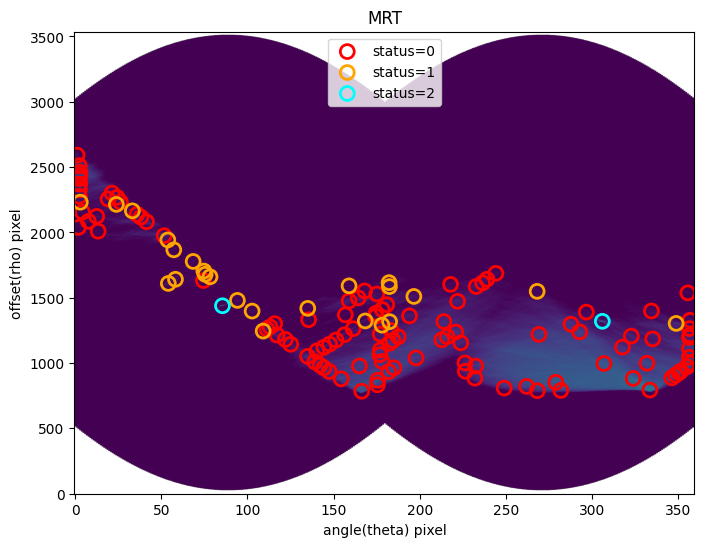

In [43]:
s4.plot_mrt(show_sources=True)

That seems to have worked! Let's make the map to confirm

<Axes: title={'center': 'Segmentation Mask'}>

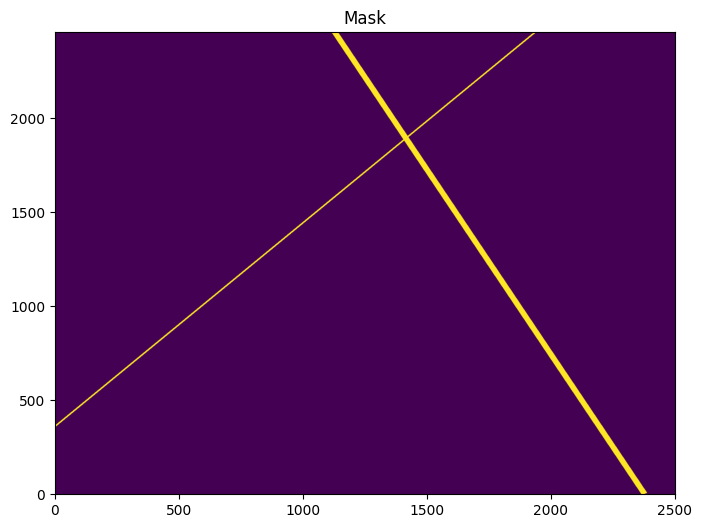

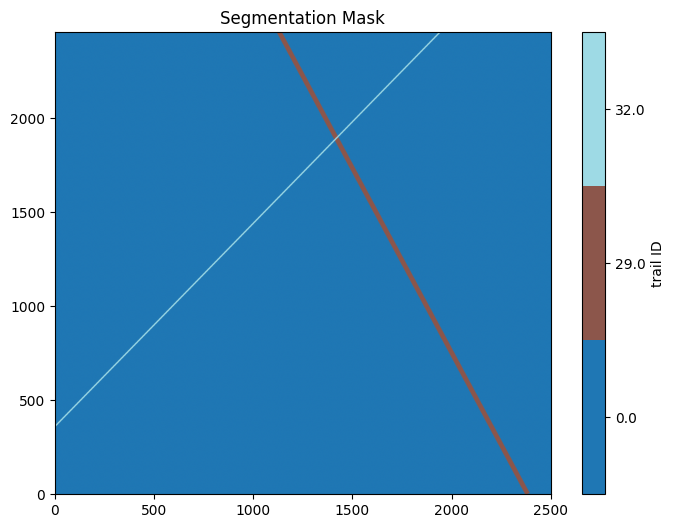

In [44]:
s4.make_mask()
s4.plot_mask()
s4.plot_segment()

Let's make a version plotting the mask on top of the original image

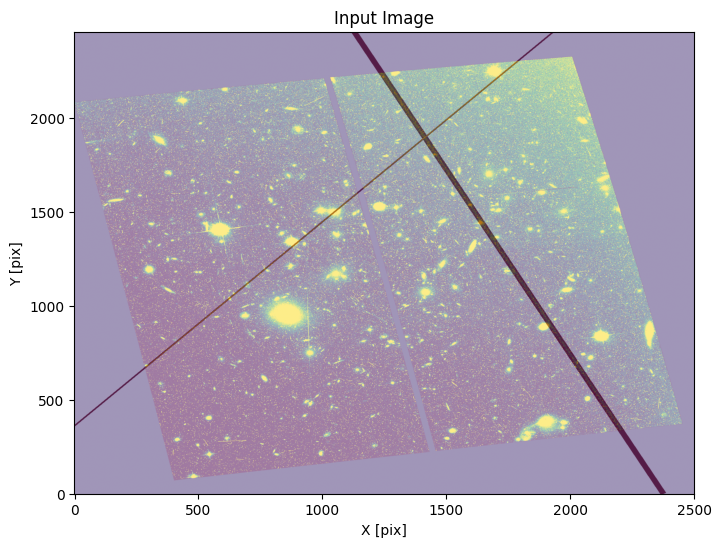

In [45]:
s4.plot_image(overlay_mask=True)

<a id="example5"></a>
## Example 5:  Finding trails in a DRC image using the WFC Wrapper

All of the setup from the last example can be streamlined using the `WfcWrapper` class.

In [46]:
w2 = WfcWrapper('hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits', binsize=2, extension=1, processes=8,
                output_root='example5')

INFO:findsat_mrt:image type is drc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


Extra rows/columns will be trimmed first.


Run full pipeline now

In [47]:
w2.run_all()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 6


INFO:findsat_mrt:6 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 11


INFO:findsat_mrt:11 sources found using kernel


INFO:findsat_mrt:Using kernel /home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 22


INFO:findsat_mrt:22 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:24 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.001411164179444313
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 12.344297097160364


INFO:utils_findsat_mrt:breaking into 23.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 23


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 12.344297097160364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 12.344297097160364, 253.55616981716037


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 23


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 12.344297097160364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 12.344297097160364, 253.55616981716037


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01007092236986529
baseline noise: 0.000687373007489189
snr of feature = 13.651320695079354


INFO:utils_findsat_mrt:width of feature = 4.772528807527607


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.651320695079354, 4.772528807527607, 253.6948639056779


INFO:utils_findsat_mrt:Checking persistence, step 4 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.009374515971323017
baseline noise: 0.000501782491344656
snr of feature = 17.68242940522212


INFO:utils_findsat_mrt:width of feature = 56.37455552758885


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 17.68242940522212, 56.37455552758885, 248.92233509815028


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.021133639551320242
baseline noise: 0.0005196307460740219
snr of feature = 39.67049479075616


INFO:utils_findsat_mrt:width of feature = 124.19258755052334


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.67049479075616, 124.19258755052334, 248.92233509815028


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01644099090790041
baseline noise: 0.0009695600630490841
snr of feature = 15.957165970921475


INFO:utils_findsat_mrt:width of feature = 201.8690863790701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.957165970921475, 201.8690863790701, 248.92233509815028


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.00517551965882281
baseline noise: 0.0007862650451649305
snr of feature = 5.5824109702564355


INFO:utils_findsat_mrt:width of feature = 2.6358234813750414


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.5824109702564355, 2.6358234813750414, 253.42545834833223


INFO:utils_findsat_mrt:Checking persistence, step 8 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.02119598517426011
baseline noise: 0.0003807062479235016
snr of feature = 54.67543293515685


INFO:utils_findsat_mrt:width of feature = 100.23790049039692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 54.67543293515685, 100.23790049039692, 256.06128182970724


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.08888981718944543
baseline noise: 0.0004578445286227712
snr of feature = 193.14847537183047


INFO:utils_findsat_mrt:width of feature = 86.98860642089628


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 193.14847537183047, 86.98860642089628, 250.7896348669572


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.039438057591198505
baseline noise: 0.0005515783354855667
snr of feature = 70.50037456870075


INFO:utils_findsat_mrt:width of feature = 107.71866302647803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 70.50037456870075, 107.71866302647803, 256.06128182970724


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.0176934823050136
baseline noise: 0.0004526295767449316
snr of feature = 38.0904245194395


INFO:utils_findsat_mrt:width of feature = 60.888247634881196


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.0904245194395, 60.888247634881196, 256.06128182970724


INFO:utils_findsat_mrt:Checking persistence, step 12 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.011590928673009347
baseline noise: 0.0010373866485220112
snr of feature = 10.173200165553713


INFO:utils_findsat_mrt:width of feature = 236.19225825371188


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.173200165553713, 236.19225825371188, 269.70298788491186


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.008899849860530685
baseline noise: 0.0013814208378088919
snr of feature = 5.442533380810276


INFO:utils_findsat_mrt:width of feature = 219.689511053282


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.442533380810276, 219.689511053282, 262.1302082461242


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.00789266382430077
baseline noise: 0.0014042493692953593
snr of feature = 4.620557143822142


INFO:utils_findsat_mrt:width of feature = 208.8789304274394


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.620557143822142, 208.8789304274394, 267.8494611496257


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.010502525526339346
baseline noise: 0.0009616656838736935
snr of feature = 9.921181552443501


INFO:utils_findsat_mrt:width of feature = 42.59745036985254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.921181552443501, 42.59745036985254, 252.51526493209875


INFO:utils_findsat_mrt:Checking persistence, step 16 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01447815832392906
baseline noise: 0.0012135883640095409
snr of feature = 10.930040492556369


INFO:utils_findsat_mrt:width of feature = 74.66824153426103


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.930040492556369, 74.66824153426103, 256.1235066294248


INFO:utils_findsat_mrt:Checking persistence, step 17 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.28566219923064196
baseline noise: 0.002591644666189665
snr of feature = 109.22429230263015


INFO:utils_findsat_mrt:width of feature = 65.3654010994253


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 109.22429230263015, 65.3654010994253, 242.3191362773067


INFO:utils_findsat_mrt:Checking persistence, step 18 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.016308373581853795
baseline noise: 0.0011019845514549699
snr of feature = 13.799094561100297


INFO:utils_findsat_mrt:width of feature = 53.08890010826133


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.799094561100297, 53.08890010826133, 224.84836204901092


INFO:utils_findsat_mrt:Checking persistence, step 19 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01839283540620012
baseline noise: 0.001779945557058635
snr of feature = 9.333369654628276


INFO:utils_findsat_mrt:width of feature = 26.680318317242097


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.333369654628276, 26.680318317242097, 202.55577259860104


INFO:utils_findsat_mrt:Checking persistence, step 20 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.0052485801902601974
baseline noise: 0.0017694687984519675
snr of feature = 1.9661897371979409


INFO:utils_findsat_mrt:width of feature = 12.197774806124414


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9661897371979409, 12.197774806124414, 196.4694630416846


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.022171252425991786
baseline noise: 0.002645937212179698
snr of feature = 7.379356971863787


INFO:utils_findsat_mrt:width of feature = 41.55526513084271


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.379356971863787, 41.55526513084271, 196.42470244736472


INFO:utils_findsat_mrt:Checking persistence, step 22 of 23


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.555265130842656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.555265130842656, 196.42470244736472


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 23


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.555265130842656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.555265130842656, 196.42470244736472


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 23
Number of sections that passed: 9
persistance score: 0.391304347826087


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.01355403009802103
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 15.906773737829866


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.906773737829866


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.906773737829866, 251.01655359554567


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.906773737829866


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.906773737829866, 251.01655359554567


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 8.270610123872757e-06
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 7.44210808913283


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 7.44210808913283, 252.46029956137465


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025451958306054654
baseline noise: 0.002751170153966858
snr of feature = 8.251321031291349


INFO:utils_findsat_mrt:width of feature = 22.265687141224333


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.251321031291349, 22.265687141224333, 251.37467036605364


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.028034111514834717
baseline noise: 0.0035797687728402507
snr of feature = 6.831263216644008


INFO:utils_findsat_mrt:width of feature = 24.96028072170367


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.831263216644008, 24.96028072170367, 251.24799624993588


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025489942838788773
baseline noise: 0.0037857892352668064
snr of feature = 5.733059146910578


INFO:utils_findsat_mrt:width of feature = 27.337221903643552


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.733059146910578, 27.337221903643552, 250.8643553551011


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03117899234900138
baseline noise: 0.003292615562458965
snr of feature = 8.469369186154406


INFO:utils_findsat_mrt:width of feature = 22.85835707135533


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.469369186154406, 22.85835707135533, 250.96090728667505


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027959841606899
baseline noise: 0.0036862675974238656
snr of feature = 6.584864871567825


INFO:utils_findsat_mrt:width of feature = 28.538952123633692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.584864871567825, 28.538952123633692, 249.94278620939204


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024992041506900212
baseline noise: 0.0036635360382301025
snr of feature = 5.821835856424157


INFO:utils_findsat_mrt:width of feature = 18.448358870105665


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.821835856424157, 18.448358870105665, 251.13813854686683


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0226576124419769
baseline noise: 0.0053093515085952175
snr of feature = 3.2674915016074717


INFO:utils_findsat_mrt:width of feature = 16.679152707632596


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2674915016074717, 16.679152707632596, 250.14859218414932


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.028352350338367388
baseline noise: 0.006104939923967314
snr of feature = 3.644165330285924


INFO:utils_findsat_mrt:width of feature = 19.187924075973143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.644165330285924, 19.187924075973143, 251.75784353843474


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04638059270748972
baseline noise: 0.0047703159084281225
snr of feature = 8.722750777478947


INFO:utils_findsat_mrt:width of feature = 30.81540282494302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.722750777478947, 30.81540282494302, 249.72010748647455


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03084583240117673
baseline noise: 0.006339574105913894
snr of feature = 3.865600099603235


INFO:utils_findsat_mrt:width of feature = 33.56846764834543


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.865600099603235, 33.56846764834543, 252.8411223368225


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02822466483234598
baseline noise: 0.0033314435939144947
snr of feature = 7.472202526227253


INFO:utils_findsat_mrt:width of feature = 24.893753194425358


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.472202526227253, 24.893753194425358, 250.77446967333043


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02848973434411403
baseline noise: 0.0035359007075194005
snr of feature = 7.057277819913929


INFO:utils_findsat_mrt:width of feature = 100.15009371060736


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.057277819913929, 100.15009371060736, 234.2924220842254


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025683188394129225
baseline noise: 0.0034045589162777917
snr of feature = 6.543763825420499


INFO:utils_findsat_mrt:width of feature = 21.800612269941524


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.543763825420499, 21.800612269941524, 251.41270315828416


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0303358859185733
baseline noise: 0.00380108524140461
snr of feature = 6.980848624000687


INFO:utils_findsat_mrt:width of feature = 20.906492216604192


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.980848624000687, 20.906492216604192, 251.17676160698187


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04100929639072737
baseline noise: 0.0033796916142570985
snr of feature = 11.134035016014844


INFO:utils_findsat_mrt:width of feature = 116.96047642314102


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.134035016014844, 116.96047642314102, 230.27026939037768


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020834747024278708
baseline noise: 0.005298581970933892
snr of feature = 2.932136397732565


INFO:utils_findsat_mrt:width of feature = 19.6358757913834


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.932136397732565, 19.6358757913834, 250.75661957685165


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025577096123682468
baseline noise: 0.005195358885298514
snr of feature = 3.9230662767222606


INFO:utils_findsat_mrt:width of feature = 17.800642347982176


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9230662767222606, 17.800642347982176, 251.26648459246437


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.026308375138256658
baseline noise: 0.003577006475379001
snr of feature = 6.354858124898742


INFO:utils_findsat_mrt:width of feature = 25.895452261471092


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.354858124898742, 25.895452261471092, 251.0994081496728


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024805191587369945
baseline noise: 0.004790458744398502
snr of feature = 4.178040958264118


INFO:utils_findsat_mrt:width of feature = 23.534404333128805


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.178040958264118, 23.534404333128805, 251.3027887953673


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02764389954960155
baseline noise: 0.005409224789537362
snr of feature = 4.110510401244735


INFO:utils_findsat_mrt:width of feature = 31.374098682946368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.110510401244735, 31.374098682946368, 250.07313625673925


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016114932219607348
baseline noise: 0.0007957575544795786
snr of feature = 19.2510577862455


INFO:utils_findsat_mrt:width of feature = 18.392297090324547


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.2510577862455, 18.392297090324547, 251.10904658527565


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.392297090324547


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.392297090324547, 251.10904658527565


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.392297090324547


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.392297090324547, 251.10904658527565


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.392297090324547


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.392297090324547, 251.10904658527565


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 18
persistance score: 0.6666666666666666


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.15870659053325653
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 4.110398118426588


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.110398118426588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.110398118426588, 250.5143797994775


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.110398118426588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.110398118426588, 250.5143797994775


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.110398118426588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.110398118426588, 250.5143797994775


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.0008753896447619199
baseline noise: 0.00081002868452571
snr of feature = -2.0806896860380695


INFO:utils_findsat_mrt:width of feature = 4.1100011610556635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0806896860380695, 4.1100011610556635, 250.5143797994775


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.17666541499971106
baseline noise: 0.0015048440810372622
snr of feature = 116.39782029639824


INFO:utils_findsat_mrt:width of feature = 4.489898576104679


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 116.39782029639824, 4.489898576104679, 250.5143797994775


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.22023568172648994
baseline noise: 0.0019848276269898873
snr of feature = 109.9596010916529


INFO:utils_findsat_mrt:width of feature = 4.135791315864594


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 109.9596010916529, 4.135791315864594, 250.3548530353974


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.2698230634090945
baseline noise: 0.0031951677144067565
snr of feature = 83.44723016963518


INFO:utils_findsat_mrt:width of feature = 4.218578478615882


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 83.44723016963518, 4.218578478615882, 250.39945282812423


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.3452405627409042
baseline noise: 0.0031490733591864016
snr of feature = 108.63242940459824


INFO:utils_findsat_mrt:width of feature = 4.159825534425295


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 108.63242940459824, 4.159825534425295, 250.40789225719385


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.393613042719289
baseline noise: 0.0038686309760074086
snr of feature = 100.74478908957978


INFO:utils_findsat_mrt:width of feature = 4.13881790465706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 100.74478908957978, 4.13881790465706, 250.41163864136922


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.39559084022180263
baseline noise: 0.0050470817569567734
snr of feature = 77.38011335491642


INFO:utils_findsat_mrt:width of feature = 4.340446576424881


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 77.38011335491642, 4.340446576424881, 250.41658251778128


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.3563871239767987
baseline noise: 0.021190888493946874
snr of feature = 15.8179415449522


INFO:utils_findsat_mrt:width of feature = 5.087050389570777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.8179415449522, 5.087050389570777, 250.43407855498666


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.2530981291070719
baseline noise: 0.004247796148778776
snr of feature = 58.58339812983648


INFO:utils_findsat_mrt:width of feature = 4.208156694380534


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 58.58339812983648, 4.208156694380534, 250.44494322002842


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.19896353837719075
baseline noise: 0.005635667044191802
snr of feature = 34.30434584176604


INFO:utils_findsat_mrt:width of feature = 4.271171855599505


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.30434584176604, 4.271171855599505, 250.4477682952641


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.1892566162913662
baseline noise: 0.007020607377267201
snr of feature = 25.957299578407


INFO:utils_findsat_mrt:width of feature = 110.89110300119899


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.957299578407, 110.89110300119899, 254.7189401508636


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.13498844426697412
baseline noise: 0.004786988557965828
snr of feature = 27.199032154013715


INFO:utils_findsat_mrt:width of feature = 4.181685248969188


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 27.199032154013715, 4.181685248969188, 250.47233645729088


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.24447924304564708
baseline noise: 0.003867376430794484
snr of feature = 62.21578657276534


INFO:utils_findsat_mrt:width of feature = 165.08002887491074


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 62.21578657276534, 165.08002887491074, 254.65402170626007


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.1476083550969506
baseline noise: 0.002966688959053415
snr of feature = 48.75525143830656


INFO:utils_findsat_mrt:width of feature = 4.251878776835156


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 48.75525143830656, 4.251878776835156, 250.52551518859264


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12311996291115453
baseline noise: 0.004930665678718896
snr of feature = 23.97025167261878


INFO:utils_findsat_mrt:width of feature = 3.639086700050541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 23.97025167261878, 3.639086700050541, 250.52040911898138


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12508798410588767
baseline noise: 0.0025143662814833233
snr of feature = 48.74930861389589


INFO:utils_findsat_mrt:width of feature = 4.5339412984630485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 48.74930861389589, 4.5339412984630485, 250.54167009556656


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.11561815741159402
baseline noise: 0.0035816678986082006
snr of feature = 31.28053540545232


INFO:utils_findsat_mrt:width of feature = 4.238338611937195


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.28053540545232, 4.238338611937195, 250.51927159966286


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12608908940517086
baseline noise: 0.004442285007444215
snr of feature = 27.383836064970048


INFO:utils_findsat_mrt:width of feature = 4.356178368089502


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 27.383836064970048, 4.356178368089502, 250.56119689147945


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.14559902889254311
baseline noise: 0.0038438000846654336
snr of feature = 36.87892858252438


INFO:utils_findsat_mrt:width of feature = 4.137225335692165


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.87892858252438, 4.137225335692165, 250.59282893244634


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.17645064732175808
baseline noise: 0.003060467473178659
snr of feature = 56.65480236863721


INFO:utils_findsat_mrt:width of feature = 4.327995718689635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.65480236863721, 4.327995718689635, 250.60664760094508


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.20366460934057506
baseline noise: 0.003253294989095009
snr of feature = 61.60256448408628


INFO:utils_findsat_mrt:width of feature = 4.072708668442715


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 61.60256448408628, 4.072708668442715, 250.63016848653555


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.2410252926466484
baseline noise: 0.002948440084205827
snr of feature = 80.74671547092653


INFO:utils_findsat_mrt:width of feature = 4.010966386722316


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 80.74671547092653, 4.010966386722316, 250.67328580181785


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.3196737347034611
baseline noise: 0.0015526492478206606
snr of feature = 204.8892149351591


INFO:utils_findsat_mrt:width of feature = 4.349507286194466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 204.8892149351591, 4.349507286194466, 250.73590142347314


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.002634838555256301
baseline noise: 0.00024208215954240223
snr of feature = 9.884067459728657


INFO:utils_findsat_mrt:width of feature = 120.72391228948032


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.884067459728657, 120.72391228948032, 249.9651361305993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.349507286194466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.349507286194466, 250.73590142347314


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 20
persistance score: 0.7142857142857143


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.002465298864990473
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 73.82404654961988


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 73.82404654961988


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 73.82404654961988, 252.30034653400207


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012594272180348077
baseline noise: 0.0017663403705454187
snr of feature = 6.130150219268985


INFO:utils_findsat_mrt:width of feature = 89.28800289178312


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.130150219268985, 89.28800289178312, 269.4991698898004


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025040278373964858
baseline noise: 0.0033971627281028497
snr of feature = 6.370938744505959


INFO:utils_findsat_mrt:width of feature = 97.64833386660902


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.370938744505959, 97.64833386660902, 258.9016789115777


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020942171470970307
baseline noise: 0.0037622486301460475
snr of feature = 4.566397527044178


INFO:utils_findsat_mrt:width of feature = 104.98429567341455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.566397527044178, 104.98429567341455, 252.30034653400207


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007507548783389274
baseline noise: 0.003061410280752095
snr of feature = 1.4523171005831008


INFO:utils_findsat_mrt:width of feature = 73.82399965869692


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4523171005831008, 73.82399965869692, 252.30034653400207


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015125899246870175
baseline noise: 0.0035312520688569574
snr of feature = 3.283437985146817


INFO:utils_findsat_mrt:width of feature = 108.94483899440931


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.283437985146817, 108.94483899440931, 254.4083800042515


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021873400262691346
baseline noise: 0.004157599528298005
snr of feature = 4.2610647355075235


INFO:utils_findsat_mrt:width of feature = 124.2552765847635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.2610647355075235, 124.2552765847635, 252.30034653400207


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01595974337769973
baseline noise: 0.0035552098312852756
snr of feature = 3.4891143237894293


INFO:utils_findsat_mrt:width of feature = 55.816713569584834


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4891143237894293, 55.816713569584834, 255.0067500378272


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0046786090899670245
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.68314636292357


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014461635932816068
baseline noise: 0.008110282927910554
snr of feature = 0.7831234818021088


INFO:utils_findsat_mrt:width of feature = 55.81667282099232


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7831234818021088, 55.81667282099232, 255.00675245524334


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.4370980432213879
baseline noise: 0.009438335827617382
snr of feature = 45.310922942835056


INFO:utils_findsat_mrt:width of feature = 149.3414509645644


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 45.310922942835056, 149.3414509645644, 310.823463607412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005355077078216912
baseline noise: 0.004273747843423962
snr of feature = 0.25301662016789234


INFO:utils_findsat_mrt:width of feature = 55.81668081666837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.25301662016789234, 55.81668081666837, 255.0067502584608


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.019555954271165382
baseline noise: 0.0051746236613038525
snr of feature = 2.779203194505909


INFO:utils_findsat_mrt:width of feature = 168.21846471954933


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.779203194505909, 168.21846471954933, 247.67761589370278


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.08723235213462434
baseline noise: 0.004496919547478209
snr of feature = 18.398246113507337


INFO:utils_findsat_mrt:width of feature = 148.5521083395363


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.398246113507337, 148.5521083395363, 229.95681342274798


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007055349975352986
baseline noise: 0.003975554038043893
snr of feature = 0.7746834548938635


INFO:utils_findsat_mrt:width of feature = 55.81668312045721


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7746834548938635, 55.81668312045721, 255.0067501810789


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0038681818066233532
baseline noise: 0.0049315324796321775
snr of feature = -0.21562276582392806


INFO:utils_findsat_mrt:width of feature = 55.81666522019708


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.21562276582392806, 55.81666522019708, 255.00674911108294


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0048468114991008435
baseline noise: 0.006979345521518793
snr of feature = -1.694450716640565


INFO:utils_findsat_mrt:width of feature = 55.816669302382365


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.694450716640565, 55.816669302382365, 255.00674970006577


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.2390748711643546
baseline noise: 0.004109445382250894
snr of feature = 57.1769190063805


INFO:utils_findsat_mrt:width of feature = 66.20518575922131


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.1769190063805, 66.20518575922131, 245.2639768193706


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0179738405803216
baseline noise: 0.003005083679478139
snr of feature = 4.981144785772797


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.981144785772797, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009992913855008556
baseline noise: 0.003381341500229461
snr of feature = 1.9553104453751349


INFO:utils_findsat_mrt:width of feature = 21.3873650653685


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9553104453751349, 21.3873650653685, 246.93224356737466


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009200620348339583
baseline noise: 0.004313424535571697
snr of feature = 1.1330198946253598


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1330198946253598, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010174728304955614
baseline noise: 0.003353004164436163
snr of feature = 2.0345110849770096


INFO:utils_findsat_mrt:width of feature = 78.79375161460331


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0345110849770096, 78.79375161460331, 243.64665125560768


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006951162843175311
baseline noise: 0.0040106228342520886
snr of feature = 0.733187868928987


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.733187868928987, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013435474937859045
baseline noise: 0.0029908692316689034
snr of feature = 3.4921639487267244


INFO:utils_findsat_mrt:width of feature = 144.06203745531363


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4921639487267244, 144.06203745531363, 218.5717224147518


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009067136428065588
baseline noise: 0.0024504029013688766
snr of feature = 2.7002635048303216


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7002635048303216, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.000733736403688688
baseline noise: 0.0009546603771500554
snr of feature = -1.7685836987171386


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.7685836987171386, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 66.2043207248326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 66.2043207248326, 245.26399127213895


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0029083238914608955
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 102.61080647704088


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.001887783408164978
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 67.19891311131843


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 67.19891311131843


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 67.19891311131843, 256.434804932386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 67.19891311131843


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 67.19891311131843, 256.434804932386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0006098773731831863
baseline noise: 0.000694157183987076
snr of feature = -0.1214131507215791


INFO:utils_findsat_mrt:width of feature = 67.19885005324636


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.1214131507215791, 67.19885005324636, 256.434804932386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.022344703349830748
baseline noise: 0.003309781046234292
snr of feature = 5.751112245099556


INFO:utils_findsat_mrt:width of feature = 49.31357077612063


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.751112245099556, 49.31357077612063, 256.434804932386


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.011775531110622052
baseline noise: 0.003023075469739544
snr of feature = 2.895215726002561


INFO:utils_findsat_mrt:width of feature = 50.992365151289505


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.895215726002561, 50.992365151289505, 239.78896881940585


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007515744385238289
baseline noise: 0.00301714456699077
snr of feature = 1.4910123523627898


INFO:utils_findsat_mrt:width of feature = 49.34924448601362


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4910123523627898, 49.34924448601362, 264.13704018698684


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.019009417158270536
baseline noise: 0.0035315587690519924
snr of feature = 4.382727118929809


INFO:utils_findsat_mrt:width of feature = 171.6072021831685


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.382727118929809, 171.6072021831685, 256.5975532326903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.003957820813100456
baseline noise: 0.0052186588409569605
snr of feature = -0.24160192614263729


INFO:utils_findsat_mrt:width of feature = 49.313499566113705


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.24160192614263729, 49.313499566113705, 256.4348049108668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.4657022948191383
baseline noise: 0.009700825121636112
snr of feature = 47.00646223180181


INFO:utils_findsat_mrt:width of feature = 219.3548832005458


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 47.00646223180181, 219.3548832005458, 207.12123415626536


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0013202727020818206
baseline noise: 0.012827777371872212
snr of feature = -1.1029229510154126


INFO:utils_findsat_mrt:width of feature = 49.31348141472051


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1029229510154126, 49.31348141472051, 256.4348037885316


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007189565426760396
baseline noise: 0.009520758524081858
snr of feature = -0.24485371532372444


INFO:utils_findsat_mrt:width of feature = 49.31350894812704


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.24485371532372444, 49.31350894812704, 256.43480644162184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012039063464224205
baseline noise: 0.0036921537656136303
snr of feature = 2.2607156225042355


INFO:utils_findsat_mrt:width of feature = 45.087804064836746


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2607156225042355, 45.087804064836746, 266.4401457975849


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0012070317623344541
baseline noise: 0.002520030656733728
snr of feature = -0.5210249688394994


INFO:utils_findsat_mrt:width of feature = 49.31349829748979


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5210249688394994, 49.31349829748979, 256.4348060217034


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0016751592234338854
baseline noise: 0.00268612942938426
snr of feature = -0.37636689985639254


INFO:utils_findsat_mrt:width of feature = 49.313502574677386


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.37636689985639254, 49.313502574677386, 256.4348051147835


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.038162273765994535
baseline noise: 0.00192274790767517
snr of feature = 18.847778075149357


INFO:utils_findsat_mrt:width of feature = 547.1676769679655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.847778075149357, 547.1676769679655, 305.7483757085066


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.024446777426462955
baseline noise: 0.0040215337217090795
snr of feature = 5.07896865180917


INFO:utils_findsat_mrt:width of feature = 27.351531259369153


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.07896865180917, 27.351531259369153, 260.9054940891036


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012324902454789576
baseline noise: 0.0028878714144185947
snr of feature = 3.2678155243525295


INFO:utils_findsat_mrt:width of feature = 6.285420635757987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2678155243525295, 6.285420635757987, 262.60689690901864


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0032864317742823477
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 262.15225589181665


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.02439018146476215
baseline noise: 0.0034404648578214183
snr of feature = 6.089211043477007


INFO:utils_findsat_mrt:width of feature = 68.31669626547236


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.089211043477007, 68.31669626547236, 256.32147627326066


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.033219194757346436
baseline noise: 0.004323432659118191
snr of feature = 6.683523111499517


INFO:utils_findsat_mrt:width of feature = 109.88446716418139


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.683523111499517, 109.88446716418139, 257.1709659059914


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.002743214675714376
baseline noise: 0.002930325687847265
snr of feature = -0.06385331600131737


INFO:utils_findsat_mrt:width of feature = 6.284928959391323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.06385331600131737, 6.284928959391323, 262.60692833476173


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.24970722165338086
baseline noise: 0.0036433892977036837
snr of feature = 67.53706844085085


INFO:utils_findsat_mrt:width of feature = 176.18898939193772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 67.53706844085085, 176.18898939193772, 256.32147627326066


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007799129174378536
baseline noise: 0.0028164931222697445
snr of feature = 1.769092213544411


INFO:utils_findsat_mrt:width of feature = 51.68851474020019


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.769092213544411, 51.68851474020019, 260.34718821242564


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03257100423554918
baseline noise: 0.0008240276931683609
snr of feature = 38.52658934351427


INFO:utils_findsat_mrt:width of feature = 169.6649605067946


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.52658934351427, 169.6649605067946, 268.89231754477663


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 6.285420635757987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 6.285420635757987, 262.60689690901864


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 3
persistance score: 0.12


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0004662323044613004
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.602358865518056


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.602358865518056


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.602358865518056, 248.0104544198163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.602358865518056


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.602358865518056, 248.0104544198163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0036863321665809553
baseline noise: 0.0039251008068782334
snr of feature = -0.060831212252910015


INFO:utils_findsat_mrt:width of feature = 0.7007802114055153


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.060831212252910015, 0.7007802114055153, 248.0104544198163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.00895028003511198
baseline noise: 0.0038730540167274405
snr of feature = 1.3109102006985618


INFO:utils_findsat_mrt:width of feature = 7.897961118760861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3109102006985618, 7.897961118760861, 248.0104544198163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03630693309409462
baseline noise: 0.0035592526239464945
snr of feature = 9.200718220961102


INFO:utils_findsat_mrt:width of feature = 4.717891271318706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.200718220961102, 4.717891271318706, 248.1170728912494


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 40.713684725084505
baseline noise: 0.007388887037988169
snr of feature = 5509.124125022479


INFO:utils_findsat_mrt:width of feature = 4.91249186787195


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5509.124125022479, 4.91249186787195, 250.16258377974222


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 98.80700690851216
baseline noise: 0.004847982416455999
snr of feature = 20380.057194663397


INFO:utils_findsat_mrt:width of feature = 6.235835033342198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20380.057194663397, 6.235835033342198, 247.20527524448127


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03975117893161049
baseline noise: 0.003364153676090038
snr of feature = 10.816100796504335


INFO:utils_findsat_mrt:width of feature = 5.533268845928376


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.816100796504335, 5.533268845928376, 249.11458193214324


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.007441448742579918
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.70007256664618


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008654105545396855
baseline noise: 0.0051159522428833705
snr of feature = 0.6915923242706753


INFO:utils_findsat_mrt:width of feature = 18.816450939306918


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6915923242706753, 18.816450939306918, 253.9608599508706


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.18505966248244077
baseline noise: 0.004872929925373652
snr of feature = 36.97708264155893


INFO:utils_findsat_mrt:width of feature = 149.57612733741354


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.97708264155893, 149.57612733741354, 254.64785077807161


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.027320225660237597
baseline noise: 0.0004560396121947209
snr of feature = 58.90757146897218


INFO:utils_findsat_mrt:width of feature = 57.7019884132913


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 58.90757146897218, 57.7019884132913, 243.58131308621486


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.1418504852957607
baseline noise: 0.0017344266465417297
snr of feature = 80.78523178169347


INFO:utils_findsat_mrt:width of feature = 67.23524344878388


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 80.78523178169347, 67.23524344878388, 260.0844171822306


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.028495739244016594
baseline noise: 0.0038768030073663188
snr of feature = 6.350319113422014


INFO:utils_findsat_mrt:width of feature = 60.56164275371003


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.350319113422014, 60.56164275371003, 250.13702264952903


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.00775341005929856
baseline noise: 0.00438537449662052
snr of feature = 0.7680154945201448


INFO:utils_findsat_mrt:width of feature = 60.56153276236725


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7680154945201448, 60.56153276236725, 250.1370217564015


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.015873537814427522
baseline noise: 0.0037541345450905245
snr of feature = 3.228281544993151


INFO:utils_findsat_mrt:width of feature = 75.62431294462624


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.228281544993151, 75.62431294462624, 279.73007905250876


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.015418404800164667
baseline noise: 0.004123499068160827
snr of feature = 2.7391556407072555


INFO:utils_findsat_mrt:width of feature = 10.750831083254411


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7391556407072555, 10.750831083254411, 248.52353435950582


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.013895092819534792
baseline noise: 0.006680997168635121
snr of feature = 1.0797932507391645


INFO:utils_findsat_mrt:width of feature = 60.56151280421898


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0797932507391645, 60.56151280421898, 250.13701579941647


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.013171638954830315
baseline noise: 0.004386669815614018
snr of feature = 2.0026511017416597


INFO:utils_findsat_mrt:width of feature = 60.561556659680804


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0026511017416597, 60.561556659680804, 250.13702339287607


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.011844155384343242
baseline noise: 0.004143687427038841
snr of feature = 1.8583612043361348


INFO:utils_findsat_mrt:width of feature = 37.11010239098388


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8583612043361348, 37.11010239098388, 247.97793387486138


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010524248797009422
baseline noise: 0.0033488007586252753
snr of feature = 2.142691833756559


INFO:utils_findsat_mrt:width of feature = 60.56152900316323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.142691833756559, 60.56152900316323, 250.1370260586119


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0388890919692965
baseline noise: 0.0021624722199739305
snr of feature = 16.983626152554837


INFO:utils_findsat_mrt:width of feature = 79.32655940221485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.983626152554837, 79.32655940221485, 255.1046793846111


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 60.561642753710004


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 60.561642753710004, 250.13702264952903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 60.561642753710004


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 60.561642753710004, 250.13702264952903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 60.561642753710004


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 60.561642753710004, 250.13702264952903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 7
persistance score: 0.28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.002934725722298026
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 94.55685365672397


INFO:utils_findsat_mrt:amplitude of feature: 0.0002555783538307605
baseline noise: 1.380505687771039e-06
snr of feature = 184.13386514431292


INFO:utils_findsat_mrt:width of feature = 1.6538512258721312


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.00011628255985821276
baseline noise: 0.0001137220556600982
snr of feature = -2.0225154582657883


INFO:utils_findsat_mrt:width of feature = 1.6538462092327109


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0225154582657883, 1.6538462092327109, 258.00870022906184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.330061431126551e-05
baseline noise: 0.0014960741833040115
snr of feature = -0.9710571743069331


INFO:utils_findsat_mrt:width of feature = 1.6538447873416544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9710571743069331, 1.6538447873416544, 258.0086810015889


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020443736651955827
baseline noise: 0.0025704937755963047
snr of feature = 6.9532332838321205


INFO:utils_findsat_mrt:width of feature = 43.92166659491386


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.9532332838321205, 43.92166659491386, 259.26769865397387


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0033276063399381647
baseline noise: 0.0037600442663210955
snr of feature = -0.11500873281102005


INFO:utils_findsat_mrt:width of feature = 43.92150381842407


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.11500873281102005, 43.92150381842407, 259.26769961485024


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0019882801695300144
baseline noise: 0.003585002907313242
snr of feature = -0.445389523820465


INFO:utils_findsat_mrt:width of feature = 43.92151509416985


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.445389523820465, 43.92151509416985, 259.26769764450944


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.017018853326372266
baseline noise: 0.003714023652893835
snr of feature = 3.5823222781879114


INFO:utils_findsat_mrt:width of feature = 129.21312638580213


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5823222781879114, 129.21312638580213, 253.38857738066426


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.6081167558059775
baseline noise: 0.004144327647491239
snr of feature = 145.73471972567123


INFO:utils_findsat_mrt:width of feature = 93.93540900672497


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 145.73471972567123, 93.93540900672497, 221.97921714421238


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006485254642023212
baseline noise: 0.0038743901254785847
snr of feature = 0.6738775476881331


INFO:utils_findsat_mrt:width of feature = 43.9215455913924


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6738775476881331, 43.9215455913924, 259.26769944112107


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005918118527642817
baseline noise: 0.003916924395105434
snr of feature = 0.5109095633906192


INFO:utils_findsat_mrt:width of feature = 43.92152090758597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5109095633906192, 43.92152090758597, 259.2677001890827


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.13786758710885041
baseline noise: 0.004964194467808306
snr of feature = 26.772398523645876


INFO:utils_findsat_mrt:width of feature = 96.42613938066833


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.772398523645876, 96.42613938066833, 283.15935648547025


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011705368794789242
baseline noise: 0.007895675675515692
snr of feature = 0.48250374962681425


INFO:utils_findsat_mrt:width of feature = 254.39627976908923


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.48250374962681425, 254.39627976908923, 215.34603205906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011109661575653922
baseline noise: 0.007247939506711955
snr of feature = 0.5328027455755969


INFO:utils_findsat_mrt:width of feature = 43.92153409856712


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5328027455755969, 43.92153409856712, 259.2676894789347


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03788513737890953
baseline noise: 0.00120251625266917
snr of feature = 30.50488593798016


INFO:utils_findsat_mrt:width of feature = 196.49290837530296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.50488593798016, 196.49290837530296, 215.34603205906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010485401163488034
baseline noise: 0.004371392485870692
snr of feature = 1.3986409816503944


INFO:utils_findsat_mrt:width of feature = 218.25746094502347


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3986409816503944, 218.25746094502347, 296.11801535464645


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006098571743665357
baseline noise: 0.002000756581903365
snr of feature = 2.0481327907784004


INFO:utils_findsat_mrt:width of feature = 43.92154159545427


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0481327907784004, 43.92154159545427, 259.2676982763974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.06512774433369621
baseline noise: 0.003917628593230003
snr of feature = 15.624277361627012


INFO:utils_findsat_mrt:width of feature = 86.54349964556945


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.624277361627012, 86.54349964556945, 252.41697858855548


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006313809310771917
baseline noise: 0.004910969041755951
snr of feature = 0.28565447207836


INFO:utils_findsat_mrt:width of feature = 43.92150572088565


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.28565447207836, 43.92150572088565, 259.26769528856335


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009200301047756383
baseline noise: 0.0032480822028746383
snr of feature = 1.8325333144628773


INFO:utils_findsat_mrt:width of feature = 165.25471019466238


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8325333144628773, 165.25471019466238, 215.34603205906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010950731957783878
baseline noise: 0.0038565659373924204
snr of feature = 1.8395033653147157


INFO:utils_findsat_mrt:width of feature = 265.45373736230613


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8395033653147157, 265.45373736230613, 259.09000460127555


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023825186400087052
baseline noise: 0.00378067184271884
snr of feature = 5.301839300327468


INFO:utils_findsat_mrt:width of feature = 27.2911206989902


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.301839300327468, 27.2911206989902, 248.60878582918792


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.046371221693799515
baseline noise: 0.0049715518367281246
snr of feature = 8.327313325232735


INFO:utils_findsat_mrt:width of feature = 87.7303841647132


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.327313325232735, 87.7303841647132, 275.8999065281781


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010514598033652218
baseline noise: 0.0029912358666104298
snr of feature = 2.515135048700461


INFO:utils_findsat_mrt:width of feature = 185.79303604220297


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.515135048700461, 185.79303604220297, 244.44456832401


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.007139579489121235
baseline noise: 0.006205439626533068
snr of feature = -2.1505356459506904


INFO:utils_findsat_mrt:width of feature = 27.29074512875809


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1505356459506904, 27.29074512875809, 248.6087849676299


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0038891241989928455
baseline noise: 0.004419050355789779
snr of feature = -0.11991856035372649


INFO:utils_findsat_mrt:width of feature = 27.290829878217266


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.11991856035372649, 27.290829878217266, 248.6087754616831


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.00017446351916973707
baseline noise: 0.004480138948522343
snr of feature = -1.038941542031253


INFO:utils_findsat_mrt:width of feature = 27.290811025813554


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.038941542031253, 27.290811025813554, 248.6087819718814


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021109645541586845
baseline noise: 0.0005034607892689687
snr of feature = 40.92907569274324


INFO:utils_findsat_mrt:width of feature = 42.5140796191983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.92907569274324, 42.5140796191983, 228.8515399699542


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00015586970732963442
baseline noise: 0.00046631221532719664
snr of feature = -0.6657396006230171


INFO:utils_findsat_mrt:width of feature = 173.48955139547616


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6657396006230171, 173.48955139547616, 271.3656195891525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


INFO:utils_findsat_mrt:amplitude of feature: 0.0009026108421148776
baseline noise: 2.4873161218011215e-05
snr of feature = 35.288545480953054


INFO:utils_findsat_mrt:width of feature = 28.639223571584665


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0001537034936177546
baseline noise: 0.00014926429128532174
snr of feature = -2.0297405514353546


INFO:utils_findsat_mrt:width of feature = 28.63902464165909


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0297405514353546, 28.63902464165909, 248.68108777365362


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02931657493405691
baseline noise: 0.0011699051762932616
snr of feature = 24.058932576863896


INFO:utils_findsat_mrt:width of feature = 60.52122321759447


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.058932576863896, 60.52122321759447, 255.02924170221664


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007189785043685493
baseline noise: 0.002677141636931569
snr of feature = 1.6856199703823411


INFO:utils_findsat_mrt:width of feature = 61.866273020888315


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6856199703823411, 61.866273020888315, 260.31903320980325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004418104956932385
baseline noise: 0.0040543617463045575
snr of feature = 0.08971651603593823


INFO:utils_findsat_mrt:width of feature = 60.521158480937004


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.08971651603593823, 60.521158480937004, 255.02924216786332


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009126375802215899
baseline noise: 0.00347011060920332
snr of feature = 1.6299956485569098


INFO:utils_findsat_mrt:width of feature = 26.978048118127276


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6299956485569098, 26.978048118127276, 244.37815077277418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.045051443230266656
baseline noise: 0.004184686606278722
snr of feature = 9.765786657158813


INFO:utils_findsat_mrt:width of feature = 48.6539848546164


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.765786657158813, 48.6539848546164, 277.75057104064916


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.6296676725476344
baseline noise: 0.004528873284865259
snr of feature = 138.0340671822016


INFO:utils_findsat_mrt:width of feature = 91.82415933914328


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 138.0340671822016, 91.82415933914328, 273.58654637541633


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006013774593384682
baseline noise: 0.0036342835656053927
snr of feature = 0.6547345535440953


INFO:utils_findsat_mrt:width of feature = 62.203043677406896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6547345535440953, 62.203043677406896, 236.29647438977588


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005447350662944937
baseline noise: 0.004718316463368151
snr of feature = 0.1545115096108597


INFO:utils_findsat_mrt:width of feature = 60.52113546045467


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1545115096108597, 60.52113546045467, 255.02924097319615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01481056057637678
baseline noise: 0.007062320381309339
snr of feature = 1.0971238596840511


INFO:utils_findsat_mrt:width of feature = 22.82308135019244


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0971238596840511, 22.82308135019244, 263.76556137916657


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.017679526882423927
baseline noise: 0.007193938583567195
snr of feature = 1.4575587735497924


INFO:utils_findsat_mrt:width of feature = 226.79941558688918


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4575587735497924, 226.79941558688918, 197.30133531558894


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.12748371851823648
baseline noise: 0.005688824811752703
snr of feature = 21.40949980650912


INFO:utils_findsat_mrt:width of feature = 139.9049171028807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 21.40949980650912, 139.9049171028807, 236.36521505119512


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03058108320068418
baseline noise: 0.0009902030712373813
snr of feature = 29.88364810106005


INFO:utils_findsat_mrt:width of feature = 187.6327217599437


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 29.88364810106005, 187.6327217599437, 260.601357443686


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0066700351785725235
baseline noise: 0.0037560497523826913
snr of feature = 0.7758111894927147


INFO:utils_findsat_mrt:width of feature = 209.03822136149122


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7758111894927147, 209.03822136149122, 285.99524023711865


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.018559346553244135
baseline noise: 0.0027351311722345396
snr of feature = 5.785541674069537


INFO:utils_findsat_mrt:width of feature = 50.101305500770906


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.785541674069537, 50.101305500770906, 244.0759325856579


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.073404687189307
baseline noise: 0.0041086207544369265
snr of feature = 16.86601674297556


INFO:utils_findsat_mrt:width of feature = 86.43948327536066


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.86601674297556, 86.43948327536066, 288.9230956610281


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008018711171801026
baseline noise: 0.004993201122819499
snr of feature = 0.6059259329960894


INFO:utils_findsat_mrt:width of feature = 26.652711513031335


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6059259329960894, 26.652711513031335, 251.45456610127377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008543352380312006
baseline noise: 0.003380078769909883
snr of feature = 1.5275601433808546


INFO:utils_findsat_mrt:width of feature = 54.989356394040186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5275601433808546, 54.989356394040186, 260.608184940753


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005844411498710116
baseline noise: 0.0027020298751379295
snr of feature = 1.1629707178614292


INFO:utils_findsat_mrt:width of feature = 50.16759813448715


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1629707178614292, 50.16759813448715, 252.5609459390263


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0061652086102944245
baseline noise: 0.004198662753418097
snr of feature = 0.46837433067835205


INFO:utils_findsat_mrt:width of feature = 50.10124037160162


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.46837433067835205, 50.10124037160162, 244.07593426598518


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003731391218827597
baseline noise: 0.004963103555688044
snr of feature = -0.2481738136309535


INFO:utils_findsat_mrt:width of feature = 50.101239506143116


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2481738136309535, 50.101239506143116, 244.0759324699878


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012020149649438849
baseline noise: 0.003164716593113132
snr of feature = 2.798175696236555


INFO:utils_findsat_mrt:width of feature = 185.23368637271108


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.798175696236555, 185.23368637271108, 253.8358291187826


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03782501277237613
baseline noise: 0.00574436042551662
snr of feature = 5.584721356333475


INFO:utils_findsat_mrt:width of feature = 33.34605707177974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.584721356333475, 33.34605707177974, 231.17660098910721


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008335293857314957
baseline noise: 0.003028121965565401
snr of feature = 1.7526281808000488


INFO:utils_findsat_mrt:width of feature = 150.3325662889876


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7526281808000488, 150.3325662889876, 233.62972269637052


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004181421713441144
baseline noise: 0.0053198423735902845
snr of feature = -0.21399518636129003


INFO:utils_findsat_mrt:width of feature = 33.34553094021027


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.21399518636129003, 33.34553094021027, 231.17660820382105


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012852940959637236
baseline noise: 0.0003062476808304904
snr of feature = 40.96910463054707


INFO:utils_findsat_mrt:width of feature = 62.177734318844216


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.96910463054707, 62.177734318844216, 249.48325932750285


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 1.4133177117771779e-05
baseline noise: 0.0002167137567659787
snr of feature = -0.9347841257118085


INFO:utils_findsat_mrt:width of feature = 62.17771496506114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9347841257118085, 62.17771496506114, 249.48325936090035


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 4
persistance score: 0.14814814814814814


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.002492113970220089
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 44.569050798590354


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 44.569050798590354


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 44.569050798590354, 248.21780531965047


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00017011445166474263
baseline noise: 0.0001749353056123866
snr of feature = -1.972442075481745


INFO:utils_findsat_mrt:width of feature = 44.56904925264797


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.972442075481745, 44.56904925264797, 248.21780531965047


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.009336182116323718
baseline noise: 0.0016438855438813689
snr of feature = 4.6793382915699295


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.6793382915699295, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.003912261679151157
baseline noise: 0.003773446200284269
snr of feature = 0.0367874540934043


INFO:utils_findsat_mrt:width of feature = 1.2489698631025021


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0367874540934043, 1.2489698631025021, 249.4765384218794


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008404747431902724
baseline noise: 0.003119748097495054
snr of feature = 1.6940468170014003


INFO:utils_findsat_mrt:width of feature = 18.684049263588605


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6940468170014003, 18.684049263588605, 249.91500560441017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.006479368632970999
baseline noise: 0.003790204837322868
snr of feature = 0.70950355220051


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.70950355220051, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01779669579303167
baseline noise: 0.003275871638156495
snr of feature = 4.432659688414044


INFO:utils_findsat_mrt:width of feature = 175.72721341775076


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.432659688414044, 175.72721341775076, 240.66926892860968


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0004030796787063695
baseline noise: 0.005370646521325055
snr of feature = -1.0750523567518127


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0750523567518127, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.029318613612936542
baseline noise: 0.03333819716342669
snr of feature = -1.8794300864325144


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8794300864325144, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.03164063656208635
baseline noise: 0.017819301091817754
snr of feature = -2.7756384719608933


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.7756384719608933, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00488683997752401
baseline noise: 0.009094112412207677
snr of feature = -1.537363049412503


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.537363049412503, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01010233098624384
baseline noise: 0.0037607610888589584
snr of feature = 1.6862464133048556


INFO:utils_findsat_mrt:width of feature = 81.29227265025102


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6862464133048556, 81.29227265025102, 247.39252948600745


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.000903588770536437
baseline noise: 0.00227814988477292
snr of feature = -0.603367286509112


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.603367286509112, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0032565453508835887
baseline noise: 0.0023580954385177557
snr of feature = 0.38100659442799223


INFO:utils_findsat_mrt:width of feature = 9.156007909981952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.38100659442799223, 9.156007909981952, 249.82527683859163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012366995437287455
baseline noise: 0.005435881326200688
snr of feature = 1.2750672237230656


INFO:utils_findsat_mrt:width of feature = 12.565745170767201


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2750672237230656, 12.565745170767201, 254.3934870679474


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0279956306891488
baseline noise: 0.004263605826732878
snr of feature = 5.566186422209985


INFO:utils_findsat_mrt:width of feature = 29.809521336620662


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.566186422209985, 29.809521336620662, 248.53700955288528


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010641270699433738
baseline noise: 0.0028641768630273306
snr of feature = 2.7152980448931854


INFO:utils_findsat_mrt:width of feature = 46.83809115186136


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7152980448931854, 46.83809115186136, 271.6570691956326


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007205285148410568
baseline noise: 0.0032263938591012026
snr of feature = 1.2332317327239741


INFO:utils_findsat_mrt:width of feature = 29.80916239462971


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2332317327239741, 29.80916239462971, 248.53701379868292


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.020387307690734345
baseline noise: 0.0033568929292464027
snr of feature = 5.073267190953017


INFO:utils_findsat_mrt:width of feature = 56.10390788905974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.073267190953017, 56.10390788905974, 245.95441436186758


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.05265651378393972
baseline noise: 0.004207766763549252
snr of feature = 11.514123700982879


INFO:utils_findsat_mrt:width of feature = 89.61000878306612


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.514123700982879, 89.61000878306612, 253.18747503502985


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.009057394946747012
baseline noise: 0.003018812482913201
snr of feature = 2.0003171770399217


INFO:utils_findsat_mrt:width of feature = 44.02273411501943


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0003171770399217, 44.02273411501943, 225.401212728549


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.242858268690349
baseline noise: 0.0035844932927458356
snr of feature = 66.75246844005441


INFO:utils_findsat_mrt:width of feature = 90.14638662662634


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 66.75246844005441, 90.14638662662634, 238.06427277442353


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010005157933270165
baseline noise: 0.0030347058877003546
snr of feature = 2.296911893116566


INFO:utils_findsat_mrt:width of feature = 157.59298871243294


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.296911893116566, 157.59298871243294, 240.45370193069877


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03325093990934457
baseline noise: 0.001081039280712703
snr of feature = 29.75830869663037


INFO:utils_findsat_mrt:width of feature = 179.07039734081926


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 29.75830869663037, 179.07039734081926, 286.25524053646814


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 56.10390788905974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 56.10390788905974, 245.95441436186758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 3
persistance score: 0.12


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0012397635728120804
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 79.89087079954629


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0005722552305087447
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.291139814281621


INFO:utils_findsat_mrt:breaking into 26.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 26


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.291139814281621


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.291139814281621, 248.02809845215708


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.019514854493803635
baseline noise: 0.002578270216557778
snr of feature = 6.568971773586135


INFO:utils_findsat_mrt:width of feature = 29.74436736292057


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.568971773586135, 29.74436736292057, 273.02063108438756


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0190648840243076
baseline noise: 0.003164453412693656
snr of feature = 5.024700489453289


INFO:utils_findsat_mrt:width of feature = 1.3411960864052617


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.024700489453289, 1.3411960864052617, 248.02809845215708


INFO:utils_findsat_mrt:Checking persistence, step 4 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0036901135494530513
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.54654879899448


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0033291589382541285
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.65531339557447


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 26


INFO:utils_findsat_mrt:amplitude of feature: -0.000863614425444136
baseline noise: 0.003415391511735944
snr of feature = -1.2528595689473931


INFO:utils_findsat_mrt:width of feature = 1.3410352263578034


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2528595689473931, 1.3410352263578034, 248.0283058950368


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.00027169654299095264
baseline noise: 0.0034999439518170893
snr of feature = -0.922371173158389


INFO:utils_findsat_mrt:width of feature = 1.3311204105847878


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.922371173158389, 1.3311204105847878, 248.00257438768637


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0037334110431032934
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.0724229879722


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.009568186647354444
baseline noise: 0.003973763812168379
snr of feature = 1.4078397961285307


INFO:utils_findsat_mrt:width of feature = 20.3631408876316


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4078397961285307, 20.3631408876316, 249.36929453856234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.021389435257987508
baseline noise: 0.006065429426299124
snr of feature = 2.52645027328897


INFO:utils_findsat_mrt:width of feature = 205.25521025403663


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.52645027328897, 205.25521025403663, 246.68690236575182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.4847673431894879
baseline noise: 0.007279354795201013
snr of feature = 65.59482286933941


INFO:utils_findsat_mrt:width of feature = 248.86306832072987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 65.59482286933941, 248.86306832072987, 246.68690236575182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.022644502676408218
baseline noise: 0.004250406994832002
snr of feature = 4.327608086458846


INFO:utils_findsat_mrt:width of feature = 208.6569986553191


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.327608086458846, 208.6569986553191, 246.68690236575182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.007010709311369792
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.3267021065268


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.00973848458441549
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.6761813990931


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0060414769788028466
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.5848784274656


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.030183238330115773
baseline noise: 0.0033197147607762485
snr of feature = 8.092117999637424


INFO:utils_findsat_mrt:width of feature = 284.0352305880381


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.092117999637424, 284.0352305880381, 249.36929453856234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.08246590779253747
baseline noise: 0.0029950425954198404
snr of feature = 26.534135213518567


INFO:utils_findsat_mrt:width of feature = 187.69443206514796


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.534135213518567, 187.69443206514796, 246.68690236575182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.018657003027327507
baseline noise: 0.004808078078388715
snr of feature = 2.880345269596755


INFO:utils_findsat_mrt:width of feature = 60.432209217448474


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.880345269596755, 60.432209217448474, 249.36929453856234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.009526162450571668
baseline noise: 0.0038269737104388852
snr of feature = 1.489215545062939


INFO:utils_findsat_mrt:width of feature = 142.32562589129742


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.489215545062939, 142.32562589129742, 249.36929453856234


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.03168566769538849
baseline noise: 0.002660486538145798
snr of feature = 10.909726751510469


INFO:utils_findsat_mrt:width of feature = 58.21268744983996


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.909726751510469, 58.21268744983996, 246.68690236575182


INFO:utils_findsat_mrt:Checking persistence, step 21 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.007651652990455837
baseline noise: 0.003314619170096923
snr of feature = 1.3084561446713936


INFO:utils_findsat_mrt:width of feature = 46.65359248161931


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3084561446713936, 46.65359248161931, 258.1863134081337


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.010117585449688982
baseline noise: 0.0031088902687107013
snr of feature = 2.2544041684317415


INFO:utils_findsat_mrt:width of feature = 58.21257208856281


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2544041684317415, 58.21257208856281, 246.68690015894927


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.014975568238615162
baseline noise: 0.0030896829394618953
snr of feature = 3.846959552821732


INFO:utils_findsat_mrt:width of feature = 69.46492719457297


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.846959552821732, 69.46492719457297, 199.4424291228402


INFO:utils_findsat_mrt:Checking persistence, step 24 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0060668595507922
baseline noise: 0.0014415146587018768
snr of feature = 3.2086700361795644


INFO:utils_findsat_mrt:width of feature = 69.46490635829912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2086700361795644, 69.46490635829912, 199.44242866689518


INFO:utils_findsat_mrt:Checking persistence, step 25 of 26


INFO:utils_findsat_mrt:amplitude of feature: 7.797423336520105e-05
baseline noise: 3.4407048419598224e-05
snr of feature = 1.2662284894157616


INFO:utils_findsat_mrt:width of feature = 69.46490635829912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2662284894157616, 69.46490635829912, 199.44242866689518


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 26


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 69.46490635829912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 69.46490635829912, 199.44242866689518


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 26
Number of sections that passed: 4
persistance score: 0.15384615384615385


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.001497750636190176
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 4.4582776910774555


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.4582776910774555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.4582776910774555, 251.02661461967668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0007783514655128397
baseline noise: 0.002405205420205554
snr of feature = -1.3236112221326692


INFO:utils_findsat_mrt:width of feature = 4.456803044813455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3236112221326692, 4.456803044813455, 251.02661461967668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0015245176507208674
baseline noise: 0.0035997187476528906
snr of feature = -0.5764897877883121


INFO:utils_findsat_mrt:width of feature = 0.6414624674368952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5764897877883121, 0.6414624674368952, 251.02661461967668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.005982663021749998
baseline noise: 0.0038766476512157306
snr of feature = 0.5432568445764765


INFO:utils_findsat_mrt:width of feature = 30.22679106791685


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5432568445764765, 30.22679106791685, 251.02661461967668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007746794547939282
baseline noise: 0.0032541606802274905
snr of feature = 1.3805814491611774


INFO:utils_findsat_mrt:width of feature = 32.37784831117699


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3805814491611774, 32.37784831117699, 252.21955962217686


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.016167136706738378
baseline noise: 0.004083282994447786
snr of feature = 2.9593475957266553


INFO:utils_findsat_mrt:width of feature = 119.61757912820065


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9593475957266553, 119.61757912820065, 266.59184119504465


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.023898873412775384
baseline noise: 0.003577338332848702
snr of feature = 5.680629895507887


INFO:utils_findsat_mrt:width of feature = 72.99033133610746


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.680629895507887, 72.99033133610746, 251.02661461967668


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008567021058130692
baseline noise: 0.0034220200860115716
snr of feature = 1.503498180256363


INFO:utils_findsat_mrt:width of feature = 27.02961491684252


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.503498180256363, 27.02961491684252, 244.1226860440686


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0016318330144798159
baseline noise: 0.005902872004134548
snr of feature = -0.723552702254626


INFO:utils_findsat_mrt:width of feature = 72.99024888189786


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.723552702254626, 72.99024888189786, 251.02661464210445


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.1214034779701691
baseline noise: 0.008251581578604785
snr of feature = 13.7127525570312


INFO:utils_findsat_mrt:width of feature = 201.38747476050386


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.7127525570312, 201.38747476050386, 259.98954922835617


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.2169877725028208
baseline noise: 0.006468217588303282
snr of feature = 32.546764551521555


INFO:utils_findsat_mrt:width of feature = 214.65016942608554


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.546764551521555, 214.65016942608554, 276.269784510886


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.011341147157710165
baseline noise: 0.0038012971405988875
snr of feature = 1.9834939859301262


INFO:utils_findsat_mrt:width of feature = 208.07673799579615


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9834939859301262, 208.07673799579615, 234.04222191470623


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.012187024022606931
baseline noise: 0.011144317914572755
snr of feature = -2.0935639234295973


INFO:utils_findsat_mrt:width of feature = 72.99021941065786


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0935639234295973, 72.99021941065786, 251.0266152653136


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.004861521774691164
baseline noise: 0.005972604109438546
snr of feature = -1.8139702022118742


INFO:utils_findsat_mrt:width of feature = 72.99022590538874


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8139702022118742, 72.99022590538874, 251.02661424736235


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03500009565030065
baseline noise: 0.003895412356370583
snr of feature = 7.984952669532216


INFO:utils_findsat_mrt:width of feature = 88.51451781195192


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.984952669532216, 88.51451781195192, 212.12262313753303


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.06650308434860627
baseline noise: 0.002430585352293041
snr of feature = 26.360933565186894


INFO:utils_findsat_mrt:width of feature = 234.2838585428851


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.360933565186894, 234.2838585428851, 274.3672384954525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.02143975269899808
baseline noise: 0.005545246444573715
snr of feature = 2.8663300023352236


INFO:utils_findsat_mrt:width of feature = 61.75229021447541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8663300023352236, 61.75229021447541, 240.35090031060795


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.033647506768522406
baseline noise: 0.0035273283032493104
snr of feature = 8.539091310986544


INFO:utils_findsat_mrt:width of feature = 46.47746350447301


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.539091310986544, 46.47746350447301, 264.1686925291143


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.005702925626680517
baseline noise: 0.0035468952581449603
snr of feature = 0.6078641210462946


INFO:utils_findsat_mrt:width of feature = 121.85485373061363


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6078641210462946, 121.85485373061363, 276.06310669289894


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03218650224994941
baseline noise: 0.0034522464578169852
snr of feature = 8.323350068784608


INFO:utils_findsat_mrt:width of feature = 59.227880472970156


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.323350068784608, 59.227880472970156, 242.8144405340079


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.018073004807582577
baseline noise: 0.004335809993402595
snr of feature = 3.168311073382508


INFO:utils_findsat_mrt:width of feature = 42.145061586231265


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.168311073382508, 42.145061586231265, 260.4343346841017


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003037010107996722
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 259.0831707757102


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008121349431631408
baseline noise: 0.002472429559392441
snr of feature = 2.284764737090061


INFO:utils_findsat_mrt:width of feature = 143.27883528257198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.284764737090061, 143.27883528257198, 218.28927309787045


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0073012571637510355
baseline noise: 0.0008447225845665219
snr of feature = 7.643378663182956


INFO:utils_findsat_mrt:width of feature = 170.977037616011


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.643378663182956, 170.977037616011, 244.66174647809692


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 42.145061586231265


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 42.145061586231265, 260.4343346841017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 4
persistance score: 0.16


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.00029566249577328563
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.8485343170955275


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.8485343170955275


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.8485343170955275, 245.62552600725064


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01237669918813588
baseline noise: 0.002345712784950258
snr of feature = 4.276306318293924


INFO:utils_findsat_mrt:width of feature = 4.416184388851207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.276306318293924, 4.416184388851207, 246.01859193961474


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0255325263244459
baseline noise: 0.0027594168308451203
snr of feature = 8.252870403282317


INFO:utils_findsat_mrt:width of feature = 94.98067602416234


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.252870403282317, 94.98067602416234, 250.43477632846594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0027203143350135062
baseline noise: 0.0037240350400050888
snr of feature = -0.2695250431881573


INFO:utils_findsat_mrt:width of feature = 1.3630297889538383


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2695250431881573, 1.3630297889538383, 245.50298965656484


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004236130686111745
baseline noise: 0.0031562157894165777
snr of feature = 0.3421549630149934


INFO:utils_findsat_mrt:width of feature = 8.199423008060137


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3421549630149934, 8.199423008060137, 246.45886483567025


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016179258957579407
baseline noise: 0.0034856745082487766
snr of feature = 3.6416436529835257


INFO:utils_findsat_mrt:width of feature = 122.49834470689416


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6416436529835257, 122.49834470689416, 241.60240755076353


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0017915994890150902
baseline noise: 0.004205033762231543
snr of feature = -0.5739393331138636


INFO:utils_findsat_mrt:width of feature = 4.415510257758285


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5739393331138636, 4.415510257758285, 246.0185559262176


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.00029841618196346396
baseline noise: 0.0038945231363562696
snr of feature = -1.0766245754653965


INFO:utils_findsat_mrt:width of feature = 4.415467065540383


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0766245754653965, 4.415467065540383, 246.01858872457697


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.007949847645600094
baseline noise: 0.004923627528118649
snr of feature = -2.614632219882356


INFO:utils_findsat_mrt:width of feature = 4.415248431781777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.614632219882356, 4.415248431781777, 246.01857724052414


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023260073934783493
baseline noise: 0.005998792421256751
snr of feature = 2.8774593787178406


INFO:utils_findsat_mrt:width of feature = 133.34481710875343


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8774593787178406, 133.34481710875343, 250.43477632846594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.4420712787177069
baseline noise: 0.007487900292892048
snr of feature = 58.03808296397146


INFO:utils_findsat_mrt:width of feature = 243.07711518133996


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 58.03808296397146, 243.07711518133996, 250.43477632846594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02253517458384045
baseline noise: 0.005666512057940576
snr of feature = 2.9769040202184938


INFO:utils_findsat_mrt:width of feature = 282.81632080703264


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9769040202184938, 282.81632080703264, 250.43477632846594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0001327396519889886
baseline noise: 0.007364855484711738
snr of feature = -0.9819766114536076


INFO:utils_findsat_mrt:width of feature = 4.415625844458361


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9819766114536076, 4.415625844458361, 246.01860323153815


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0108424472139649
baseline noise: 0.012019657521426587
snr of feature = -1.9020595798704614


INFO:utils_findsat_mrt:width of feature = 4.415236063326347


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.9020595798704614, 4.415236063326347, 246.01859483899537


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.018865336307749826
baseline noise: 0.004036154298419319
snr of feature = 3.6740869929422835


INFO:utils_findsat_mrt:width of feature = 135.88602663635675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6740869929422835, 135.88602663635675, 241.60240755076353


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0013234065970292152
baseline noise: 0.004112207989170969
snr of feature = -0.6781761524431021


INFO:utils_findsat_mrt:width of feature = 1.7128002188627534


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6781761524431021, 1.7128002188627534, 245.58341415083086


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009846684570780912
baseline noise: 0.006669695714832236
snr of feature = 0.47633190355050364


INFO:utils_findsat_mrt:width of feature = 10.563306869792768


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.47633190355050364, 10.563306869792768, 243.6683960469298


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.008416975163153739
baseline noise: 0.007071899132111098
snr of feature = -2.190200115402538


INFO:utils_findsat_mrt:width of feature = 4.415288764412992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.190200115402538, 4.415288764412992, 246.0185928148468


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008233404700629344
baseline noise: 0.0034492547452126925
snr of feature = 1.3870097481366646


INFO:utils_findsat_mrt:width of feature = 22.630552475342654


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3870097481366646, 22.630552475342654, 247.35874875678016


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005332643253549728
baseline noise: 0.0029652284415513765
snr of feature = 0.7983920492681315


INFO:utils_findsat_mrt:width of feature = 1.0082798874744299


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7983920492681315, 1.0082798874744299, 245.45706637839186


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01283495535759793
baseline noise: 0.0038427329992794645
snr of feature = 2.3400591089738896


INFO:utils_findsat_mrt:width of feature = 33.56405495724209


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3400591089738896, 33.56405495724209, 250.43477632846594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00971812709784354
baseline noise: 0.003773529139124293
snr of feature = 1.5753417396688727


INFO:utils_findsat_mrt:width of feature = 87.68692609884351


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5753417396688727, 87.68692609884351, 241.60240755076353


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0005622362006821495
baseline noise: 0.0037265326346447797
snr of feature = -1.150873816441364


INFO:utils_findsat_mrt:width of feature = 4.415559156256165


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.150873816441364, 4.415559156256165, 246.01858884515372


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0020281931380380317
baseline noise: 0.0031252147403273605
snr of feature = -0.3510227915328525


INFO:utils_findsat_mrt:width of feature = 1.4401302406218974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3510227915328525, 1.4401302406218974, 246.2546915431341


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0017626141256107965
baseline noise: 0.001217046374318632
snr of feature = 0.4482719498651831


INFO:utils_findsat_mrt:width of feature = 1.6334463454419392


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4482719498651831, 1.6334463454419392, 246.43286119739443


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0015297089021457967
baseline noise: 0.002445446706521492
snr of feature = -0.37446647352142864


INFO:utils_findsat_mrt:width of feature = 239.74647643385464


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.37446647352142864, 239.74647643385464, 247.1120845395105


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.416184388851207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.416184388851207, 246.01859193961474


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 1
persistance score: 0.037037037037037035


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0009551611728966236
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 0.9548553533304016


INFO:utils_findsat_mrt:breaking into 24.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 0.9548553533304016


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 0.9548553533304016, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.002954457687827321
baseline noise: 0.0007287018873273279
snr of feature = 3.054412015678228


INFO:utils_findsat_mrt:width of feature = 225.00846362644077


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.054412015678228, 225.00846362644077, 264.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003562050806802268
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003743099105333053
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.04100078075700887
baseline noise: 0.003765378418744454
snr of feature = 9.88888717078279


INFO:utils_findsat_mrt:width of feature = 37.731850537563105


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.88888717078279, 37.731850537563105, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.009264372706467938
baseline noise: 0.004371815283997847
snr of feature = 1.1191134813902854


INFO:utils_findsat_mrt:width of feature = 36.05895262858675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1191134813902854, 36.05895262858675, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.006114822195432433
baseline noise: 0.003693154165343549
snr of feature = 0.655718099399626


INFO:utils_findsat_mrt:width of feature = 2.835086332644778


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.655718099399626, 2.835086332644778, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.07189111534506293
baseline noise: 0.003893204574693607
snr of feature = 17.46579442867338


INFO:utils_findsat_mrt:width of feature = 103.00605418890026


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 17.46579442867338, 103.00605418890026, 264.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006487021676781715
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.028866739113396083
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006260005644099956
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.06591800993296765
baseline noise: 0.004739420949031159
snr of feature = 12.908452243821628


INFO:utils_findsat_mrt:width of feature = 211.34473649544577


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.908452243821628, 211.34473649544577, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.022308757195748794
baseline noise: 0.0057555389734905375
snr of feature = 2.876050062122904


INFO:utils_findsat_mrt:width of feature = 30.69719577894483


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.876050062122904, 30.69719577894483, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.026311445867645365
baseline noise: 0.00734286817102391
snr of feature = 2.583265456334132


INFO:utils_findsat_mrt:width of feature = 13.059691423646143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.583265456334132, 13.059691423646143, 239.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.026763599915375302
baseline noise: 0.005108475037750622
snr of feature = 4.239058567889161


INFO:utils_findsat_mrt:width of feature = 99.22605467283651


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.239058567889161, 99.22605467283651, 257.86010394727094


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.027172583550102235
baseline noise: 0.009837335096821751
snr of feature = 1.7621894834995668


INFO:utils_findsat_mrt:width of feature = 117.09759553535105


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7621894834995668, 117.09759553535105, 264.98401770076725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.030187591154048222
baseline noise: 0.0038176826051420105
snr of feature = 6.9073077246884695


INFO:utils_findsat_mrt:width of feature = 38.6722005546485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.9073077246884695, 38.6722005546485, 251.319806914237


INFO:utils_findsat_mrt:Checking persistence, step 18 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.011936575550391822
baseline noise: 0.0034723301807753214
snr of feature = 2.4376268756004524


INFO:utils_findsat_mrt:width of feature = 108.005324202456


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4376268756004524, 108.005324202456, 236.57843436324168


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.005066506400581233
baseline noise: 0.0037152254175988404
snr of feature = 0.3637143998265734


INFO:utils_findsat_mrt:width of feature = 90.42793730531062


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3637143998265734, 90.42793730531062, 273.8519780154143


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.0053525496092180335
baseline noise: 0.005490015169378176
snr of feature = -0.025039194960132117


INFO:utils_findsat_mrt:width of feature = 38.6719811598428


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.025039194960132117, 38.6719811598428, 251.31980714949944


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.00759913055425499
baseline noise: 0.004065409504794391
snr of feature = 0.8692165070439362


INFO:utils_findsat_mrt:width of feature = 38.67197297703285


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8692165070439362, 38.67197297703285, 251.31980577953954


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.004452059817038827
baseline noise: 0.003132525759318697
snr of feature = 0.42123645872496174


INFO:utils_findsat_mrt:width of feature = 38.67192862710772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.42123645872496174, 38.67192862710772, 251.31980900334003


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.00025612580762462197
baseline noise: 0.00024999187475132685
snr of feature = -2.024536528954778


INFO:utils_findsat_mrt:width of feature = 38.67198179271986


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.024536528954778, 38.67198179271986, 251.3198069232579


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 38.6722005546485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 38.6722005546485, 251.319806914237


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 24
Number of sections that passed: 1
persistance score: 0.041666666666666664


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.001623440533876419
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 56.91084632444614


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 56.91084632444614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 56.91084632444614, 240.54466630805106


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006355591524648914
baseline noise: 0.0020307974317793046
snr of feature = 2.129603881309026


INFO:utils_findsat_mrt:width of feature = 56.91082285818973


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.129603881309026, 56.91082285818973, 240.5446667363931


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027874354643783104
baseline noise: 0.00306438713325697
snr of feature = 8.096224932310355


INFO:utils_findsat_mrt:width of feature = 94.83250103080601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.096224932310355, 94.83250103080601, 265.5446663080511


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023466005686112724
baseline noise: 0.003808505200565364
snr of feature = 5.161473977409628


INFO:utils_findsat_mrt:width of feature = 53.2007609189869


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.161473977409628, 53.2007609189869, 240.54466630805106


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007597272586969377
baseline noise: 0.0033507373519833855
snr of feature = 1.2673435094733285


INFO:utils_findsat_mrt:width of feature = 53.20068922690959


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2673435094733285, 53.20068922690959, 240.54466575640487


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020980175311835467
baseline noise: 0.0033718195558932722
snr of feature = 5.222211765503964


INFO:utils_findsat_mrt:width of feature = 99.16933082029675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.222211765503964, 99.16933082029675, 249.07221145767755


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03113818290674837
baseline noise: 0.004003917866326115
snr of feature = 6.77692848512897


INFO:utils_findsat_mrt:width of feature = 80.59954100391673


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.77692848512897, 80.59954100391673, 234.68785629619887


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01591923037288153
baseline noise: 0.0035917325913170303
snr of feature = 3.432186964966734


INFO:utils_findsat_mrt:width of feature = 48.05659510815221


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.432186964966734, 48.05659510815221, 248.65619865295716


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0020078448121064844
baseline noise: 0.005327842091530578
snr of feature = -0.6231410808330334


INFO:utils_findsat_mrt:width of feature = 48.056571607305614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6231410808330334, 48.056571607305614, 248.65619791864907


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.029121331085237595
baseline noise: 0.006727078023956692
snr of feature = 3.3289718034382463


INFO:utils_findsat_mrt:width of feature = 166.85752552757648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.3289718034382463, 166.85752552757648, 292.75011929930093


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.4360208435484043
baseline noise: 0.006580754124212694
snr of feature = 65.25697227376183


INFO:utils_findsat_mrt:width of feature = 155.3343962787792


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 65.25697227376183, 155.3343962787792, 296.71279376110937


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006037382813110257
baseline noise: 0.004219080181324625
snr of feature = 0.4309713382158945


INFO:utils_findsat_mrt:width of feature = 4.796595393840846


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4309713382158945, 4.796595393840846, 252.7506518218835


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.030899157285316184
baseline noise: 0.005806190964189908
snr of feature = 4.321760423638994


INFO:utils_findsat_mrt:width of feature = 155.8967729207822


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.321760423638994, 155.8967729207822, 218.48383335693362


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.06739390411068256
baseline noise: 0.006454326224883664
snr of feature = 9.441663740338337


INFO:utils_findsat_mrt:width of feature = 129.53748778671908


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.441663740338337, 129.53748778671908, 200.82624325945486


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01459716684386008
baseline noise: 0.0032096423380819587
snr of feature = 3.547910734684277


INFO:utils_findsat_mrt:width of feature = 128.39644837393988


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.547910734684277, 128.39644837393988, 279.64102428512206


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0006048771915574264
baseline noise: 0.005024917471775794
snr of feature = -0.8796244525497323


INFO:utils_findsat_mrt:width of feature = 48.05657204609031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8796244525497323, 48.05657204609031, 248.6561983337408


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003835068993905434
baseline noise: 0.006105689336043638
snr of feature = -0.3718859930743741


INFO:utils_findsat_mrt:width of feature = 48.056573984037385


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3718859930743741, 48.056573984037385, 248.65619854719515


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011620047009529337
baseline noise: 0.005524480145339729
snr of feature = 1.1033738385921485


INFO:utils_findsat_mrt:width of feature = 48.05658375403297


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1033738385921485, 48.05658375403297, 248.6561964960311


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013071843648203522
baseline noise: 0.003266623594756449
snr of feature = 3.0016375529725288


INFO:utils_findsat_mrt:width of feature = 55.71755700928969


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0016375529725288, 55.71755700928969, 231.0209456765384


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.039278151441432554
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 666.5630847230263


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 666.5630847230263, 286.73850268582805


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006798416909796684
baseline noise: 0.004447798556000156
snr of feature = 0.5284902911408845


INFO:utils_findsat_mrt:width of feature = 55.7175221894839


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5284902911408845, 55.7175221894839, 231.02094391869485


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011059679094412564
baseline noise: 0.003859318015084396
snr of feature = 1.8657081513327192


INFO:utils_findsat_mrt:width of feature = 230.407295148336


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8657081513327192, 230.407295148336, 237.22256531119095


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0035937483112348624
baseline noise: 0.0034820125353553387
snr of feature = 0.03208942378724698


INFO:utils_findsat_mrt:width of feature = 55.71751296801446


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.03208942378724698, 55.71751296801446, 231.0209462747047


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006730037755323267
baseline noise: 0.0032429891851828226
snr of feature = 1.0752575389621175


INFO:utils_findsat_mrt:width of feature = 55.71752263738824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0752575389621175, 55.71752263738824, 231.0209455368086


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009340650613542662
baseline noise: 0.0012194425027486752
snr of feature = 6.659771241766986


INFO:utils_findsat_mrt:width of feature = 55.717544200633995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.659771241766986, 55.717544200633995, 231.02094527196712


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: -9.982657560773063e-05
baseline noise: 0.00014277015459821906
snr of feature = -1.6992117917688092


INFO:utils_findsat_mrt:width of feature = 55.717544200633995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6992117917688092, 55.717544200633995, 231.02094527196712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 55.717544200633995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 55.717544200633995, 231.02094527196712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 4
persistance score: 0.14814814814814814


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 6.144901999505237e-05
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 30.120662002026393


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.120662002026393


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 30.120662002026393, 249.98986941683575


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.021595624555388878
baseline noise: 0.001493935385877111
snr of feature = 13.455527835770338


INFO:utils_findsat_mrt:width of feature = 63.521425481858245


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.455527835770338, 63.521425481858245, 249.98986941683575


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.03439593799571855
baseline noise: 0.0035405729580448345
snr of feature = 8.714794301177903


INFO:utils_findsat_mrt:width of feature = 102.42234887574477


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.714794301177903, 102.42234887574477, 251.8770878937728


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.019558226501980053
baseline noise: 0.002897899038340737
snr of feature = 5.74910555654782


INFO:utils_findsat_mrt:width of feature = 51.96150921752911


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.74910555654782, 51.96150921752911, 234.23877048352276


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.005480675361934155
baseline noise: 0.0035150427442390115
snr of feature = 0.559205893275899


INFO:utils_findsat_mrt:width of feature = 33.83798852860588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.559205893275899, 33.83798852860588, 224.91471770481198


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0028894175859923038
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 241.04012518680187


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0253239392062053
baseline noise: 0.0037908195524110097
snr of feature = 5.680333594380389


INFO:utils_findsat_mrt:width of feature = 53.33478298044736


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.680333594380389, 53.33478298044736, 265.7167023094957


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.012687981079412887
baseline noise: 0.003879201259293381
snr of feature = 2.2707715406660998


INFO:utils_findsat_mrt:width of feature = 51.96143199593823


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2707715406660998, 51.96143199593823, 234.23877235529116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.012100439472508488
baseline noise: 0.004314693949402434
snr of feature = 1.804472255600967


INFO:utils_findsat_mrt:width of feature = 177.5360714957173


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.804472255600967, 177.5360714957173, 191.74642291034056


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.05952529296886599
baseline noise: 0.005430106774997081
snr of feature = 9.962085173527365


INFO:utils_findsat_mrt:width of feature = 117.30005150726504


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.962085173527365, 117.30005150726504, 184.6261895178437


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.02620153258520916
baseline noise: 0.02337449823611051
snr of feature = -2.1209452421413375


INFO:utils_findsat_mrt:width of feature = 51.96134215009056


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1209452421413375, 51.96134215009056, 234.23876932909678


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.004320654474314195
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 239.6487368597442


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0021363736379407753
baseline noise: 0.005425531603094692
snr of feature = -0.6062369931229965


INFO:utils_findsat_mrt:width of feature = 51.961397471544785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6062369931229965, 51.961397471544785, 234.23877183346914


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.08545804389503303
baseline noise: 0.0023392197195604746
snr of feature = 35.53271352854792


INFO:utils_findsat_mrt:width of feature = 206.69447386265267


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 35.53271352854792, 206.69447386265267, 286.20027970105184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.010183247992700283
baseline noise: 0.0027765044589186626
snr of feature = 2.6676505092544494


INFO:utils_findsat_mrt:width of feature = 51.961408739419454


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.6676505092544494, 51.961408739419454, 234.238772392165


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.014512934291570603
baseline noise: 0.005384079940047811
snr of feature = 1.6955272680148443


INFO:utils_findsat_mrt:width of feature = 274.35574684450586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6955272680148443, 274.35574684450586, 202.65408950500708


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.029875600082362078
baseline noise: 0.004036031790280271
snr of feature = 6.402221200117815


INFO:utils_findsat_mrt:width of feature = 81.16774966414755


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.402221200117815, 81.16774966414755, 205.03194109823073


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.007492474846626029
baseline noise: 0.006109378134228452
snr of feature = 0.22638911555476132


INFO:utils_findsat_mrt:width of feature = 51.961391724376114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.22638911555476132, 51.961391724376114, 234.23876932217792


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006955766099610956
baseline noise: 0.0038115070230897155
snr of feature = 0.824938549889491


INFO:utils_findsat_mrt:width of feature = 51.9614067242199


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.824938549889491, 51.9614067242199, 234.23876962921398


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.005014021866105204
baseline noise: 0.004407480710138766
snr of feature = 0.13761629281126034


INFO:utils_findsat_mrt:width of feature = 51.96140155278272


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.13761629281126034, 51.96140155278272, 234.23876686602068


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.001983359871557274
baseline noise: 0.006050393860435348
snr of feature = -0.6721932625697588


INFO:utils_findsat_mrt:width of feature = 51.96138897406226


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6721932625697588, 51.96138897406226, 234.23877113970622


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006889629966178682
baseline noise: 0.004205479145282225
snr of feature = 0.6382508932204741


INFO:utils_findsat_mrt:width of feature = 51.96140863895198


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6382508932204741, 51.96140863895198, 234.23877041501248


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.00903060156721568
baseline noise: 0.0032004749758348912
snr of feature = 1.8216441732558506


INFO:utils_findsat_mrt:width of feature = 3.8592246145636295


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8216441732558506, 3.8592246145636295, 237.9101527566587


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006975468270930346
baseline noise: 0.003463398099714115
snr of feature = 1.014053270834252


INFO:utils_findsat_mrt:width of feature = 52.661342841432514


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.014053270834252, 52.661342841432514, 244.77522607386894


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.015258029020696074
baseline noise: 0.003339965708599085
snr of feature = 3.568319064298388


INFO:utils_findsat_mrt:width of feature = 44.252092206814154


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.568319064298388, 44.252092206814154, 244.46923481264986


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0009238028851734146
baseline noise: 0.003524457865671025
snr of feature = -0.737887947485072


INFO:utils_findsat_mrt:width of feature = 44.25200904723954


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.737887947485072, 44.25200904723954, 244.46923447111482


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0040617248213688974
baseline noise: 0.00034418464685257485
snr of feature = 10.801005240970735


INFO:utils_findsat_mrt:width of feature = 44.252024711892716


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.801005240970735, 44.252024711892716, 244.46923594796525


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 44.252024711892716


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 44.252024711892716, 244.46923594796525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 4
persistance score: 0.14285714285714285


INFO:utils_findsat_mrt:amplitude of feature: 0.0009849436897455969
baseline noise: 1.1055274910713238e-08
snr of feature = 89091.64561038876


INFO:utils_findsat_mrt:width of feature = 1.3955332271128782


INFO:utils_findsat_mrt:breaking into 26.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 26


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.3955332271128782


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.3955332271128782, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0028457957778544652
baseline noise: 0.0005828874647348546
snr of feature = 3.8822387682482904


INFO:utils_findsat_mrt:width of feature = 168.4603755267191


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.8822387682482904, 168.4603755267191, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0026189184603467672
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.004516927394281759
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003985596751794377
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006900161526107636
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 26


INFO:utils_findsat_mrt:amplitude of feature: -0.004664895416787395
baseline noise: 0.004010629978813569
snr of feature = -2.1631328348488963


INFO:utils_findsat_mrt:width of feature = 1.3955014931390792


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1631328348488963, 1.3955014931390792, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.009859858396174415
baseline noise: 0.0032542749945424563
snr of feature = 2.029817213575919


INFO:utils_findsat_mrt:width of feature = 32.18284070152734


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.029817213575919, 32.18284070152734, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0060647098828827935
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.035772912623205366
baseline noise: 0.021774974097841186
snr of feature = 0.6428452434646966


INFO:utils_findsat_mrt:width of feature = 32.623908491091186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6428452434646966, 32.623908491091186, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0474317380321964
baseline noise: 0.006172227869469468
snr of feature = 6.6847030011342365


INFO:utils_findsat_mrt:width of feature = 182.38036859001588


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.6847030011342365, 182.38036859001588, 262.08510967477014


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.055318481215789805
baseline noise: 0.003974552064843795
snr of feature = 12.918167459699358


INFO:utils_findsat_mrt:width of feature = 193.6724171606343


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.918167459699358, 193.6724171606343, 278.9853683292664


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0013623199358901183
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.01015586139983863
baseline noise: 0.0027819883765964845
snr of feature = 2.650576503221564


INFO:utils_findsat_mrt:width of feature = 128.10079800555383


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.650576503221564, 128.10079800555383, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.06290960749971236
baseline noise: 0.002835456717881559
snr of feature = 21.18676345964953


INFO:utils_findsat_mrt:width of feature = 81.94169508625603


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 21.18676345964953, 81.94169508625603, 278.9853683292664


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0049204244393458735
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.014239717898469133
baseline noise: 0.003174940817876653
snr of feature = 3.4850341204131223


INFO:utils_findsat_mrt:width of feature = 14.766816213617972


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4850341204131223, 14.766816213617972, 254.4574601712493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0035563940786944802
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0035631029130954723
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.07084537582664913
baseline noise: 0.00379729540530723
snr of feature = 17.656798659286082


INFO:utils_findsat_mrt:width of feature = 143.21957352880764


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 17.656798659286082, 143.21957352880764, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0038311892144643656
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.018874728919962433
baseline noise: 0.003426745595926924
snr of feature = 4.508062501750112


INFO:utils_findsat_mrt:width of feature = 136.39448367970334


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.508062501750112, 136.39448367970334, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.13207739919742037
baseline noise: 0.0032514689048222098
snr of feature = 39.620840322827064


INFO:utils_findsat_mrt:width of feature = 116.6209125960259


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.620840322827064, 116.6209125960259, 254.62080226831463


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003947340145930277
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.00046505359168679087
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 26


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.3955306849584872


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.3955306849584872, 253.98536832926644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 26
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 0.0014480301752289443
baseline noise: 1.9273188223509075e-05
snr of feature = 74.13184421987143


INFO:utils_findsat_mrt:width of feature = 1.7331641933923265


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.588947265427237e-05
baseline noise: 0.00020256330288172762
snr of feature = -0.6253542888832998


INFO:utils_findsat_mrt:width of feature = 1.784043530046688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6253542888832998, 1.784043530046688, 312.5966810191273


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002926043253397251
baseline noise: 0.001128271419420271
snr of feature = 1.593385955748761


INFO:utils_findsat_mrt:width of feature = 3.4617659899516866


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.593385955748761, 3.4617659899516866, 313.09589360854034


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0203216713203273
baseline noise: 0.0023818484668693372
snr of feature = 7.531890925470071


INFO:utils_findsat_mrt:width of feature = 45.63012686562922


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.531890925470071, 45.63012686562922, 317.278874913352


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0038528341101383527
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006808695366007408
baseline noise: 0.0038259538150529574
snr of feature = 0.7796073071292848


INFO:utils_findsat_mrt:width of feature = 2.5759242255409163


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7796073071292848, 2.5759242255409163, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.05497617090249983
baseline noise: 0.003599561161721586
snr of feature = 14.27302035790552


INFO:utils_findsat_mrt:width of feature = 157.53662102965916


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.27302035790552, 157.53662102965916, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.5982429145017414
baseline noise: 0.004011018377497562
snr of feature = 148.14988120173606


INFO:utils_findsat_mrt:width of feature = 179.59056727819075


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 148.14988120173606, 179.59056727819075, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0033578714177268983
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.005120045074161243
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.4330115646851027


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.4330115646851027, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0058460129507142385
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0063675468886542075
baseline noise: 0.013397604867658678
snr of feature = -0.5247249824462856


INFO:utils_findsat_mrt:width of feature = 1.798563968053145


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5247249824462856, 1.798563968053145, 312.59674158147067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.12180123828412022
baseline noise: 0.006126794544985093
snr of feature = 18.880091847345696


INFO:utils_findsat_mrt:width of feature = 301.16156637602796


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.880091847345696, 301.16156637602796, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006870198145723346
baseline noise: 0.003554984982292718
snr of feature = 0.93255335252993


INFO:utils_findsat_mrt:width of feature = 1.7259805151318233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.93255335252993, 1.7259805151318233, 312.5936042184463


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003859880392928571
baseline noise: 0.0037560254116616415
snr of feature = 0.027650233926661567


INFO:utils_findsat_mrt:width of feature = 184.63640278842695


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.027650233926661567, 184.63640278842695, 337.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003796254963901682
baseline noise: 0.0029516427744558336
snr of feature = 0.2861498677127559


INFO:utils_findsat_mrt:width of feature = 1.9647148634470568


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2861498677127559, 1.9647148634470568, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.06911381123234615
baseline noise: 0.0033295331428183947
snr of feature = 19.757808457747462


INFO:utils_findsat_mrt:width of feature = 114.60710570455558


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.757808457747462, 114.60710570455558, 337.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.001519973479731763
baseline noise: 0.0043990956402430986
snr of feature = -0.6544804650694597


INFO:utils_findsat_mrt:width of feature = 1.769727643903252


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6544804650694597, 1.769727643903252, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005747669139150634
baseline noise: 0.0032164673018156907
snr of feature = 0.7869508997980748


INFO:utils_findsat_mrt:width of feature = 8.273082201048283


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7869508997980748, 8.273082201048283, 312.6878713807436


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002850480194284459
baseline noise: 0.0031431425809264864
snr of feature = -0.09311139380630991


INFO:utils_findsat_mrt:width of feature = 4.81375858134561


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.09311139380630991, 4.81375858134561, 312.8153443018042


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003723675693182609
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0031240959502145953
baseline noise: 0.005914923727832358
snr of feature = -0.4718281935717398


INFO:utils_findsat_mrt:width of feature = 1.5870382926116235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4718281935717398, 1.5870382926116235, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008614679790500231
baseline noise: 0.0031448228116052754
snr of feature = 1.739321197591691


INFO:utils_findsat_mrt:width of feature = 10.619292952261958


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.739321197591691, 10.619292952261958, 312.5926221052211


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03552117360149649
baseline noise: 0.005364443625001731
snr of feature = 5.621595096264065


INFO:utils_findsat_mrt:width of feature = 36.67445859283521


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.621595096264065, 36.67445859283521, 318.1571641860822


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007501449639166684
baseline noise: 0.003404839661574999
snr of feature = 1.2031726556241682


INFO:utils_findsat_mrt:width of feature = 36.674001845721136


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2031726556241682, 36.674001845721136, 318.1571630417744


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012611110594791204
baseline noise: 0.003559602355410737
snr of feature = 2.5428425244246213


INFO:utils_findsat_mrt:width of feature = 293.4576639167216


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5428425244246213, 293.4576639167216, 281.482705593247


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006753880818017529
baseline noise: 0.0015871959534600444
snr of feature = 3.2552280978881343


INFO:utils_findsat_mrt:width of feature = 36.673999712649106


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2552280978881343, 36.673999712649106, 318.15716820709025


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0002762559256465878
baseline noise: 0.00048009651138589376
snr of feature = -1.5754174818915478


INFO:utils_findsat_mrt:width of feature = 36.673999712649106


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5754174818915478, 36.673999712649106, 318.15716820709025


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 2
persistance score: 0.07407407407407407


INFO:utils_findsat_mrt:amplitude of feature: 0.000270365440057244
baseline noise: 1.2852655687453438e-05
snr of feature = 20.035764641323937


INFO:utils_findsat_mrt:width of feature = 30.315296736836842


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


INFO:utils_findsat_mrt:amplitude of feature: -7.538338708522571e-05
baseline noise: 0.0002593790902243851
snr of feature = -1.2906301622849115


INFO:utils_findsat_mrt:width of feature = 30.31521191716078


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2906301622849115, 30.31521191716078, 249.98663507790135


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.009282231232532561
baseline noise: 0.00112136977529061
snr of feature = 7.277582860771338


INFO:utils_findsat_mrt:width of feature = 55.11017522526521


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.277582860771338, 55.11017522526521, 249.9866350274822


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.012984176062827585
baseline noise: 0.0024818526418599143
snr of feature = 4.2316466513085045


INFO:utils_findsat_mrt:width of feature = 45.569292067487936


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.2316466513085045, 45.569292067487936, 252.19495452390782


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006533336257109128
baseline noise: 0.004181336825724861
snr of feature = 0.5624993941923188


INFO:utils_findsat_mrt:width of feature = 45.569247957146644


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5624993941923188, 45.569247957146644, 252.19495343348038


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.009755927690993874
baseline noise: 0.0035372522022119003
snr of feature = 1.7580526163481747


INFO:utils_findsat_mrt:width of feature = 46.78333530414727


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7580526163481747, 46.78333530414727, 252.3371550389915


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.002757219124938497
baseline noise: 0.005056577117808544
snr of feature = -0.4547261792511847


INFO:utils_findsat_mrt:width of feature = 45.56925025760569


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4547261792511847, 45.56925025760569, 252.1949546090984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.7090488579158053
baseline noise: 0.003846232004070378
snr of feature = 183.34895689220915


INFO:utils_findsat_mrt:width of feature = 97.76787798868997


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 183.34895689220915, 97.76787798868997, 297.76424659139576


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.009131748003798418
baseline noise: 0.002951536444612367
snr of feature = 2.0938964079089035


INFO:utils_findsat_mrt:width of feature = 81.95471970775009


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0938964079089035, 81.95471970775009, 272.37160730164925


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.002698535795823947
baseline noise: 0.004921174648962175
snr of feature = -0.45164803358624145


INFO:utils_findsat_mrt:width of feature = 45.569245211456774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.45164803358624145, 45.569245211456774, 252.19495405524614


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.022162495865478356
baseline noise: 0.004986208747797311
snr of feature = 3.444758931376224


INFO:utils_findsat_mrt:width of feature = 65.00364570119501


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.444758931376224, 65.00364570119501, 255.95988373737865


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.03922557814203553
baseline noise: 0.017467428883699437
snr of feature = 1.2456412104611887


INFO:utils_findsat_mrt:width of feature = 256.098324542643


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2456412104611887, 256.098324542643, 242.25590862442644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.09012268406909787
baseline noise: 0.009109959487829876
snr of feature = 8.89276452760235


INFO:utils_findsat_mrt:width of feature = 148.41906466931596


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.89276452760235, 148.41906466931596, 300.42568582497006


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.011421461342569926
baseline noise: 0.00422348509570967
snr of feature = 1.704274096805066


INFO:utils_findsat_mrt:width of feature = 65.00357314630571


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.704274096805066, 65.00357314630571, 255.9598846904821


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0064674441361318126
baseline noise: 0.002314574691256921
snr of feature = 1.7942257212791402


INFO:utils_findsat_mrt:width of feature = 43.42448477956498


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7942257212791402, 43.42448477956498, 258.7494851110962


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.001674996067917228
baseline noise: 0.004063270324341838
snr of feature = -1.4122285583321461


INFO:utils_findsat_mrt:width of feature = 65.00357574697895


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.4122285583321461, 65.00357574697895, 255.959883770844


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.005745422023629791
baseline noise: 0.0054795832999599324
snr of feature = 0.04851440504094577


INFO:utils_findsat_mrt:width of feature = 65.00356835470191


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.04851440504094577, 65.00356835470191, 255.95988181078658


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.014802658178558243
baseline noise: 0.00482074350046475
snr of feature = 2.0706172558509226


INFO:utils_findsat_mrt:width of feature = 65.00358319564836


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0706172558509226, 65.00358319564836, 255.95987973311847


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0035061834603281653
baseline noise: 0.003603569198140259
snr of feature = -0.027024800262571022


INFO:utils_findsat_mrt:width of feature = 65.00357135725184


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.027024800262571022, 65.00357135725184, 255.95988298612022


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.008091814877374655
baseline noise: 0.0029469714559628535
snr of feature = 1.745807008412589


INFO:utils_findsat_mrt:width of feature = 33.87418898891366


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.745807008412589, 33.87418898891366, 253.32544309401814


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.007004484819858977
baseline noise: 0.0034649014490144166
snr of feature = 1.0215538372242554


INFO:utils_findsat_mrt:width of feature = 36.39957104662551


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0215538372242554, 36.39957104662551, 245.02140794912475


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.012524500677287153
baseline noise: 0.004807197793840339
snr of feature = 1.605364125714842


INFO:utils_findsat_mrt:width of feature = 65.00359245570365


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.605364125714842, 65.00359245570365, 255.95988645484553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.007206640013985983
baseline noise: 0.0028079120370034425
snr of feature = 1.5665476407433296


INFO:utils_findsat_mrt:width of feature = 65.0035841928983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5665476407433296, 65.0035841928983, 255.95988402152193


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006304286111009132
baseline noise: 0.009504578852211391
snr of feature = -0.3367106308405933


INFO:utils_findsat_mrt:width of feature = 65.00358790727864


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3367106308405933, 65.00358790727864, 255.95988275568726


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0233366681986492
baseline noise: 0.005410557038004582
snr of feature = 3.3131729385216464


INFO:utils_findsat_mrt:width of feature = 225.48095894616995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.3131729385216464, 225.48095894616995, 204.6007850189784


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.006947418678696828
baseline noise: 0.002650305569430419
snr of feature = 1.6213651583541395


INFO:utils_findsat_mrt:width of feature = 65.00357972009641


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6213651583541395, 65.00357972009641, 255.9598821295676


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.0124357547532283
baseline noise: 0.0019313547173336145
snr of feature = 5.438876629766296


INFO:utils_findsat_mrt:width of feature = 52.63284893574274


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.438876629766296, 52.63284893574274, 247.72589666166382


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.016249122842450142
baseline noise: 9.230783567060267e-09
snr of feature = 1760317.9073173134


INFO:utils_findsat_mrt:width of feature = 217.90571634630908


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1760317.9073173134, 217.90571634630908, 270.1882370954151


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0023808921687304974
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 12.693070807112235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 12.693070807112235, 241.43226622260255


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 4
persistance score: 0.14285714285714285


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0003165900707244873
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.6023588629391838


INFO:utils_findsat_mrt:breaking into 24.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6023588629391838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6023588629391838, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6023588629391838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6023588629391838, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6023588629391838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6023588629391838, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0036105222014385387
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.61237390118555


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.0017038338972740477
baseline noise: 0.004580897089821407
snr of feature = -1.3719432818213504


INFO:utils_findsat_mrt:width of feature = 1.6023517476733105


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3719432818213504, 1.6023517476733105, 248.01047688201183


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.030810097518424694
baseline noise: 0.004578590031029749
snr of feature = 5.729167125604243


INFO:utils_findsat_mrt:width of feature = 94.44373941504159


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.729167125604243, 94.44373941504159, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 24


INFO:utils_findsat_mrt:amplitude of feature: 3.992616902100121e-05
baseline noise: 0.00338394007031881
snr of feature = -0.9882012777438934


INFO:utils_findsat_mrt:width of feature = 1.60233250757517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9882012777438934, 1.60233250757517, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.018768773025296934
baseline noise: 0.004147864084408098
snr of feature = 3.524924791014517


INFO:utils_findsat_mrt:width of feature = 263.50669144951223


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.524924791014517, 263.50669144951223, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0034616049376426806
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.29594734801685


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.011416924167745403
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.25407198661762


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.0013168770766683697
baseline noise: 0.00591426549803269
snr of feature = -1.222661136383954


INFO:utils_findsat_mrt:width of feature = 1.602249162549981


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.222661136383954, 1.602249162549981, 248.01058240546075


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.25240009034731714
baseline noise: 0.0025334672848961403
snr of feature = 98.62634680623646


INFO:utils_findsat_mrt:width of feature = 406.31525296825


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 98.62634680623646, 406.31525296825, 248.01045441975333


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.008592179291764509
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.1304717299964


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.009819548349375842
baseline noise: 0.006186280124024753
snr of feature = -2.587310653981073


INFO:utils_findsat_mrt:width of feature = 1.6023177699007078


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.587310653981073, 1.6023177699007078, 248.01055229367125


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.027288557178266983
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.43178593855427


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.11440081583614373
baseline noise: 0.025578826709933167
snr of feature = 3.4724809755139328


INFO:utils_findsat_mrt:width of feature = 1.647557614224013


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4724809755139328, 1.647557614224013, 249.50963904600422


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.18051292698745802
baseline noise: 0.0057763906004142905
snr of feature = 30.250124770736832


INFO:utils_findsat_mrt:width of feature = 4.944608444862297


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.250124770736832, 4.944608444862297, 249.12315979434538


INFO:utils_findsat_mrt:Checking persistence, step 18 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.05982386882596499
baseline noise: 0.0034653217755738954
snr of feature = 16.263582633984257


INFO:utils_findsat_mrt:width of feature = 115.50685179033863


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.263582633984257, 115.50685179033863, 251.86233760310387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.01969467274288098
baseline noise: 0.00440384271306984
snr of feature = 3.4721562567233866


INFO:utils_findsat_mrt:width of feature = 4.423164326407857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4721562567233866, 4.423164326407857, 248.21854302042857


INFO:utils_findsat_mrt:Checking persistence, step 20 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.04327382726436285
baseline noise: 0.003922702937887796
snr of feature = 10.03163506122233


INFO:utils_findsat_mrt:width of feature = 99.36840045794372


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.03163506122233, 99.36840045794372, 243.7953786940207


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.010054460317370692
baseline noise: 0.003769634563978103
snr of feature = 1.6672241424803256


INFO:utils_findsat_mrt:width of feature = 3.7732019552817633


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6672241424803256, 3.7732019552817633, 246.87503239345529


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.003032683125091318
baseline noise: 0.003707639871630907
snr of feature = -0.18204485060807457


INFO:utils_findsat_mrt:width of feature = 6.464171899625853


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.18204485060807457, 6.464171899625853, 246.4093679362673


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.0025412312898233404
baseline noise: 0.003206483833638905
snr of feature = -0.20747104252841253


INFO:utils_findsat_mrt:width of feature = 1.2102688164191022


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.20747104252841253, 1.2102688164191022, 247.47332646213843


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 24


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.423164326407857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.423164326407857, 248.21854302042857


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 24
Number of sections that passed: 2
persistance score: 0.08333333333333333


INFO:utils_findsat_mrt:amplitude of feature: 0.00021047724916400346
baseline noise: 7.886691976958366e-07
snr of feature = 265.8764670649373


INFO:utils_findsat_mrt:width of feature = 2.2072374426685997


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.2072374426685997


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.2072374426685997, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0028629159893836325
baseline noise: 0.000738289555075357
snr of feature = 2.877768511964679


INFO:utils_findsat_mrt:width of feature = 213.60256658001484


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.877768511964679, 213.60256658001484, 274.75620005587086


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0022031376691519747
baseline noise: 0.001598360476600145
snr of feature = 0.37837346543893813


INFO:utils_findsat_mrt:width of feature = 0.7639198032442209


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.37837346543893813, 0.7639198032442209, 249.7587873052689


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0025743236854605337
baseline noise: 0.0037430593652125212
snr of feature = -0.3122407543449768


INFO:utils_findsat_mrt:width of feature = 2.189212966533603


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3122407543449768, 2.189212966533603, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00044986887262655
baseline noise: 0.0034456041700698
snr of feature = -0.8694368678403832


INFO:utils_findsat_mrt:width of feature = 2.1673891081653096


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8694368678403832, 2.1673891081653096, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01899155635952267
baseline noise: 0.005444111082103484
snr of feature = 2.488458643313492


INFO:utils_findsat_mrt:width of feature = 92.06253733220325


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.488458643313492, 92.06253733220325, 251.95560261943425


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.005268022826178562
baseline noise: 0.0037792494163541267
snr of feature = -2.393933621682124


INFO:utils_findsat_mrt:width of feature = 2.206057303601767


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.393933621682124, 2.206057303601767, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014391264597227053
baseline noise: 0.0034801077555089307
snr of feature = 3.135292815127926


INFO:utils_findsat_mrt:width of feature = 47.07755575752776


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.135292815127926, 47.07755575752776, 258.48775250436125


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0028730373995198705
baseline noise: 0.006788871779837568
snr of feature = -0.5768019351827247


INFO:utils_findsat_mrt:width of feature = 1.3851934401859012


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5768019351827247, 1.3851934401859012, 249.77013671991088


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.5711710494963025
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 584.9269802922108


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 584.9269802922108, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.011901017351388649
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014990528275681897
baseline noise: 0.006991709363119544
snr of feature = 1.1440433944172788


INFO:utils_findsat_mrt:width of feature = 261.5387608175688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1440433944172788, 261.5387608175688, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010228495983368334
baseline noise: 0.0030870332310111008
snr of feature = 2.31337410968465


INFO:utils_findsat_mrt:width of feature = 4.149161241630168


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.31337410968465, 4.149161241630168, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0072775020982807515
baseline noise: 0.0027948181865147166
snr of feature = 1.6039268433973428


INFO:utils_findsat_mrt:width of feature = 5.563467108960822


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6039268433973428, 5.563467108960822, 250.8324634729706


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03720210567312238
baseline noise: 0.005675216761935962
snr of feature = 5.555186741524881


INFO:utils_findsat_mrt:width of feature = 336.9400990317935


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.555186741524881, 336.9400990317935, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012936312733953209
baseline noise: 0.0027586683919224664
snr of feature = 3.689332277787156


INFO:utils_findsat_mrt:width of feature = 4.288308784226217


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.689332277787156, 4.288308784226217, 249.7562000558709


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007616694239014833
baseline noise: 0.003898293840954934
snr of feature = 0.9538532880705146


INFO:utils_findsat_mrt:width of feature = 4.287745559954487


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9538532880705146, 4.287745559954487, 249.75627696701753


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003914469648835904
baseline noise: 0.0030919694361358943
snr of feature = 0.266011753896218


INFO:utils_findsat_mrt:width of feature = 5.209836146496798


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.266011753896218, 5.209836146496798, 249.06350158711052


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015041569037486158
baseline noise: 0.0037939840928752264
snr of feature = 2.9645841071745456


INFO:utils_findsat_mrt:width of feature = 152.54377976904874


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9645841071745456, 152.54377976904874, 254.0445088400971


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007892207659514337
baseline noise: 0.0036142496322728868
snr of feature = 1.1836365670600286


INFO:utils_findsat_mrt:width of feature = 110.57073732253792


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1836365670600286, 110.57073732253792, 245.46789127164467


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0013058063455693644
baseline noise: 0.0033822055834108276
snr of feature = -0.613918694956293


INFO:utils_findsat_mrt:width of feature = 0.6617153487480323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.613918694956293, 0.6617153487480323, 249.31736166136287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015652058363423052
baseline noise: 0.010450409732302523
snr of feature = 0.49774590321009904


INFO:utils_findsat_mrt:width of feature = 208.91370211668377


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.49774590321009904, 208.91370211668377, 245.46789127164467


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0038295594618574643
baseline noise: 0.0041808638024685325
snr of feature = -0.0840267363896536


INFO:utils_findsat_mrt:width of feature = 1.4298520602962412


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.0840267363896536, 1.4298520602962412, 250.4189002547666


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0002748378673777265
baseline noise: 0.0024950869439185033
snr of feature = -1.110151619384492


INFO:utils_findsat_mrt:width of feature = 4.2875587717094845


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.110151619384492, 4.2875587717094845, 249.7561966621477


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0018331737508014358
baseline noise: 0.0017692029987092055
snr of feature = 0.03615794916632109


INFO:utils_findsat_mrt:width of feature = 1.3878542855349565


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.03615794916632109, 1.3878542855349565, 250.17298849858994


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016428457762093458
baseline noise: 2.0327084056157985e-07
snr of feature = 80819.5334159404


INFO:utils_findsat_mrt:width of feature = 206.3133006442592


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 80819.5334159404, 206.3133006442592, 254.0445088400971


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.28830878422616


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.28830878422616, 249.7562000558709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 1
persistance score: 0.037037037037037035


/home/runner/micromamba/envs/ci-env/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.0


INFO:findsat_mrt:Wrote diagnostic plot to ./example5_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example5_catalog.fits


Let's plot the final mask to ensure it looks the same as the earlier examples.

<Axes: title={'center': 'Mask'}>

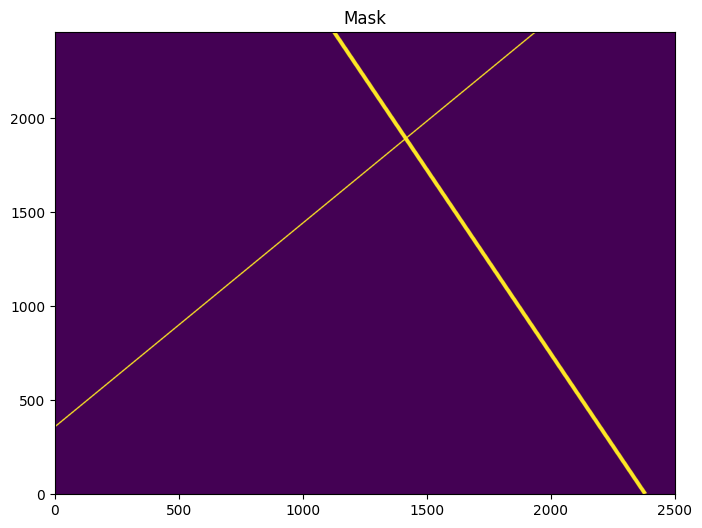

In [48]:
w2.plot_mask()

And there you go!

<a id="example6"></a>
## Example 6:  Create a new kernel for trail detection

We include a function called create_mrt_line_kernel that can be used to generate kernels for detecting trails of s specified size in the MRT. Note that kernels with widths of 1, 3, 7, and 15 pixels (convolved with a simple Gaussian HST/ACS psf model) are included already, but perhaps you want to generate a kernel with a new width, or convolved with a different PSF.

Let's generate a kernel for a trail that has an inherent width of 5 pixels and is convolved with a Gaussian PSF with `sigma=3`. 

INFO:utils_findsat_mrt:calculated endpoints: [(0, 511.5), (2047, 511.5)]


INFO:utils_findsat_mrt:Calculating median Radon Transform with 8 processes


INFO:utils_findsat_mrt:Inteprolating onto new grid to center kernel


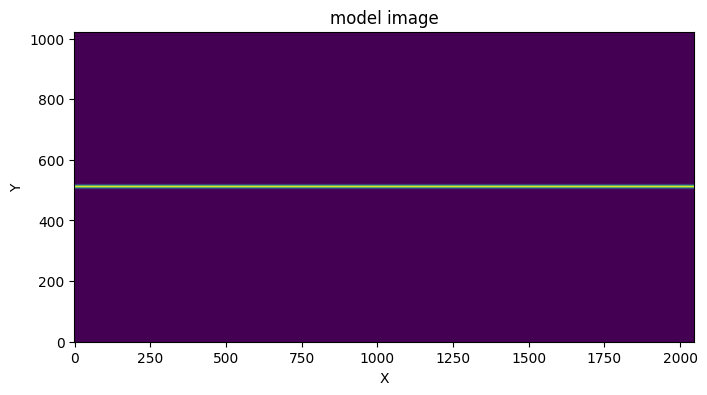

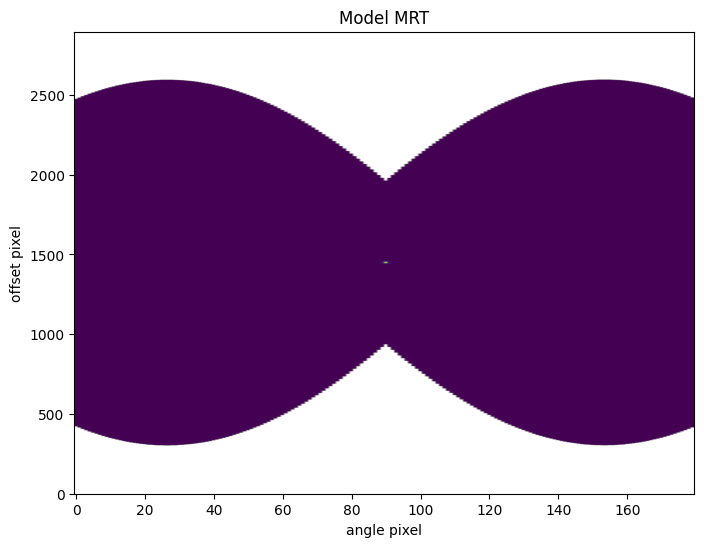

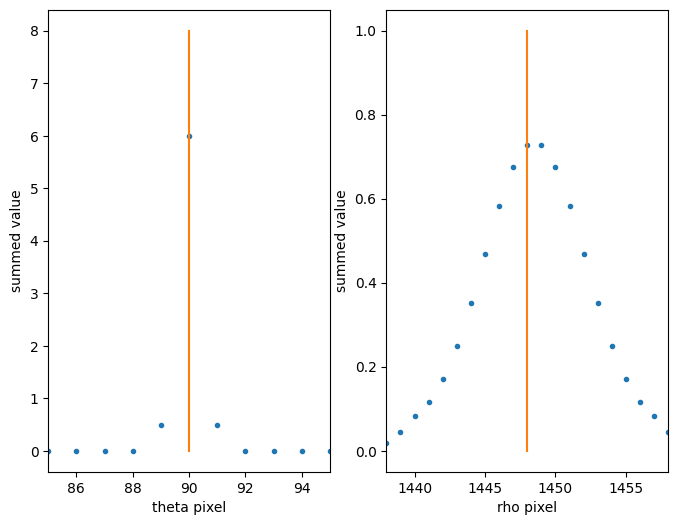

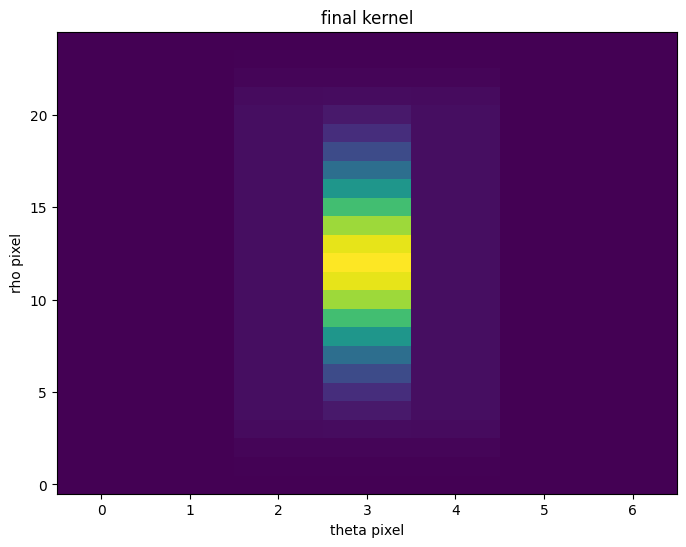

In [49]:
out = create_mrt_line_kernel(5, 3, processes=8, plot=True)

The first plot show the model streak. The second plot shows the resulting MRT. The kernsl is created by taking a cutout around the signal in the MRT. The third double-plot shows 1D slices of the signal in the MRT, with orange lines showing the location of the maximum values. These serve as first guesses of the center, after which the center is redetermined using a Guassian fit and the cutout extracted with the kernel perfectly centered. The 4th plot above shows the final kernel.

The kernel can be saved by defining the `outfile` keyword in `create_mrt_line_kernel`. By adding this file path into the `kernels` keyword in `TrailFinder` or `WfcWrapper`, it will be used for source detection when running `find_mrt_sources`.

<a id="about"></a>

## About this Notebook
**Author:** David V. Stark, ACS Instrument Team, Space Telescope Science Institute <br>
**First Published On:** 5/13/2023 <br>
**Updated On:** 5/15/2023

### For more help:

More details may be found on the [ACS website](http://www.stsci.edu/hst/instrumentation/acs) and in the [ACS Instrument](https://hst-docs.stsci.edu/display/ACSIHB) and [Data Handbooks](https://hst-docs.stsci.edu/acsdhb).

Please visit the [HST Help Desk](http://hsthelp.stsci.edu). Through the help desk portal, you can explore the HST Knowledge Base and request additional help from experts.

<hr>

[Top of Page](#titleFindsat)
<img style="float: right;" src="https://raw.githubusercontent.com/spacetelescope/hst_notebooks/main/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/> 